**GA with Selection only**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, gen, stp

In [3]:
def fit(s,cr,wgt):
    twgt = 0
    tval = 0
    for i, gn in enumerate(cr):
        if gn == 1:
            twgt += s[i][0]
            tval += s[i][1]
    if twgt <= wgt:
        return tval
    else:
        return 0

In [4]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]
    

In [5]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=2):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [6]:
def sc(config, criteria='ts'):
    p, wgt, s, gen, stop = getpop(config)
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, -1
    for generation in range(stop):
        fts = list(map(lambda ind: fit(s, ind, wgt), p))
        avgftg.append(np.mean(fts))
        bst = max(p, key=lambda x: fit(s, x, wgt))
        bstftgen = fit(s, bst, wgt)
        ftst.append(bstftgen)
        actg.append(sum(bst))
        if bstftgen > bstft:
            bstft, bstsol, bstgen = bstftgen, bst, generation + 1
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)  
            else:
                p1, p2 = ts(p, fts)
            newpop.extend([p1, p2])
        p = np.array(newpop)
    pfit = list(map(lambda ind: fit(s, ind, wgt), p))
    pactive = list(map(sum, p))
    return avgftg, ftst, actg, bstsol, bstft, bstgen, pfit, pactive

In [7]:
def res(avgft, ftst, actg, stop, bstft, bstgen, method, pfit, pactive):
    gen = range(0, stop)
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(gen, avgft, label="Average fts", color='blue', marker='o')
    plt.xlabel("Generation")
    plt.ylabel("fts")
    plt.title(f"Average fts (Selection Method: {method})")
    plt.grid(True)
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(gen, ftst, label="ftst Individual fts", color='green', marker='o')
    plt.plot(gen, actg, label="Active Genes (ftst)", color='orange', marker='x')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"ftst Individual (Selection Method: {method})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(6, 6))
    plt.scatter(pfit, pactive, color='red')
    plt.xlabel("fts in Final Population")
    plt.ylabel("Active Genes in Final Population")
    plt.title(f"fts vs Active Genes in Final Population (Selection Method: {method})")
    plt.grid(True)
    plt.show()
    print(f"bst fts: {bstft:.2f} in Generation {bstgen}")
    print(f"bst Solution Active Genes: {sum(actg)}")

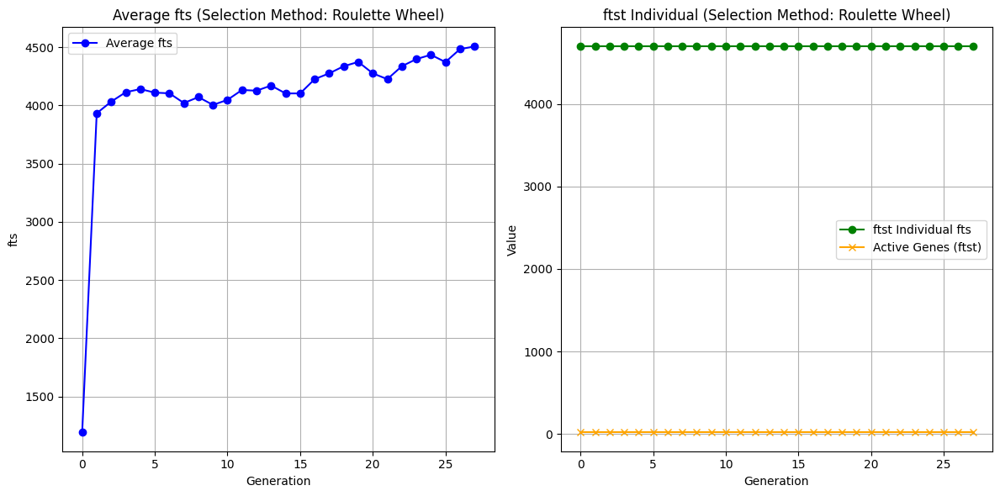

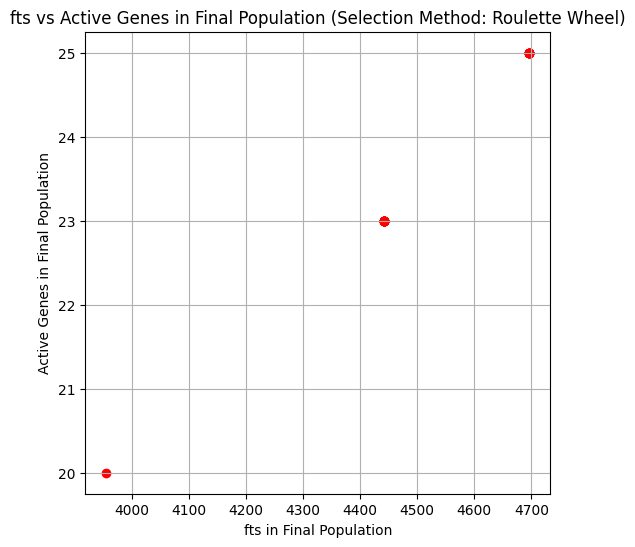

bst fts: 4696.00 in Generation 1
bst Solution Active Genes: 700


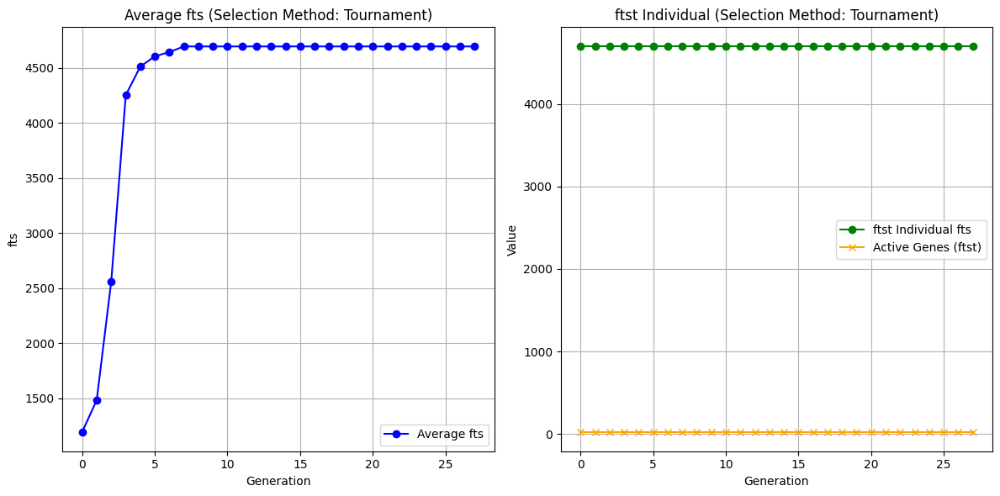

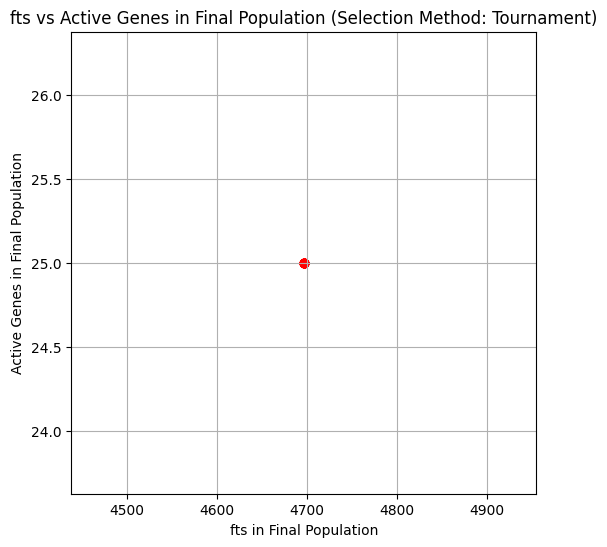

bst fts: 4696.00 in Generation 1
bst Solution Active Genes: 700


In [8]:
config = "config_1.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

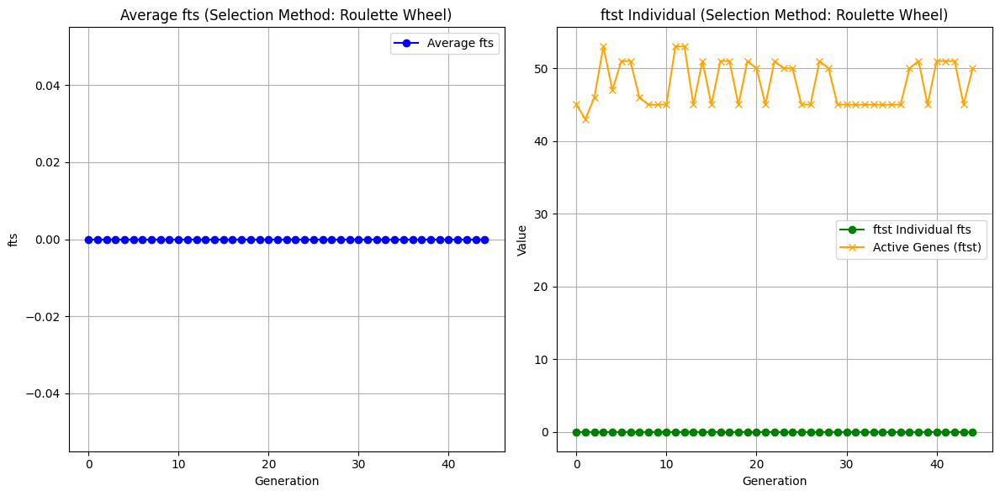

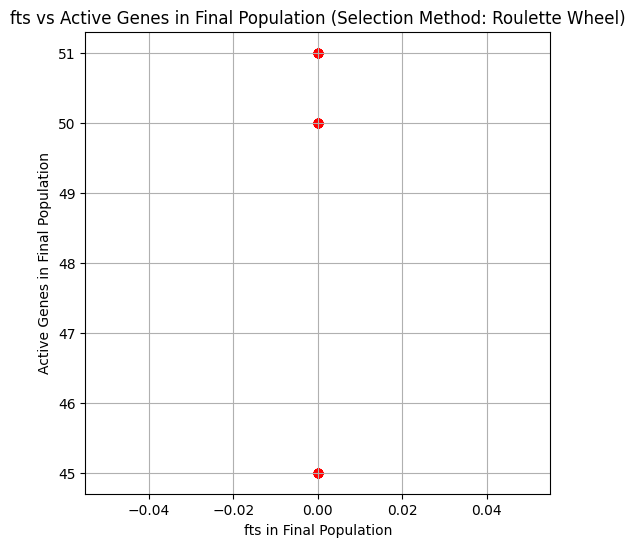

bst fts: 0.00 in Generation 1
bst Solution Active Genes: 2153


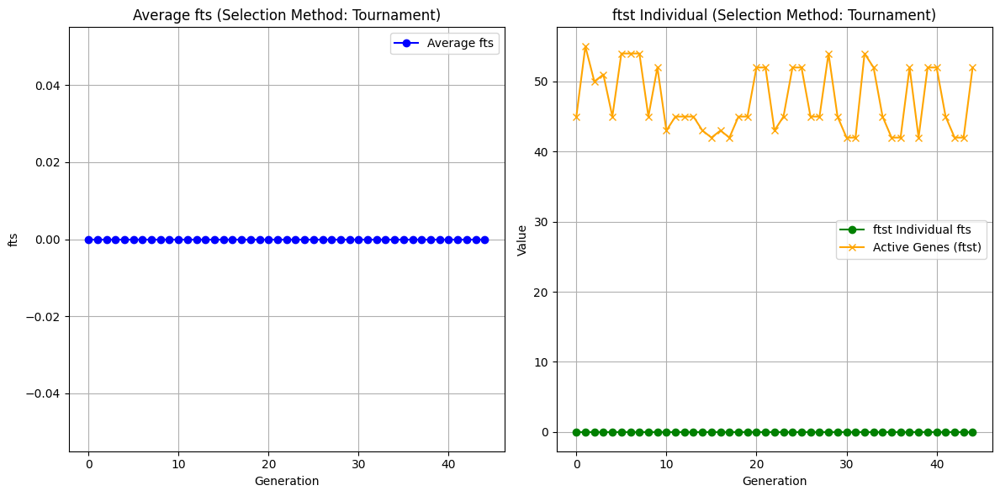

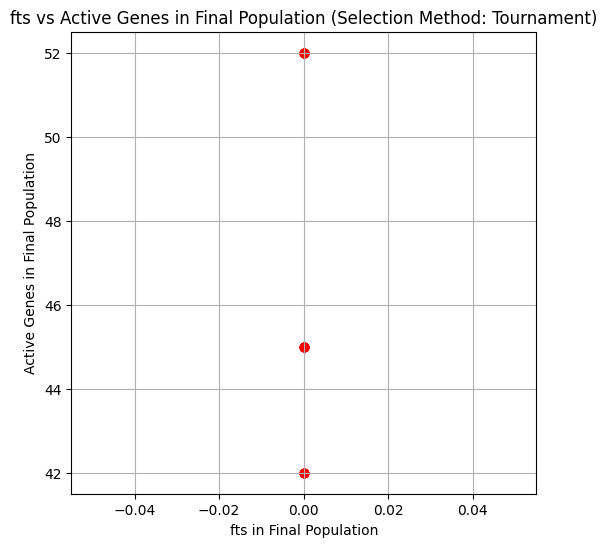

bst fts: 0.00 in Generation 1
bst Solution Active Genes: 2126


In [9]:
config = "config_2.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='tournament')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

**My Own Fitness Function**

In [10]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, gen, stp

In [11]:
def rpmyfit(individual, s, wgt):
    twgt = sum([s[i][0] for i in range(len(individual)) if individual[i] == 1])
    if twgt > wgt:
        rem = [(s[i][0]/s[i][1], i) for i in range(len(s))]
        rem.sort()
        for i, j in rem:
            if individual[j] == 1:
                individual[j] = 0
                twgt -= s[j][0]
                if twgt <= wgt:
                    break
    return individual

def myfit(individual, s, wgt, pfact=0.5):
    tval = 0
    twgt = 0
    for i, gene in enumerate(individual):
        if gene == 1:
            tval += s[i][1]
            twgt += s[i][0]
    if twgt <= wgt:
        ftscore = tval
    else:
        penalty = pfact * (twgt - wgt)
        ftscore = tval - penalty
    return ftscore

In [12]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]

In [13]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=3):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [14]:
def sc(config, criteria='ts'):
    p, wgt, s, generation, stop = getpop(config)
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, 0
    for gen in range(stop):
        fts = [myfit(i, s, wgt) for i in p]
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)
            else:
                p1, p2 = ts(p, fts)
            p1 = rpmyfit(p1, s, wgt)
            p2 = rpmyfit(p2, s, wgt)
            newpop.append(p1)
            newpop.append(p2)
        p = np.array(newpop)
        if gen == 0:
            avgftg.append(np.mean(fts))
            bstid = np.argmax(fts)
            ftsol = p[bstid]
            f = fts[bstid]
            twgt = sum([s[i][0] * gene for i, gene in enumerate(ftsol)])
            if twgt <= wgt:
                ftst.append(f)
                actg.append(sum(ftsol))
        nfts = [myfit(i, s, wgt) for i in p]
        avgftg.append(np.mean(nfts))
        bstid = np.argmax(nfts)
        ftsol = p[bstid]
        f = nfts[bstid]
        ftst.append(f)
        actg.append(sum(ftsol))
        if f > bstft:
            bstft, bstsol, bstgen = f, ftsol, gen
    pfit = list(map(lambda i: myfit(i, s, wgt), p))
    pactive = list(map(sum, p))
    return avgftg, ftst, actg, bstsol, bstft, bstgen, pfit, pactive

In [15]:
def res(avgft, ftst, actg, stop, bstft, bstgen, method, pfit, pactive):
    gen = range(0, stop)
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(gen, avgft, label="Average fts", color='blue', marker='o')
    plt.xlabel("Generation")
    plt.ylabel("fts")
    plt.title(f"Average fts (Selection Method: {method})")
    plt.grid(True)
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(gen, ftst, label="ftst Individual fts", color='green', marker='o')
    plt.plot(gen, actg, label="Active Genes (ftst)", color='orange', marker='x')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"ftst Individual (Selection Method: {method})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(6, 6))
    plt.scatter(pfit, pactive, color='red')
    plt.xlabel("fts in Final Population")
    plt.ylabel("Active Genes in Final Population")
    plt.title(f"fts vs Active Genes in Final Population (Selection Method: {method})")
    plt.grid(True)
    plt.show()
    print(f"bst fts: {bstft:.2f} in Generation {bstgen}")
    print(f"bst Solution Active Genes: {sum(actg)}")

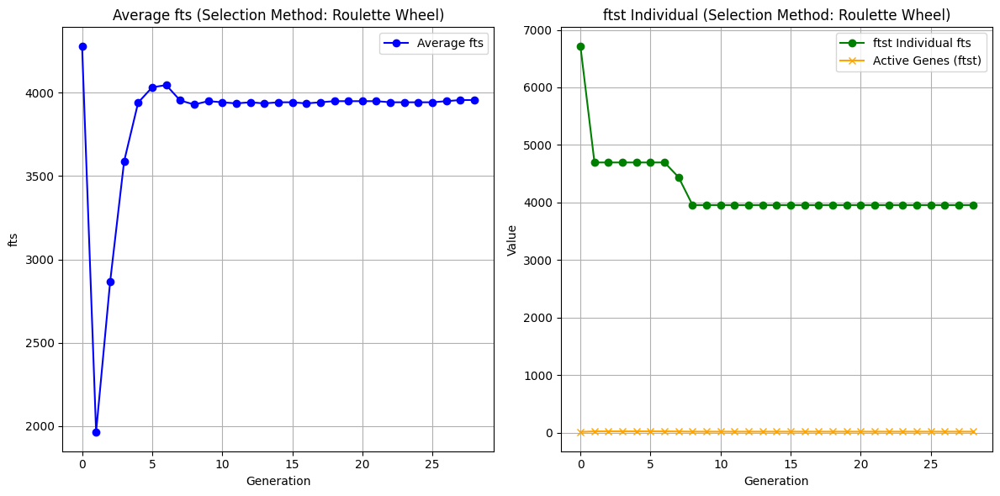

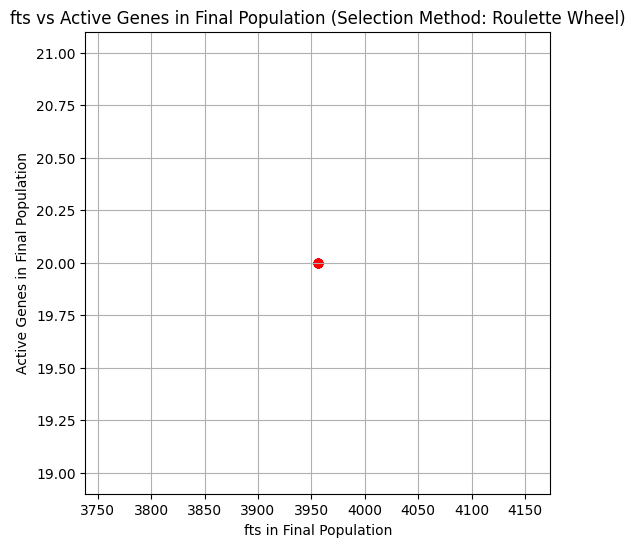

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 608


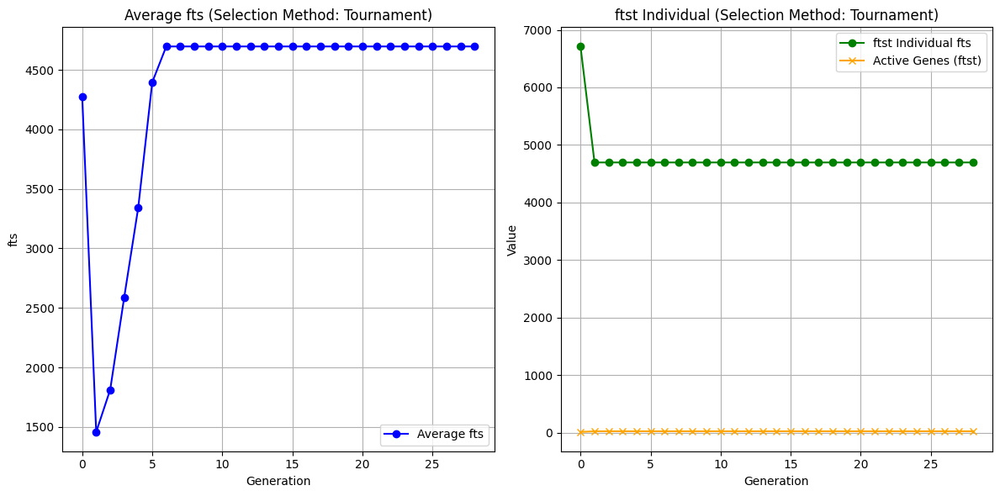

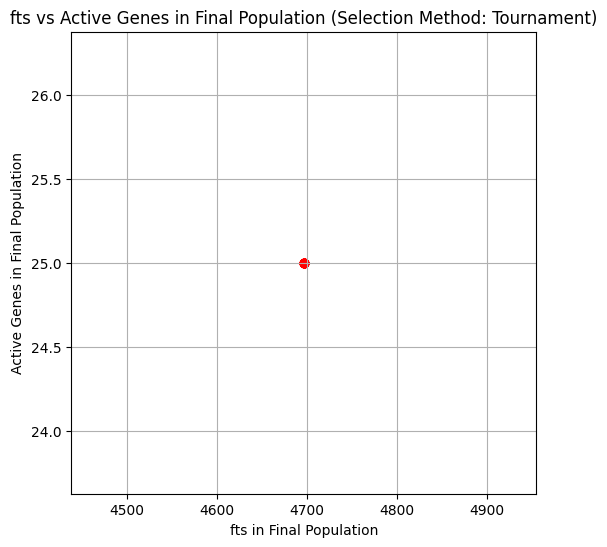

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 714


In [16]:
config = "config_1.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

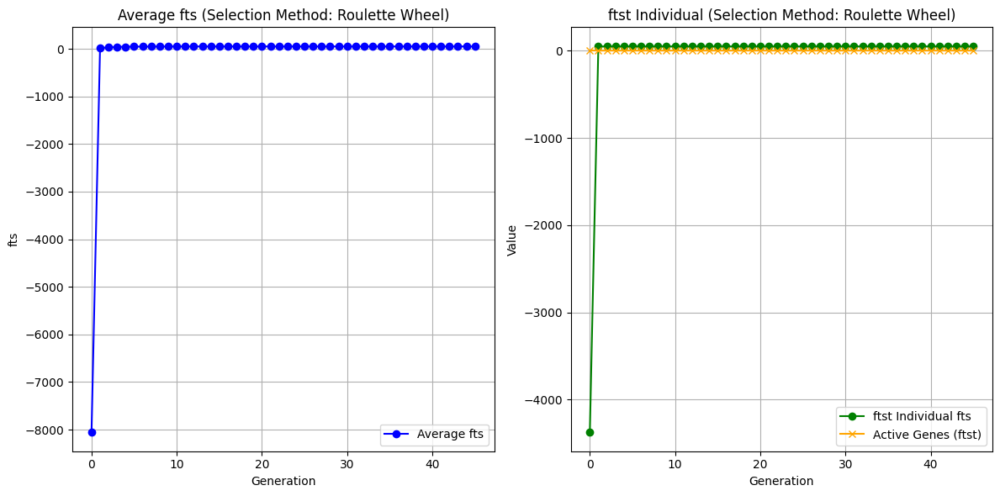

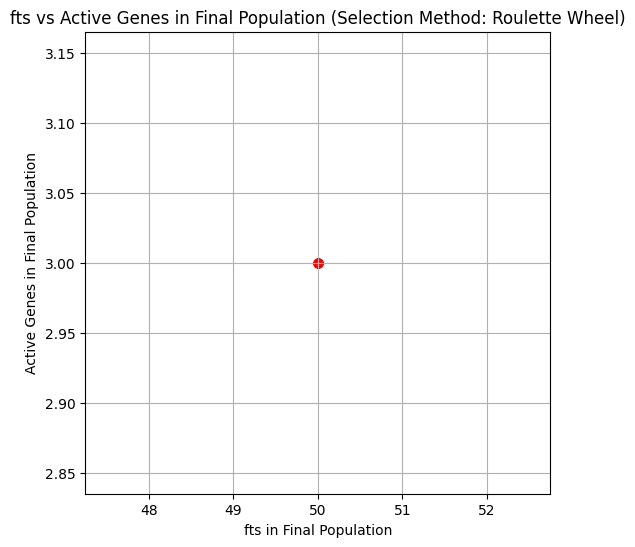

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 140


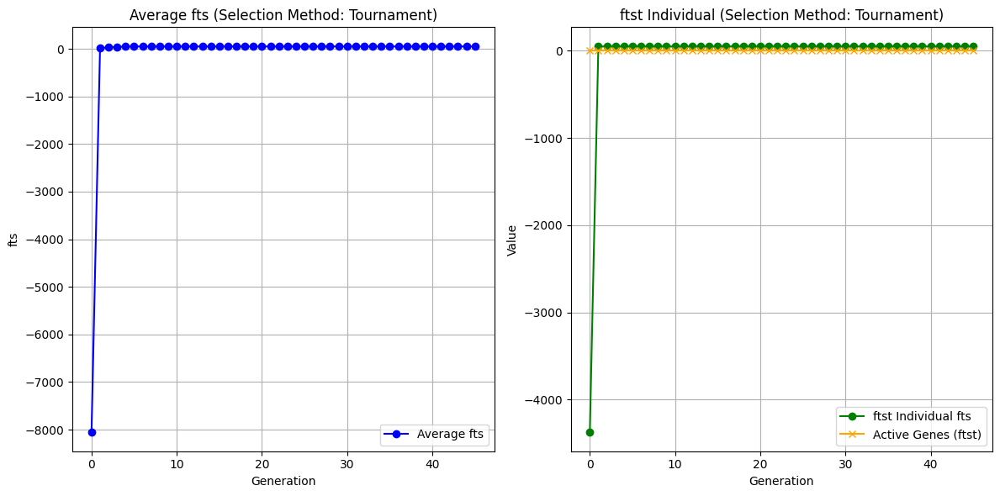

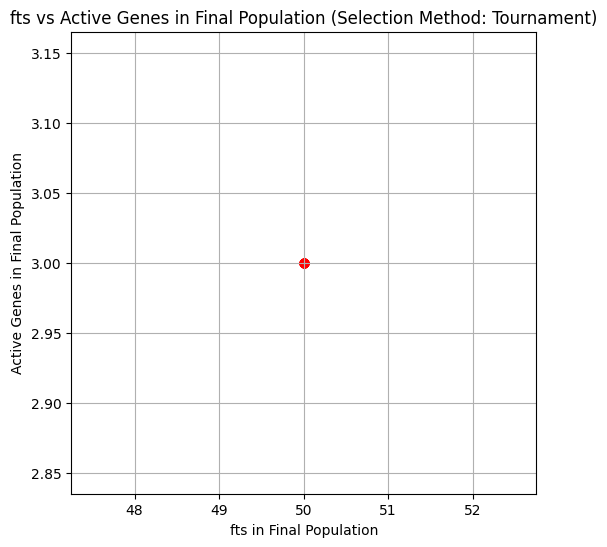

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 138


In [17]:
config = "config_2.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

**GA with crossover and mutation**

In [18]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, gen, stp

In [19]:
def fit(cr,s,wgt):
    twgt = 0
    tval = 0
    for i, gn in enumerate(cr):
        if gn == 1:
            twgt += s[i][0]
            tval += s[i][1]
    if twgt <= wgt:
        return tval
    else:
        return 0

In [20]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]

In [21]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=3):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [22]:
def co(parent1,parent2, cort = 0.1):
    r = np.random.rand()
    if r <= cort:
        child1 = parent1
        child2 = parent2
    else:
        cp = np.random.randint(1,len(parent1 -1))
        child1 = np.concatenate([parent1[:cp], parent2[cp:]])
        child2 = np.concatenate([parent1[cp:], parent2[:cp]])
    return child1, child2

In [23]:
def mut(cr, mrt):
    num = np.random.rand()
    for i in range(len(cr)):
        if num < mrt:
            if cr[i] == 1:
                cr[i] = 0
            else:
                cr[i] = 1
    return cr

In [24]:
def sc(config, criteria='ts', mrt=0.1):
    p, wgt, s, generation, stop = getpop(config)
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, 0
    for gen in range(stop):
        fts = [fit(i, s, wgt) for i in p]
        avgftg.append(np.mean(fts))
        bstid = np.argmax(fts)
        ftsol = p[bstid]
        f = fts[bstid]
        ftst.append(f)
        actg.append(sum(ftsol))
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)
            else:
                p1, p2 = ts(p, fts)
            child1, child2 = co(p1, p2)
            child1 = mut(child1, mrt)
            child2 = mut(child2, mrt)
            newpop.append(child1)
            newpop.append(child2)
        p = np.array(newpop)
        if f > bstft:
            bstft, bstsol, bstgen = f, ftsol, gen
    pfit = list(map(lambda i: fit(s, i, wgt), p))
    pactive = list(map(sum, p))
    
    print(bstsol)
    return (avgftg, ftst, actg, bstsol, bstft, bstgen, pfit, pactive)


In [25]:
def viz(rdata, tdata, mrt):
    genr = range(len(rdata[0]))
    tgen = range(len(tdata[0]))
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(genr, rdata[0], label="Avg Fitness", color='blue', marker='o')
    plt.plot(genr, rdata[1], label="Fittest Fitness", color='blue', marker='x')
    plt.plot(genr, rdata[2], label="Active Genes", color='blue', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Roulette Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(tgen, tdata[0], label="Avg Fitness", color='red', marker='o')
    plt.plot(tgen, tdata[1], label="Fittest Fitness", color='red', marker='x')
    plt.plot(tgen, tdata[2], label="Active Genes", color='red', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Tournament Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def cmpr(config):
    rlts = []
    for mrt in np.arange(0, 0.25, 0.05):
        print(f"\n--- Mutation Rate: {mrt} ---")
        rdata = sc(config, criteria='rws', mrt=mrt)
        tdata = sc(config, criteria='ts', mrt=mrt)
        rlts.append({
            'mrt':mrt,
            'rws fit': rdata[4],
            'rws gen': rdata[5],
            'ts fit': tdata[4],
            'ts gen': tdata[5]
        })
        res(rdata[0], rdata[1], rdata[2], len(rdata[0]), rdata[4], rdata[5], 'rws', rdata[6], rdata[7])
        res(tdata[0], tdata[1], tdata[2], len(tdata[0]), tdata[4], tdata[5], 'Tournament', tdata[6], tdata[7])
        print(f"Best Overall Solution (Roulette): Fitness = {rdata[4]}, Generation = {rdata[5]}")
        print(f"Best Overall Solution (Tournament): Fitness = {tdata[4]}, Generation = {tdata[5]}")
    results = pd.DataFrame(rlts)
    print("Results:")
    print(results)


--- Mutation Rate: 0.0 ---
[1 1 0 0 0 0 1 0 0 0 1 1 1 1 1 1 0 1 0 1 1 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 0 1 1 1]
[1 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 1 0 1 0 1 1 1 0 0 1 0 0
 1 0 1 0 0 1 0 1 0 1 1 1 1]


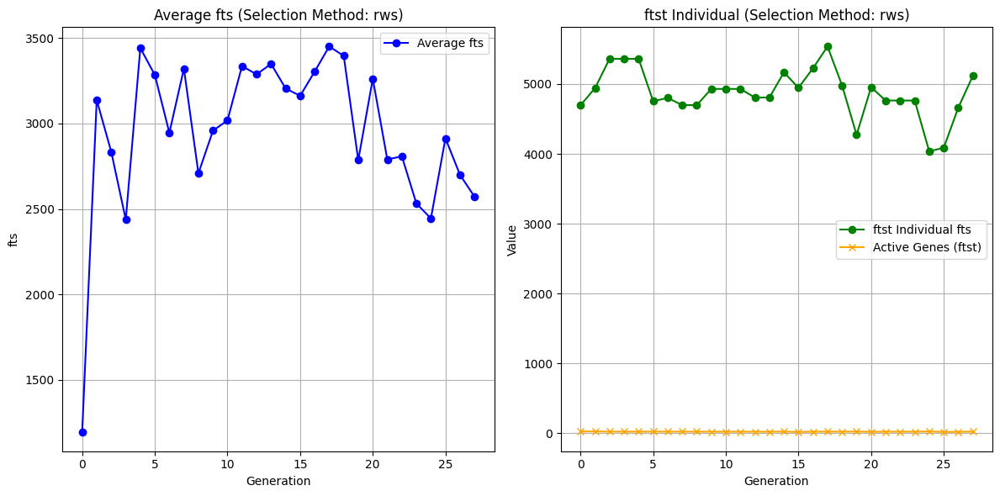

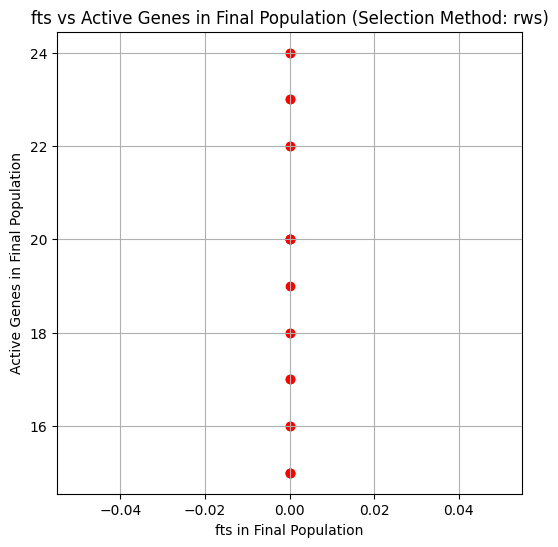

bst fts: 5538.00 in Generation 17
bst Solution Active Genes: 603


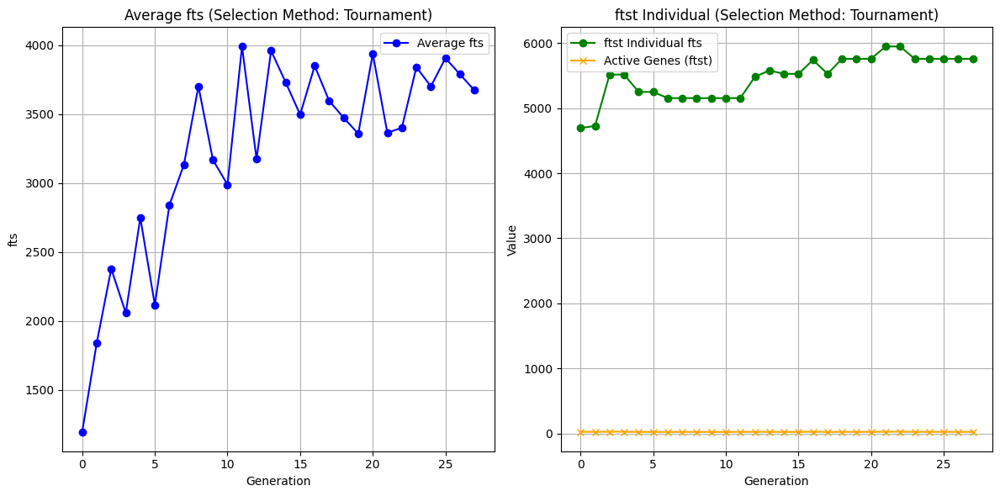

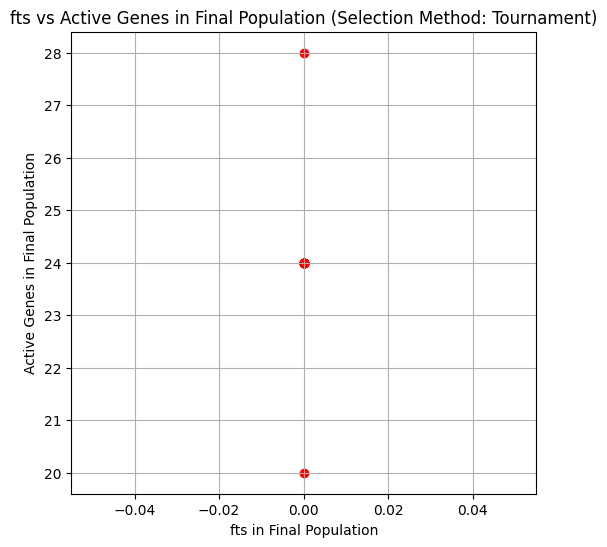

bst fts: 5950.00 in Generation 21
bst Solution Active Genes: 672
Best Overall Solution (Roulette): Fitness = 5538, Generation = 17
Best Overall Solution (Tournament): Fitness = 5950, Generation = 21

--- Mutation Rate: 0.05 ---
[1 1 1 1 1 0 1 0 0 1 0 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0]
[0 1 1 1 1 0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 1 0 1 0 0 0 0 0 1 1 0 0 1 0 0
 1 0 1 0 0 1 0 0 0 0 1 1 1]


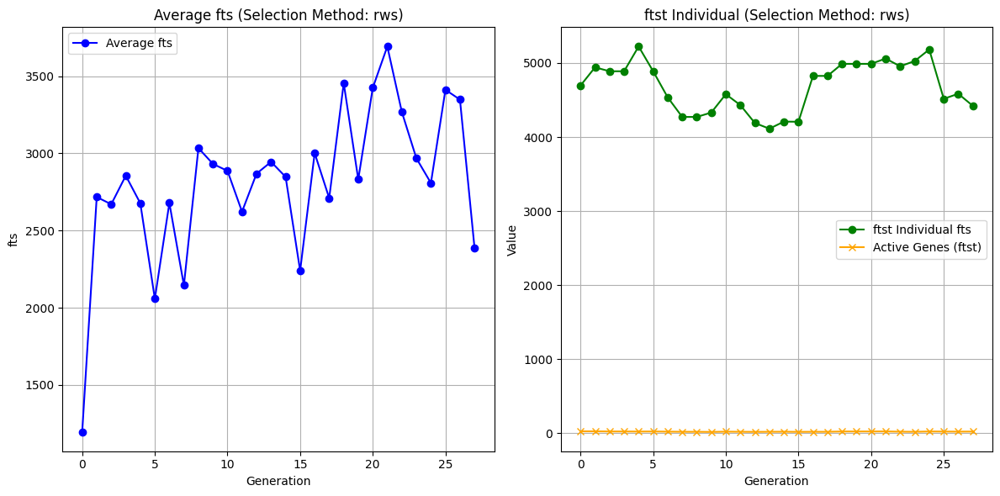

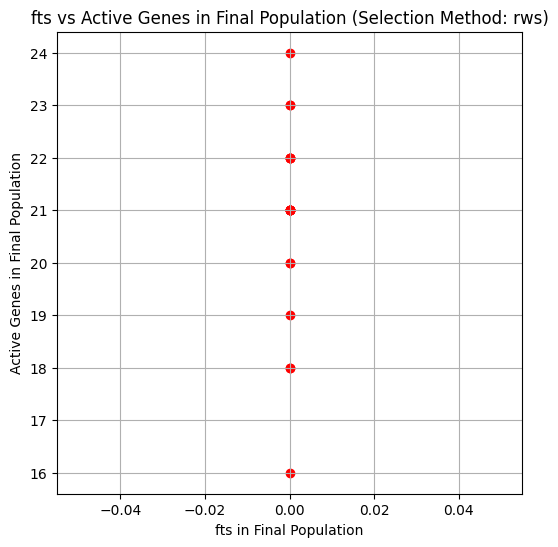

bst fts: 5224.00 in Generation 4
bst Solution Active Genes: 590


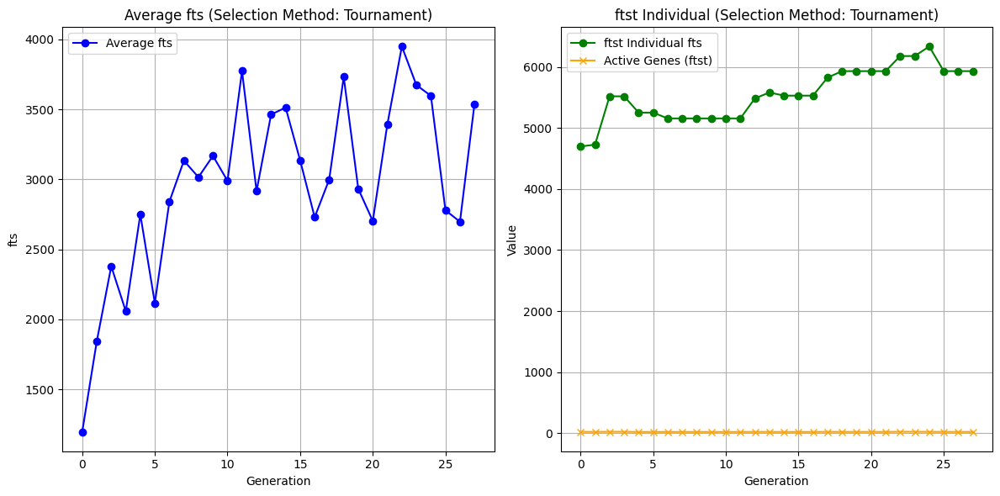

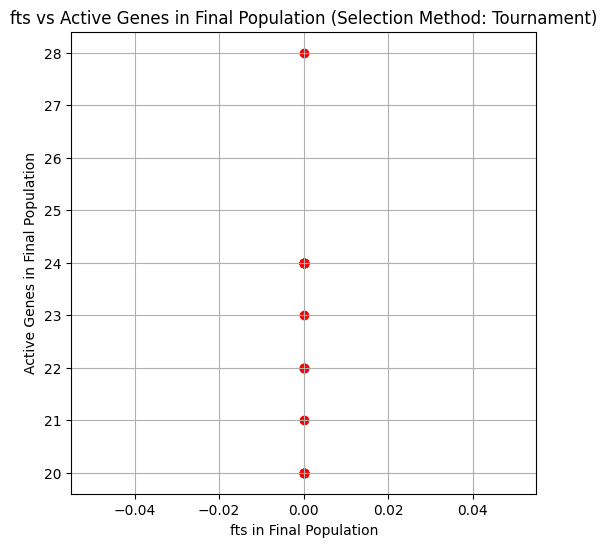

bst fts: 6334.00 in Generation 24
bst Solution Active Genes: 672
Best Overall Solution (Roulette): Fitness = 5224, Generation = 4
Best Overall Solution (Tournament): Fitness = 6334, Generation = 24

--- Mutation Rate: 0.1 ---
[1 0 1 1 0 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 0 0 1 1 1]
[1 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1
 0 1 0 0 1 1 0 0 0 1 0 1 1]


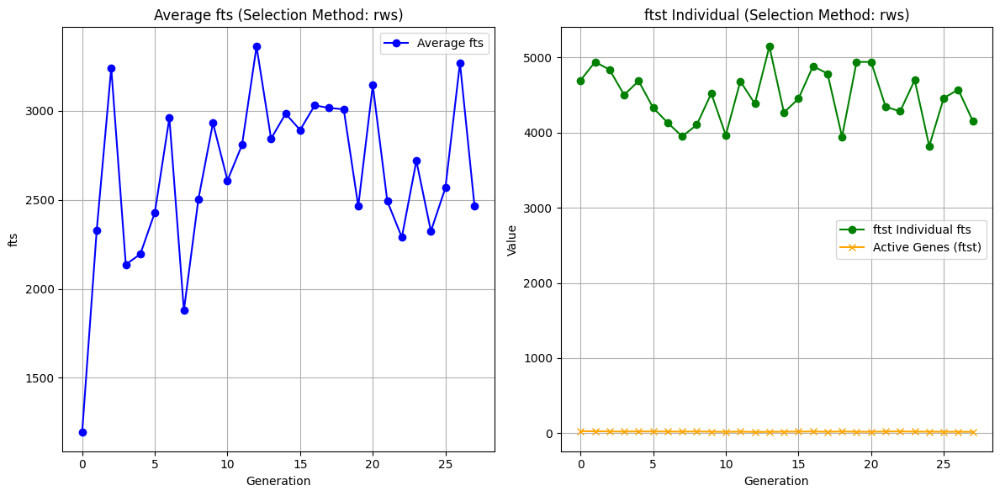

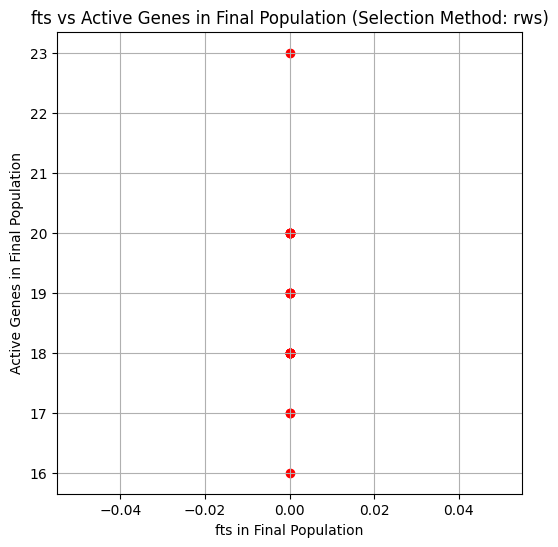

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


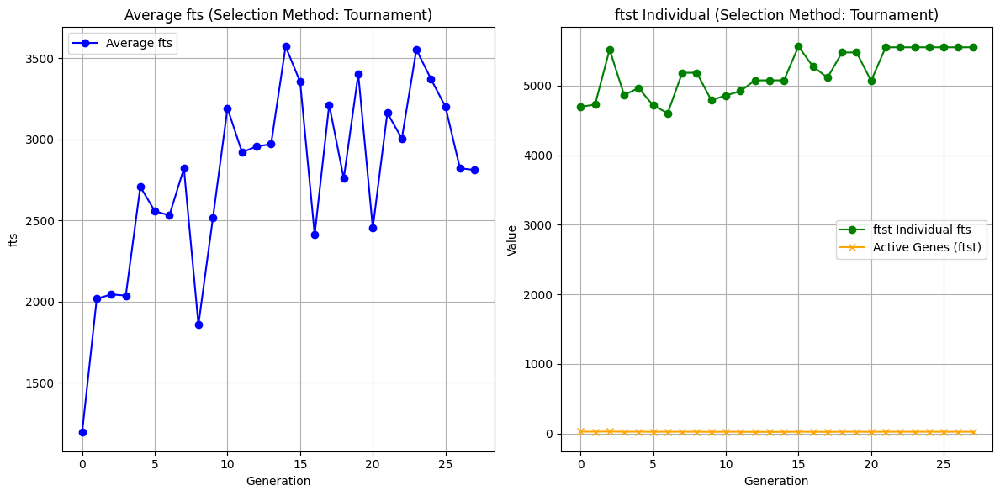

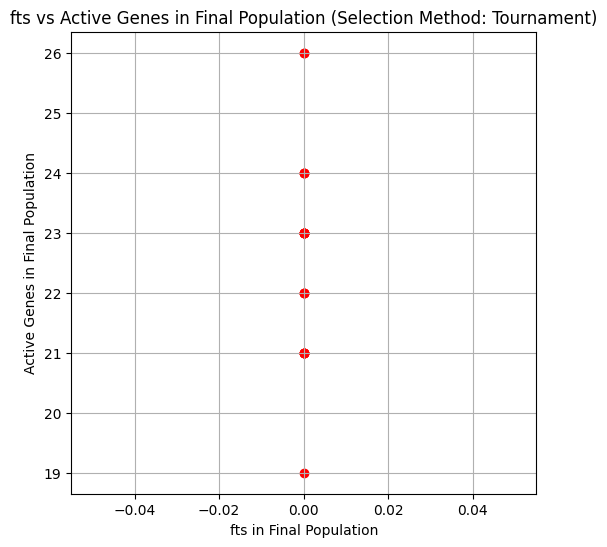

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637
Best Overall Solution (Roulette): Fitness = 5148, Generation = 13
Best Overall Solution (Tournament): Fitness = 5563, Generation = 15

--- Mutation Rate: 0.15000000000000002 ---
[0 1 1 1 0 1 1 1 0 0 1 1 1 0 1 1 0 0 1 0 1 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0
 0 1 1 0 0 1 0 1 0 1 0 1 1]
[1 1 0 1 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 1 0 0 1 1 0 1 1 0 0
 1 1 0 0 1 1 0 0 0 1 1 0 1]


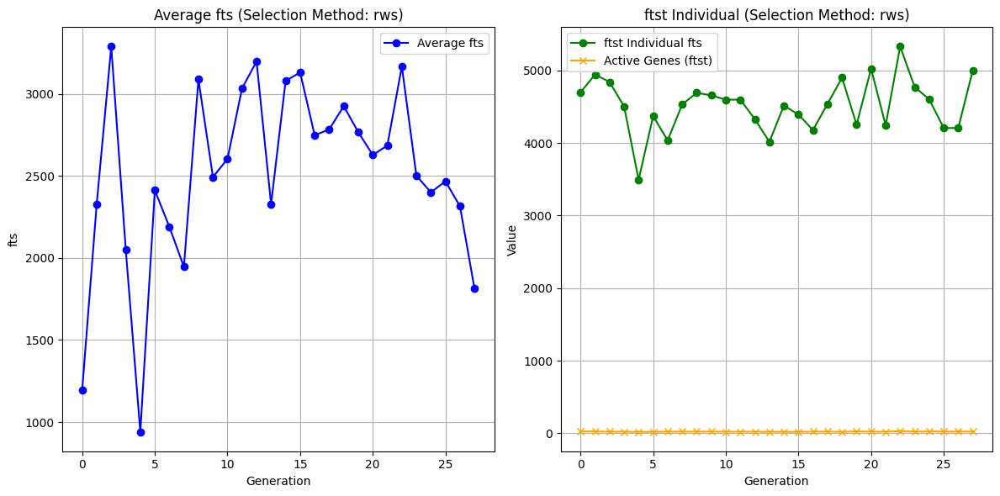

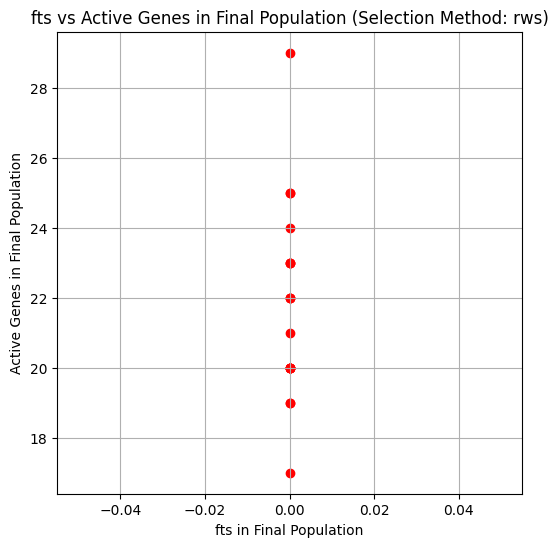

bst fts: 5329.00 in Generation 22
bst Solution Active Genes: 621


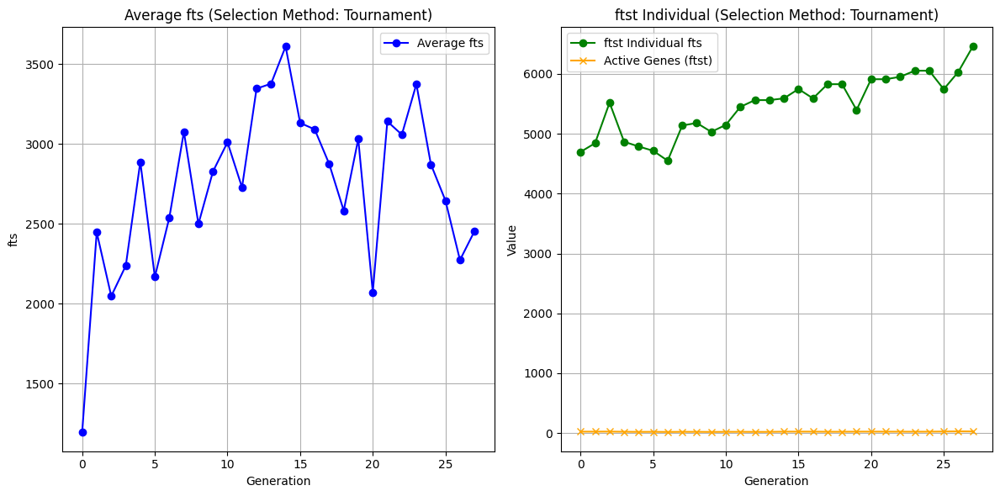

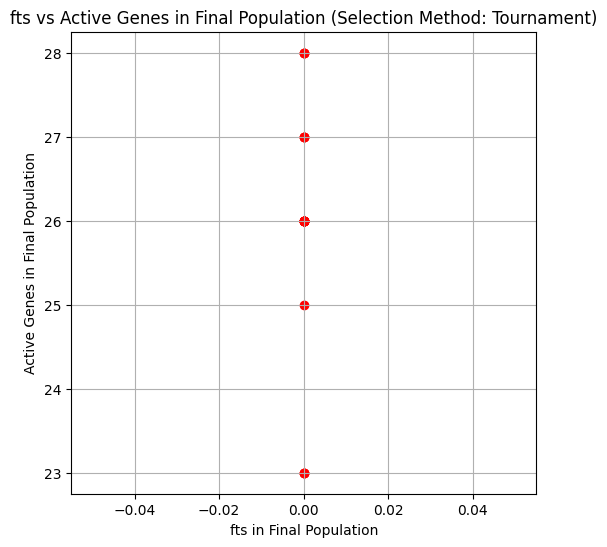

bst fts: 6457.00 in Generation 27
bst Solution Active Genes: 664
Best Overall Solution (Roulette): Fitness = 5329, Generation = 22
Best Overall Solution (Tournament): Fitness = 6457, Generation = 27

--- Mutation Rate: 0.2 ---
[0 1 0 0 1 0 0 1 0 0 1 1 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 1 1 1 0 0 0 1 1 1 0
 0 0 1 0 0 0 0 1 0 1 1 0 1]
[1 1 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 0
 1 0 0 0 1 1 0 1 0 0 1 1 1]


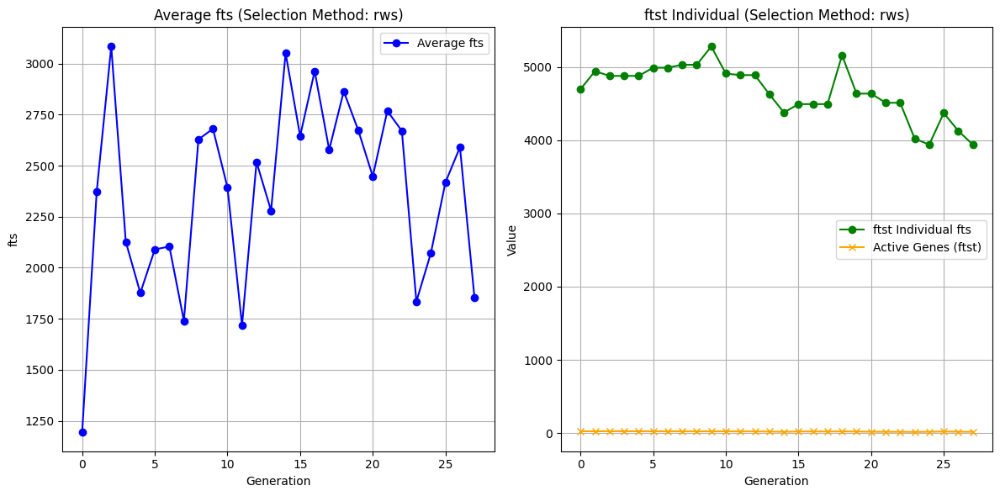

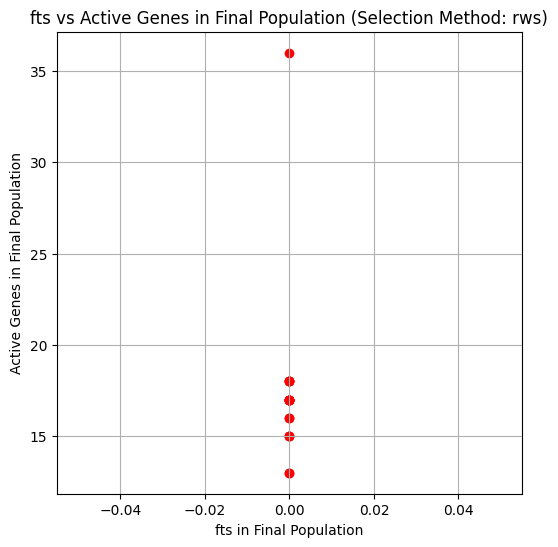

bst fts: 5279.00 in Generation 9
bst Solution Active Genes: 612


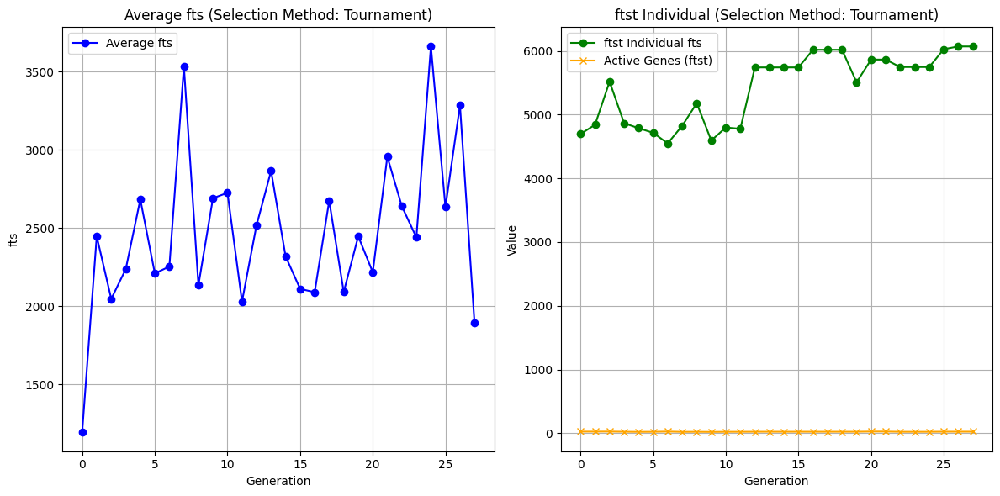

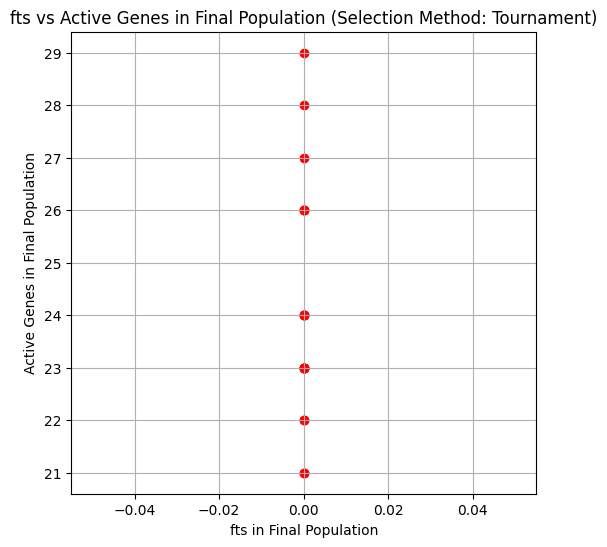

bst fts: 6070.00 in Generation 26
bst Solution Active Genes: 649
Best Overall Solution (Roulette): Fitness = 5279, Generation = 9
Best Overall Solution (Tournament): Fitness = 6070, Generation = 26
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00     5538       17    5950      21
1  0.05     5224        4    6334      24
2  0.10     5148       13    5563      15
3  0.15     5329       22    6457      27
4  0.20     5279        9    6070      26

--- Mutation Rate: 0.0 ---
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]


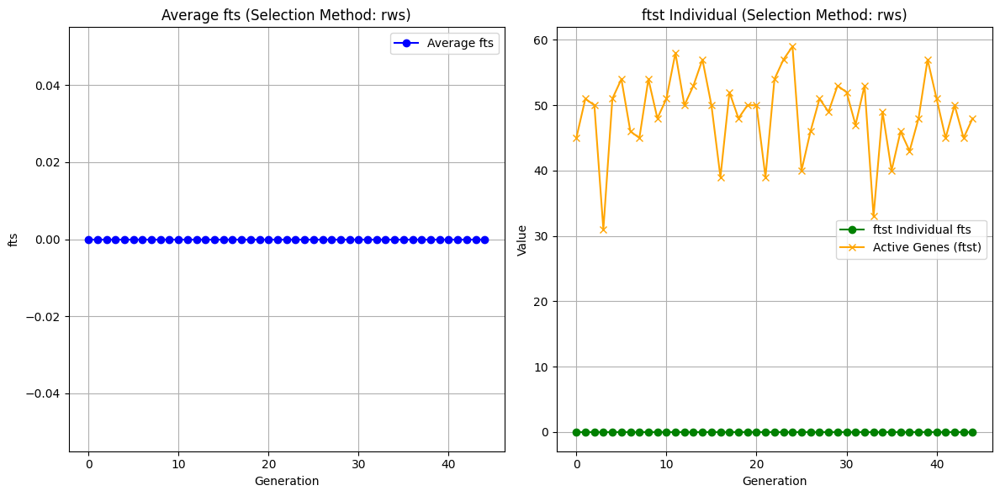

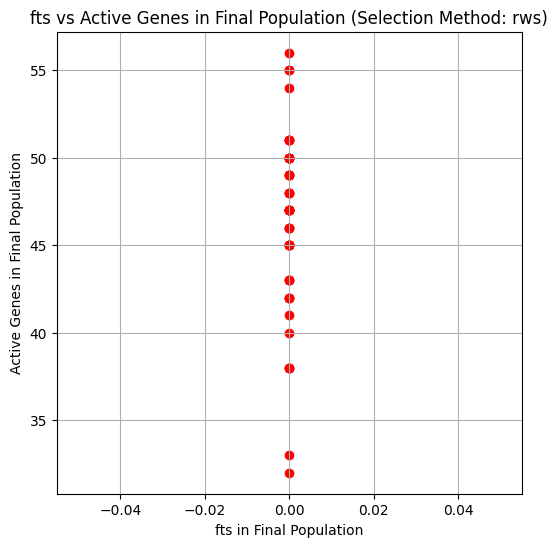

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2188


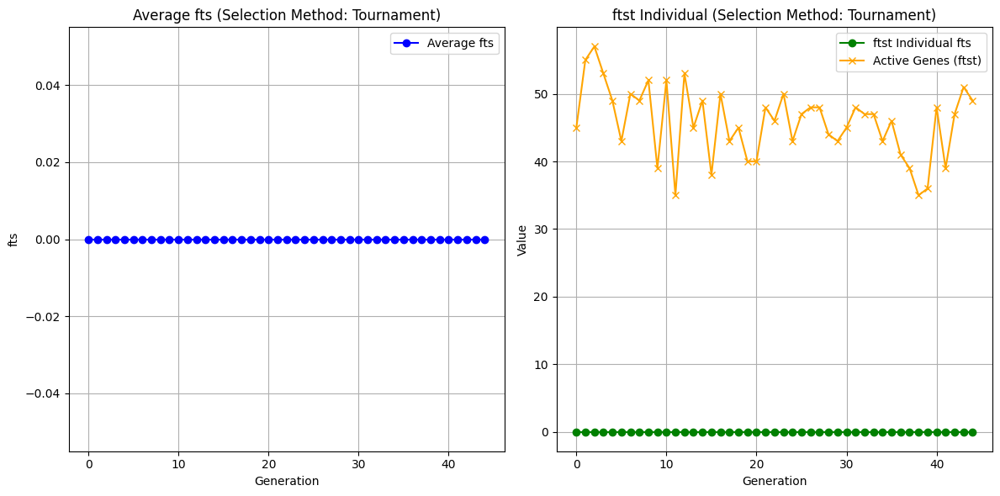

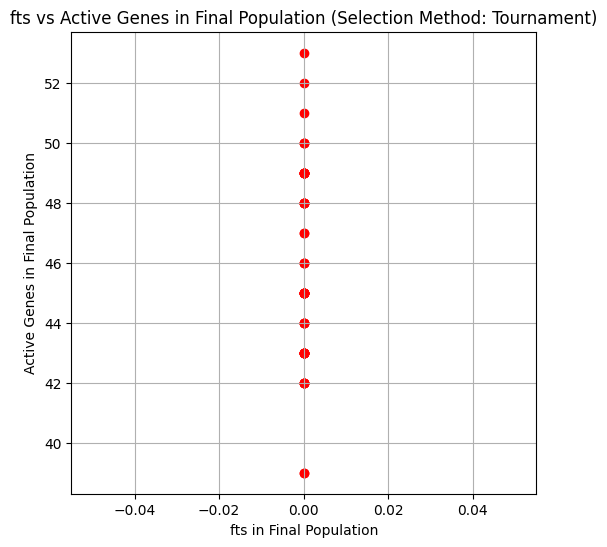

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2060
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.05 ---
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]


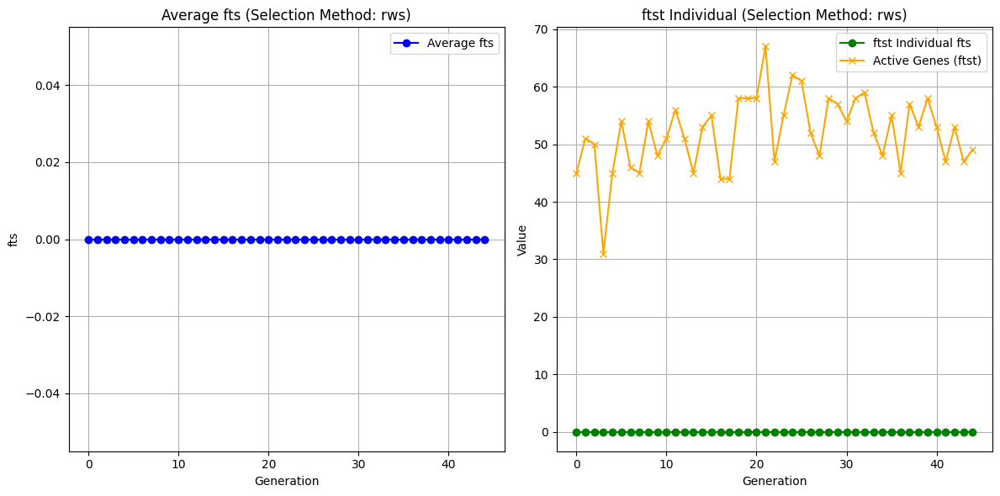

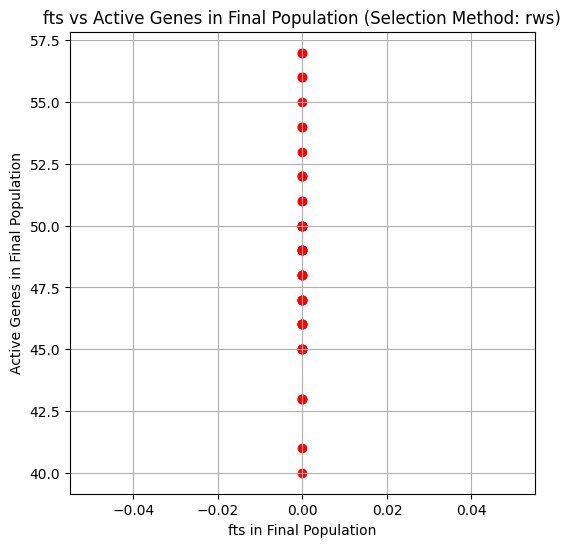

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2337


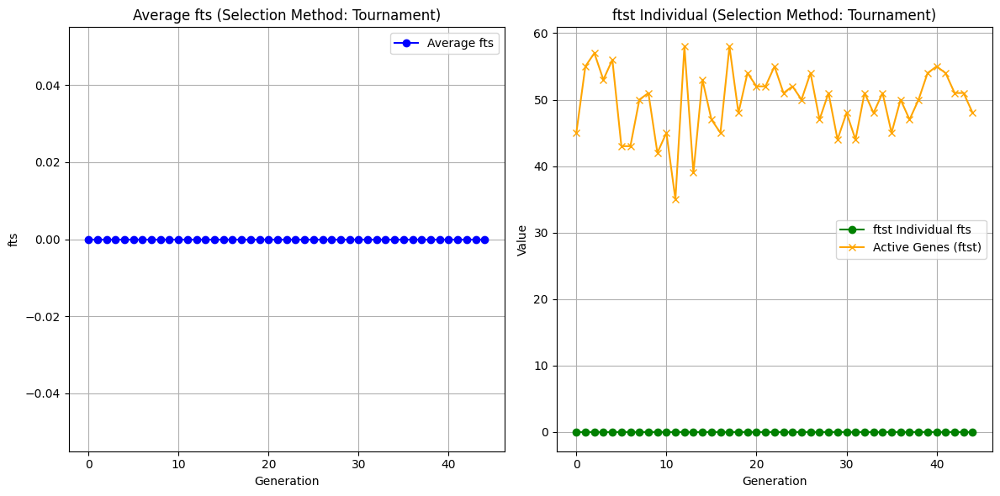

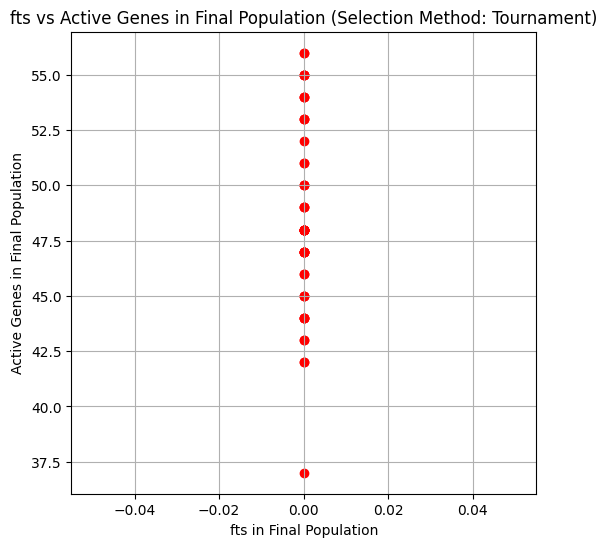

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2232
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.1 ---
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]


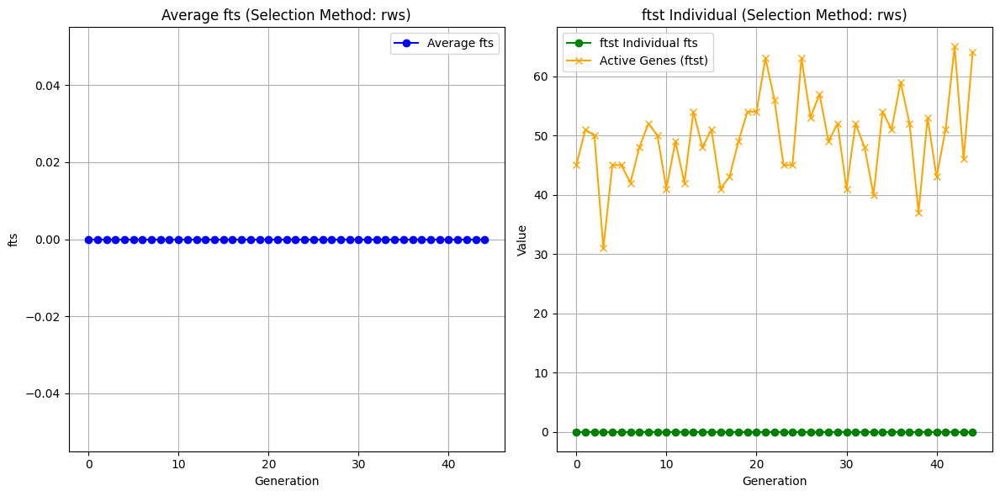

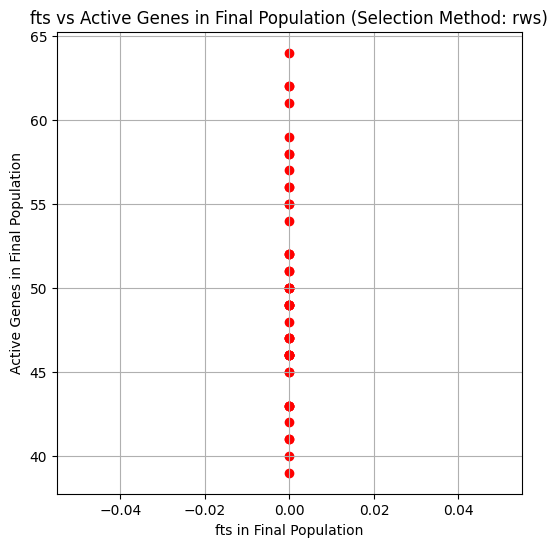

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2224


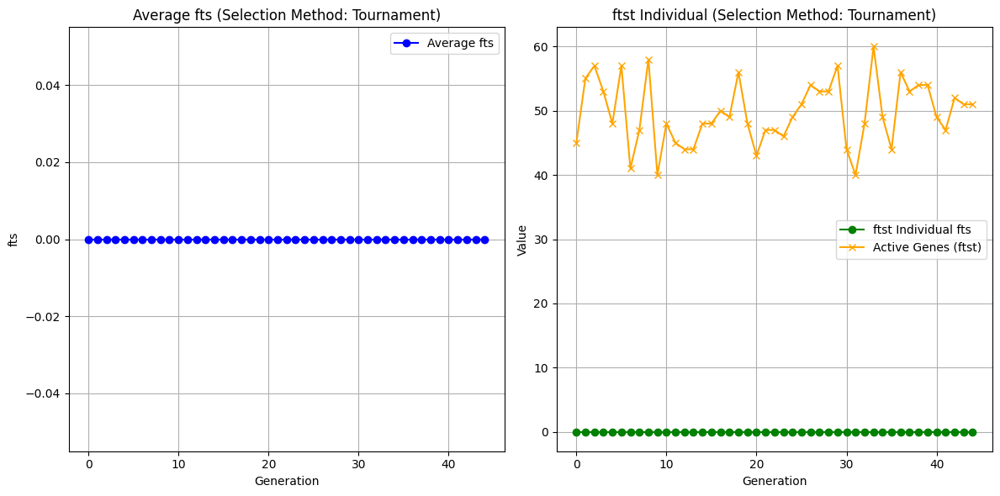

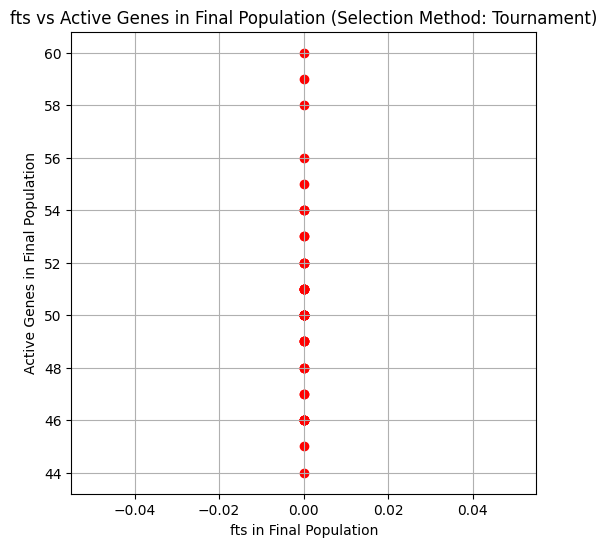

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2233
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.15000000000000002 ---
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]


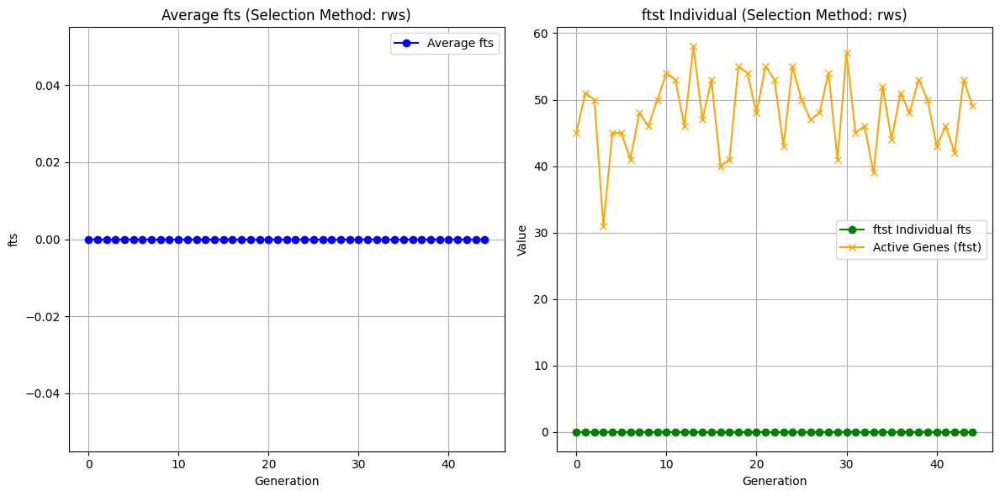

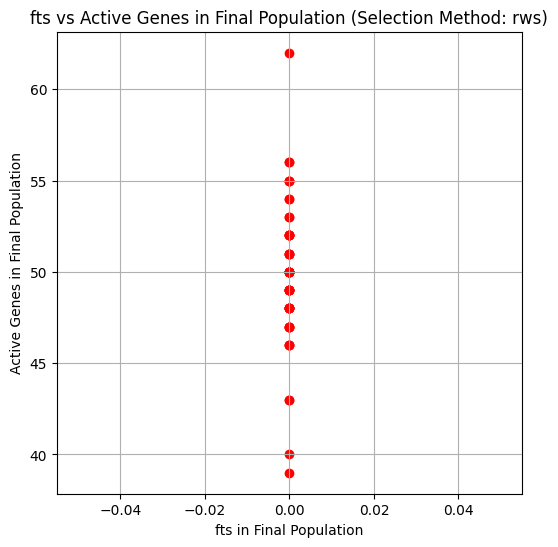

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2165


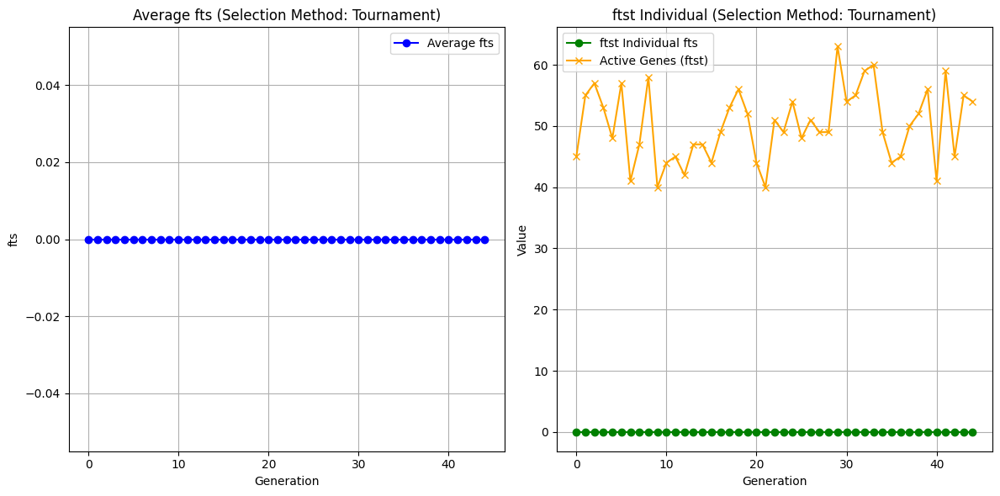

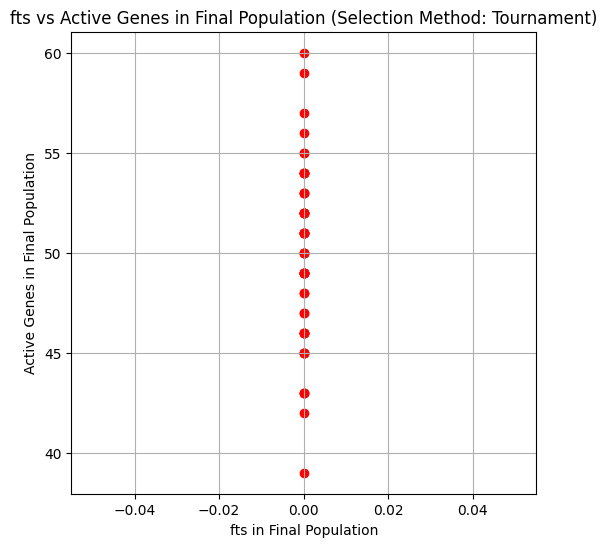

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2256
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.2 ---
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]
[0 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0
 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1]


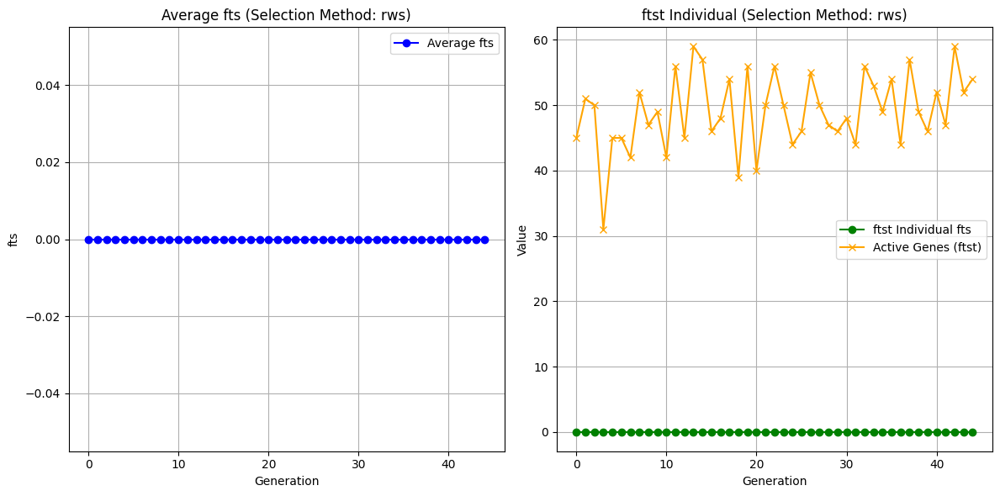

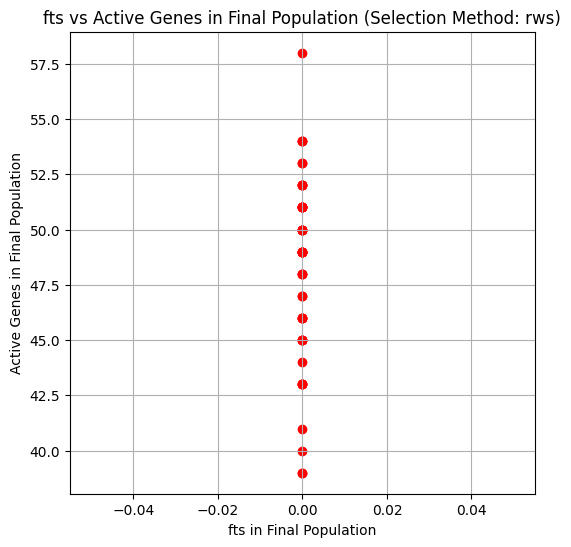

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2207


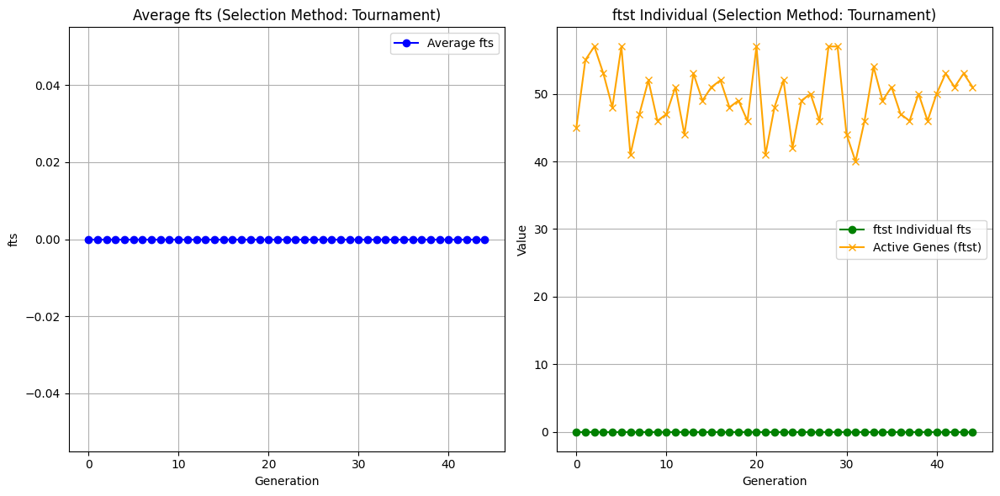

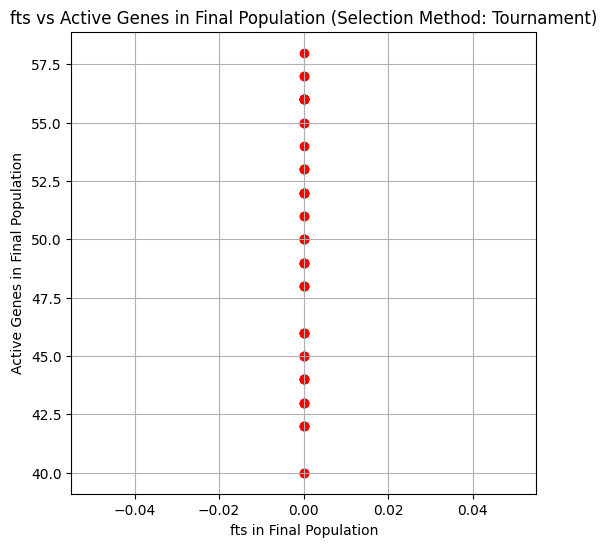

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 2221
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00        0        0       0       0
1  0.05        0        0       0       0
2  0.10        0        0       0       0
3  0.15        0        0       0       0
4  0.20        0        0       0       0


In [26]:
config = "config_1.txt"
cmpr(config)
config = "config_2.txt"
cmpr(config)

**GA with Crossover and Mutation (Own fitness function)**

In [27]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, gen, stp

In [28]:
def rpmyfit(individual, s, wgt):
    twgt = sum([s[i][0] for i in range(len(individual)) if individual[i] == 1])
    if twgt > wgt:
        rem = [(s[i][0]/s[i][1], i) for i in range(len(s))]
        rem.sort()
        for i, j in rem:
            if individual[j] == 1:
                individual[j] = 0
                twgt -= s[j][0]
                if twgt <= wgt:
                    break
    return individual

def myfit(individual, s, wgt, pfact=0.5):
    tval = 0
    twgt = 0
    for i, gene in enumerate(individual):
        if gene == 1:
            tval += s[i][1]
            twgt += s[i][0]
    if twgt <= wgt:
        ftscore = tval
    else:
        penalty = pfact * (twgt - wgt)
        ftscore = tval - penalty
    return ftscore

In [29]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]

In [30]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=3):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [31]:
def co(parent1,parent2, cort = 0.1):
    r = np.random.rand()
    if r <= cort:
        child1 = parent1
        child2 = parent2
    else:
        cp = np.random.randint(1,len(parent1 -1))
        child1 = np.concatenate([parent1[:cp], parent2[cp:]])
        child2 = np.concatenate([parent1[cp:], parent2[:cp]])
    return child1,child2

In [32]:
def mut(cr, mrt):
    num = np.random.rand()
    for i in range(len(cr)):
        if num < mrt:
            if cr[i] == 1:
                cr[i] = 0
            else:
                cr[i] = 1
    return cr

In [33]:
def sc(config, criteria='ts', mrt=0.1):
    p, wgt, s, generation, stop = getpop(config)
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, 0
    for gen in range(stop):
        fts = [myfit(i, s, wgt) for i in p]
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)
            else:
                p1, p2 = ts(p, fts)
            child1, child2 = co(p1, p2)
            child1 = mut(child1, mrt)
            child2 = mut(child2, mrt)
            child1 = rpmyfit(child1, s, wgt)
            child2 = rpmyfit(child2, s, wgt)
            newpop.append(child1)
            newpop.append(child2)
        p = np.array(newpop)
        if gen == 0:
            avgftg.append(np.mean(fts))
            bstid = np.argmax(fts)
            ftsol = p[bstid]
            f = fts[bstid]
            twgt = sum([s[i][0] * gene for i, gene in enumerate(ftsol)])
            if twgt <= wgt:
                ftst.append(f)
                actg.append(sum(ftsol))
        nfts = [myfit(i, s, wgt) for i in p]
        avgftg.append(np.mean(nfts))
        bstid = np.argmax(nfts)
        ftsol = p[bstid]
        f = nfts[bstid]
        ftst.append(f)
        actg.append(sum(ftsol))
        if f > bstft:
            bstft, bstsol, bstgen = f, ftsol, gen
    pfit = list(map(lambda i: myfit(i, s, wgt), p))
    pactive = list(map(sum, p))
    return avgftg, ftst, actg, bstsol, bstft, bstgen, pfit, pactive

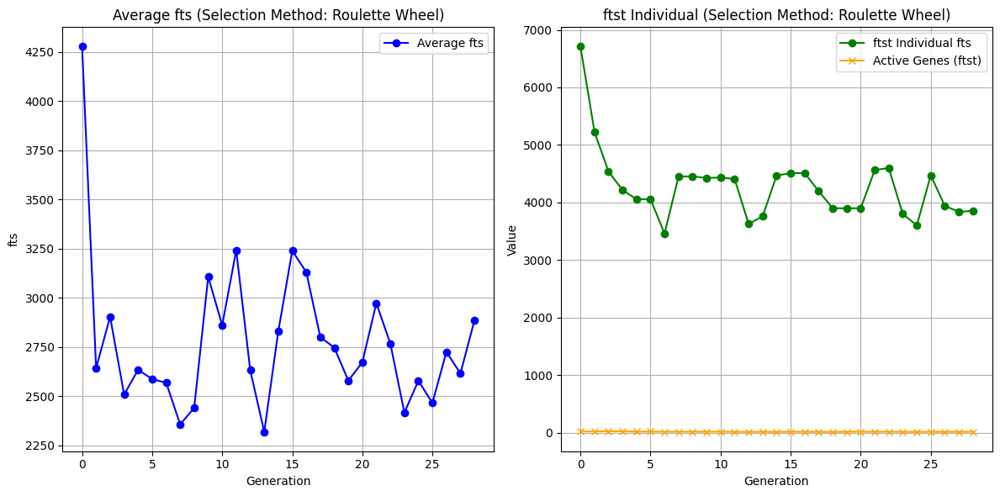

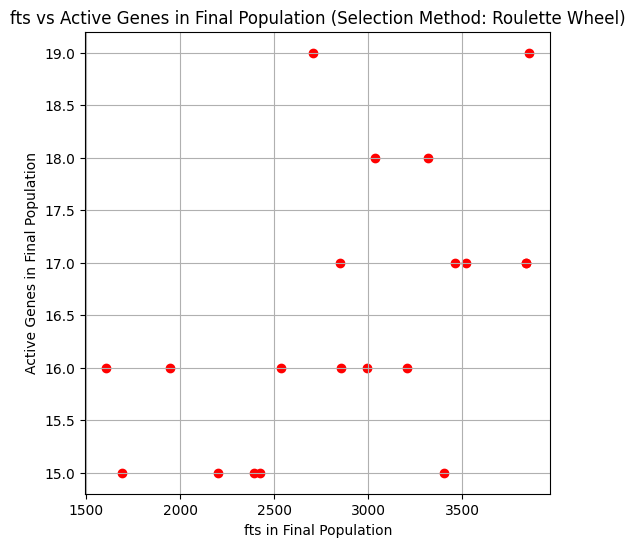

bst fts: 5229.00 in Generation 0
bst Solution Active Genes: 551


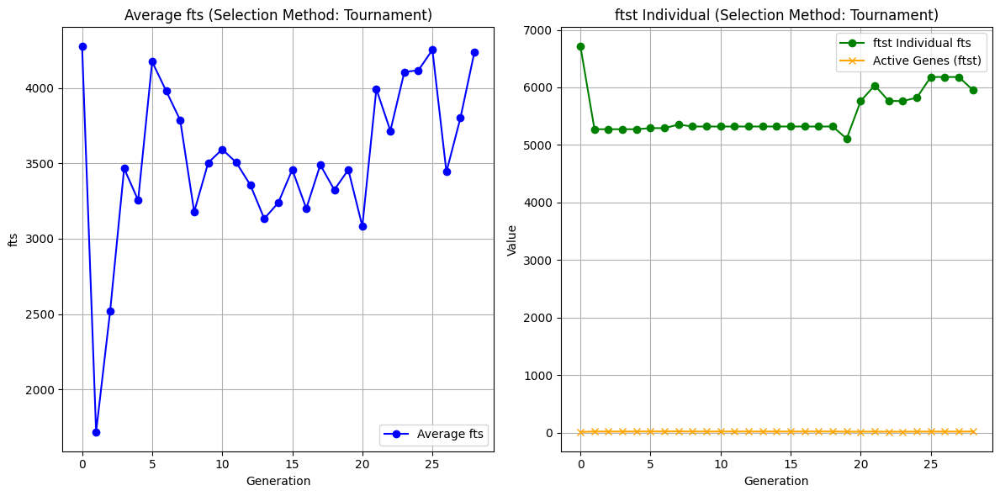

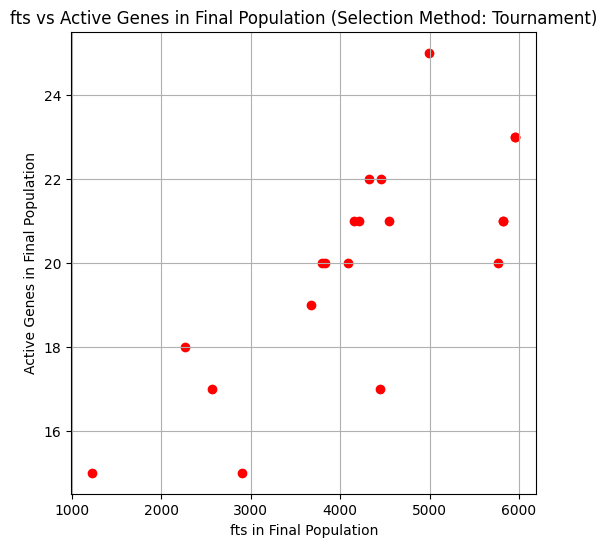

bst fts: 6181.00 in Generation 24
bst Solution Active Genes: 647


In [34]:
config = "config_1.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

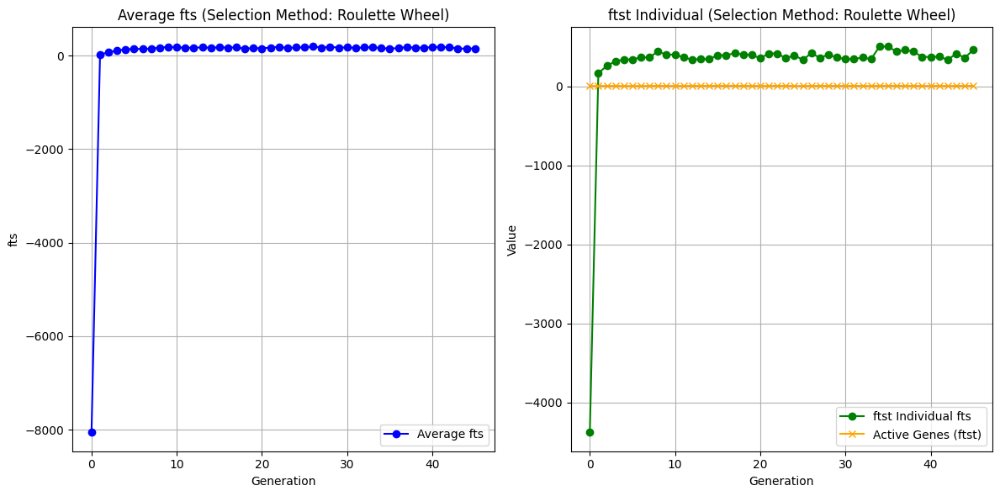

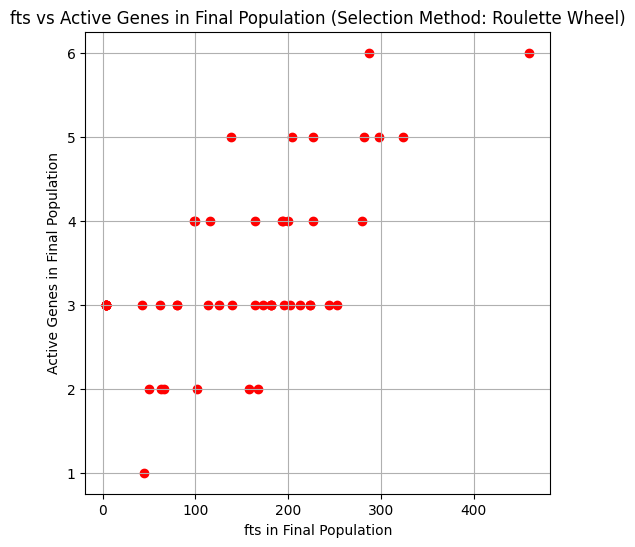

bst fts: 503.00 in Generation 33
bst Solution Active Genes: 255


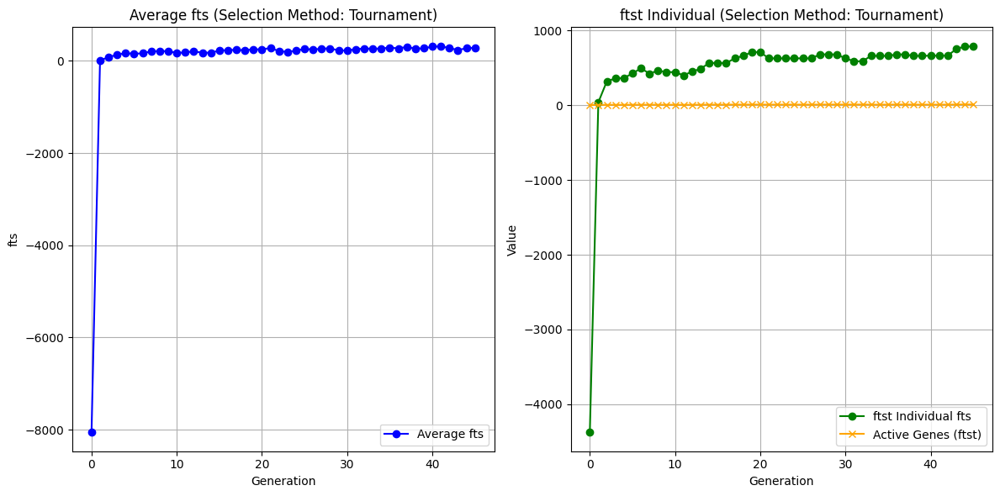

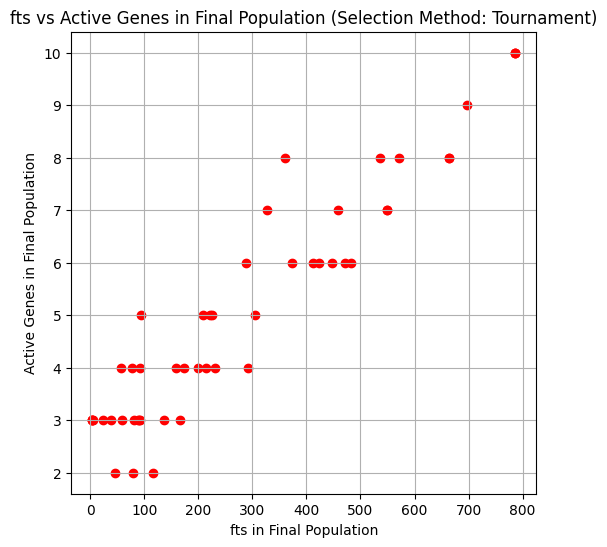

bst fts: 786.00 in Generation 43
bst Solution Active Genes: 342


In [35]:
config = "config_2.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

In [36]:
def viz(rdata, tdata, mrt):
    genr = range(len(rdata[0]))
    tgen = range(len(tdata[0]))
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(genr, rdata[0], label="Avg Fitness", color='blue', marker='o')
    plt.plot(genr, rdata[1], label="Fittest Fitness", color='blue', marker='x')
    plt.plot(genr, rdata[2], label="Active Genes", color='blue', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Roulette Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(tgen, tdata[0], label="Avg Fitness", color='red', marker='o')
    plt.plot(tgen, tdata[1], label="Fittest Fitness", color='red', marker='x')
    plt.plot(tgen, tdata[2], label="Active Genes", color='red', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Tournament Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def cmpr(config):
    rlts = []
    for mrt in np.arange(0, 0.25, 0.05):
        print(f"\n--- Mutation Rate: {mrt} ---")
        rdata = sc(config, criteria='rws', mrt=mrt)
        tdata = sc(config, criteria='ts', mrt=mrt)
        rlts.append({
            'mrt':mrt,
            'rws fit': rdata[4],
            'rws gen': rdata[5],
            'ts fit': tdata[4],
            'ts gen': tdata[5]
        })
        res(rdata[0], rdata[1], rdata[2], len(rdata[0]), rdata[4], rdata[5], 'rws', rdata[6], rdata[7])
        res(tdata[0], tdata[1], tdata[2], len(tdata[0]), tdata[4], tdata[5], 'Tournament', tdata[6], tdata[7])
        print(f"Best Overall Solution (Roulette): Fitness = {rdata[4]}, Generation = {rdata[5]}")
        print(f"Best Overall Solution (Tournament): Fitness = {tdata[4]}, Generation = {tdata[5]}")
    results = pd.DataFrame(rlts)
    print("Results:")
    print(results)


--- Mutation Rate: 0.0 ---


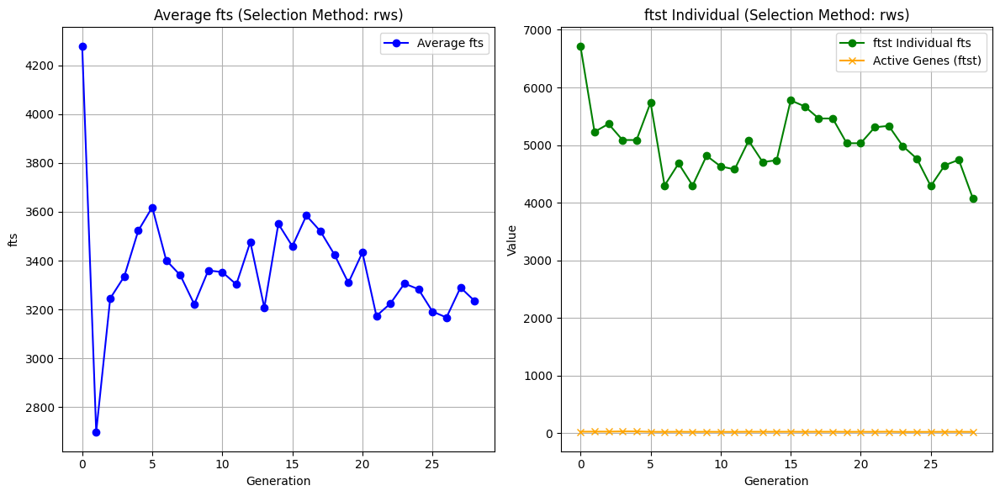

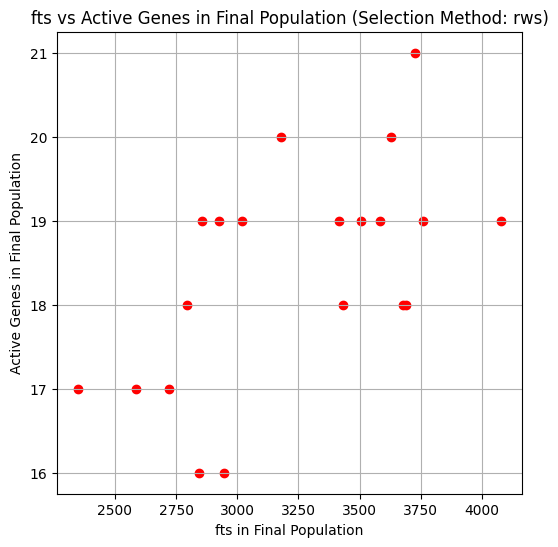

bst fts: 5776.00 in Generation 14
bst Solution Active Genes: 604


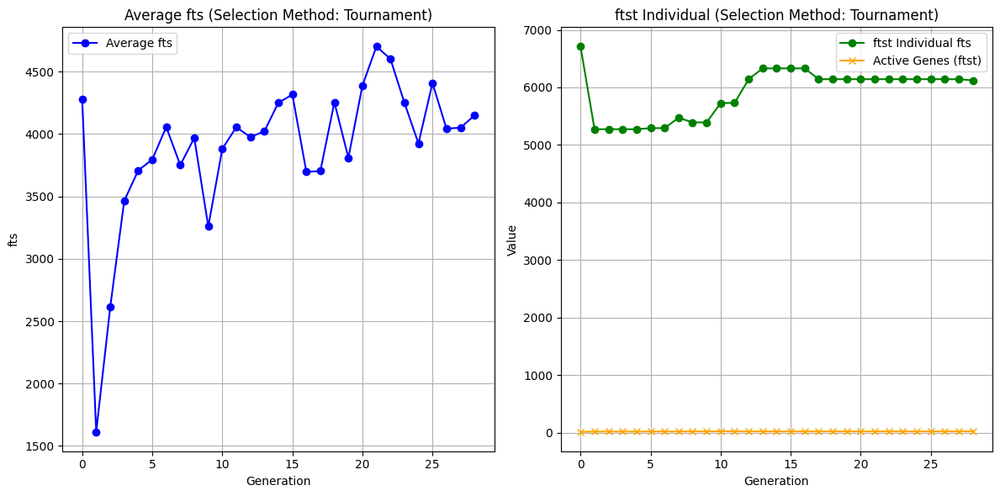

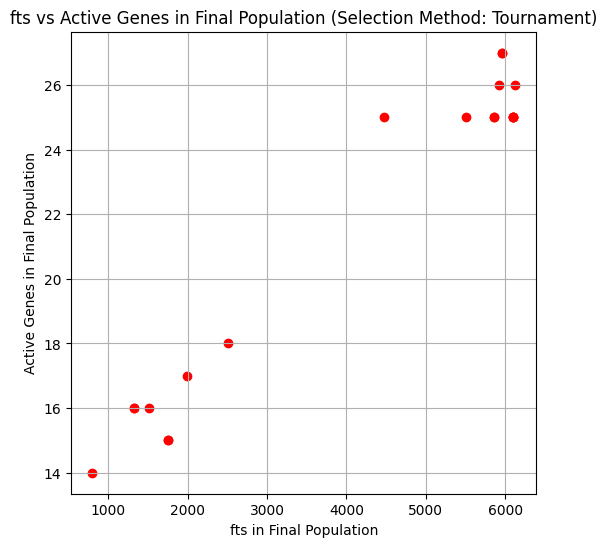

bst fts: 6331.00 in Generation 12
bst Solution Active Genes: 709
Best Overall Solution (Roulette): Fitness = 5776, Generation = 14
Best Overall Solution (Tournament): Fitness = 6331, Generation = 12

--- Mutation Rate: 0.05 ---


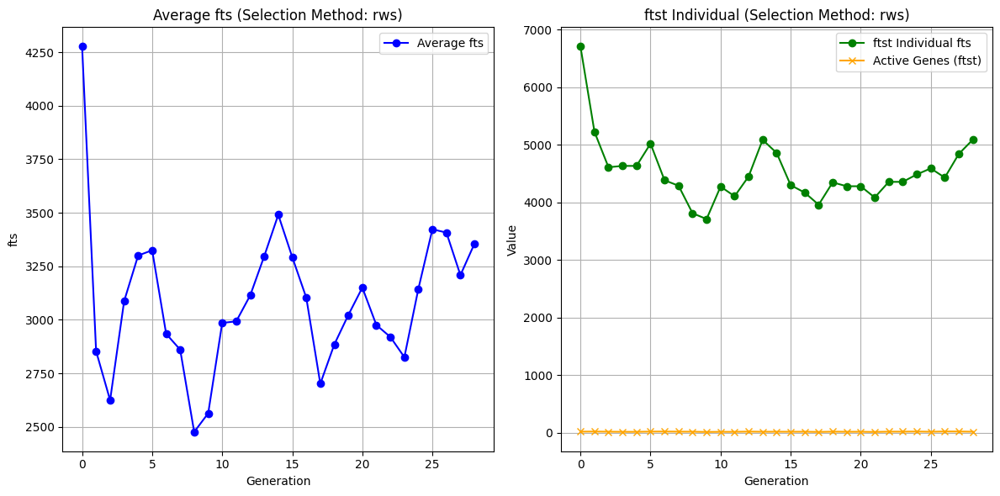

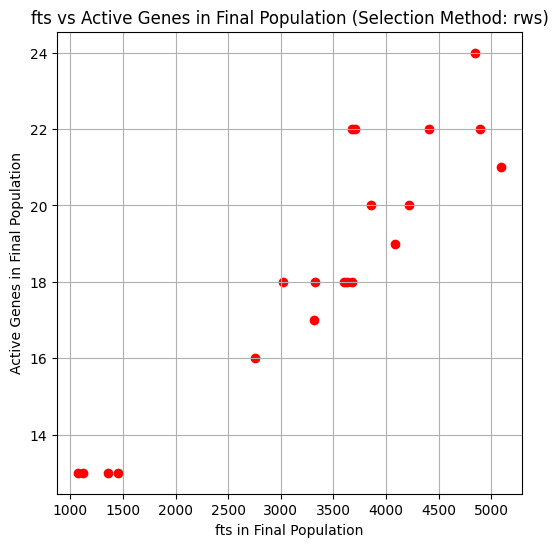

bst fts: 5229.00 in Generation 0
bst Solution Active Genes: 609


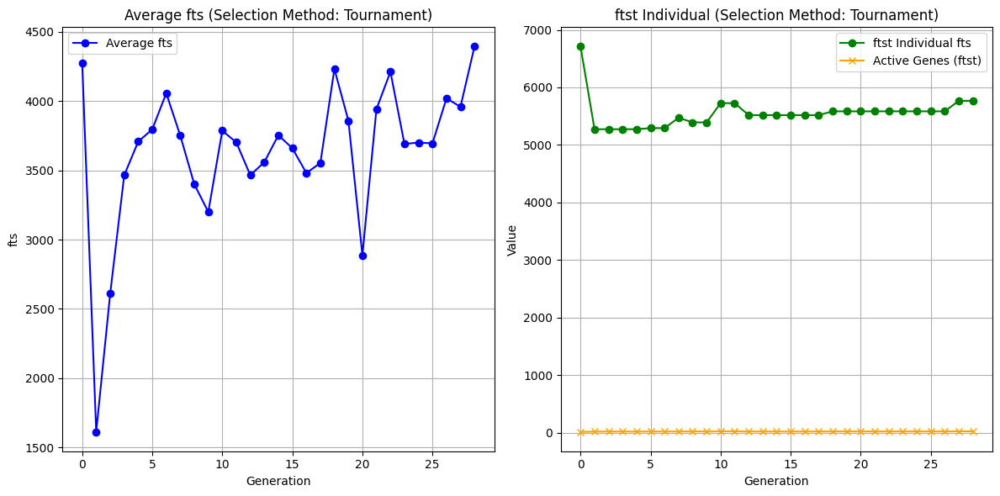

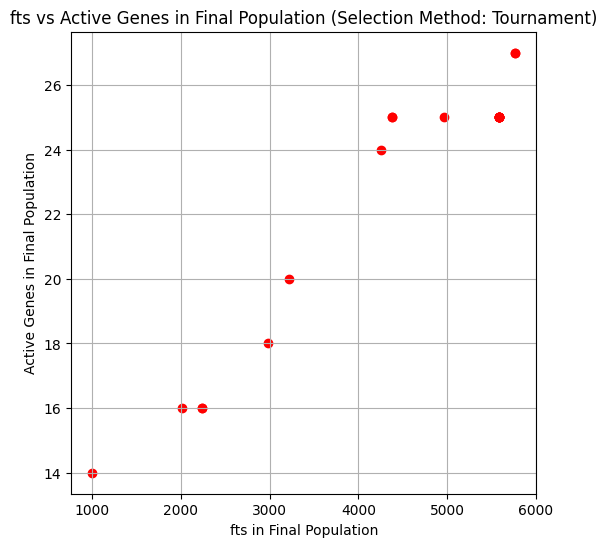

bst fts: 5767.00 in Generation 26
bst Solution Active Genes: 707
Best Overall Solution (Roulette): Fitness = 5229, Generation = 0
Best Overall Solution (Tournament): Fitness = 5767, Generation = 26

--- Mutation Rate: 0.1 ---


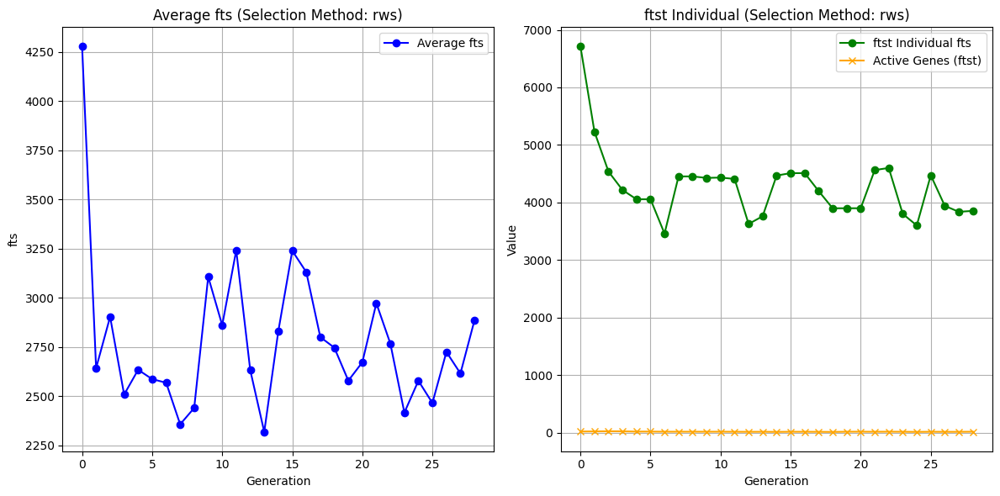

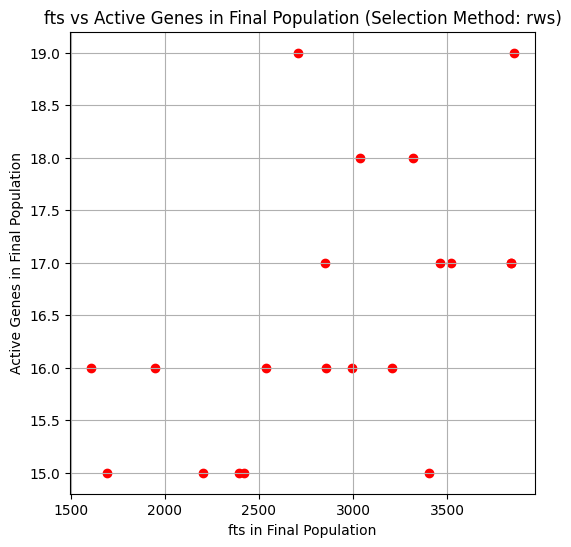

bst fts: 5229.00 in Generation 0
bst Solution Active Genes: 551


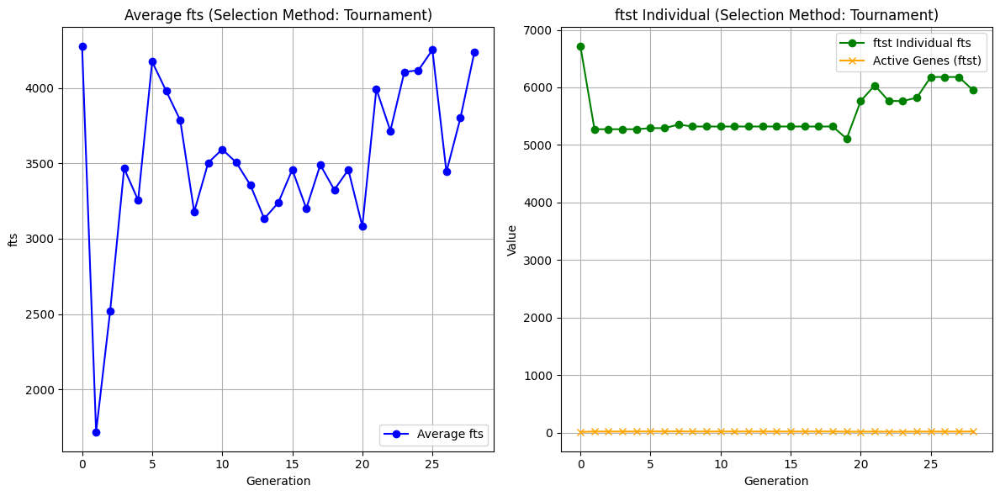

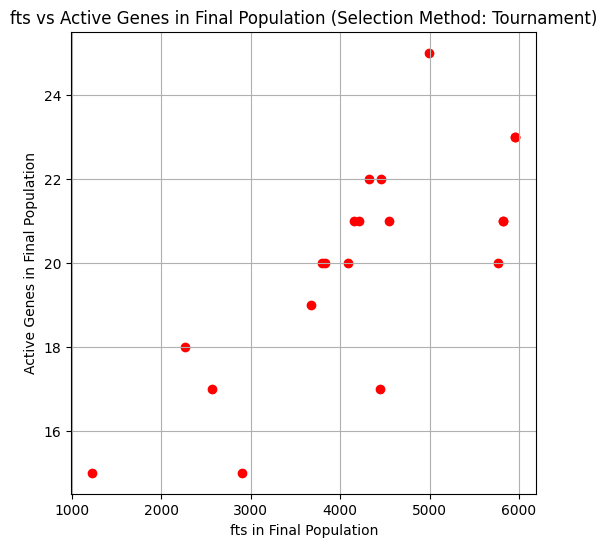

bst fts: 6181.00 in Generation 24
bst Solution Active Genes: 647
Best Overall Solution (Roulette): Fitness = 5229, Generation = 0
Best Overall Solution (Tournament): Fitness = 6181, Generation = 24

--- Mutation Rate: 0.15000000000000002 ---


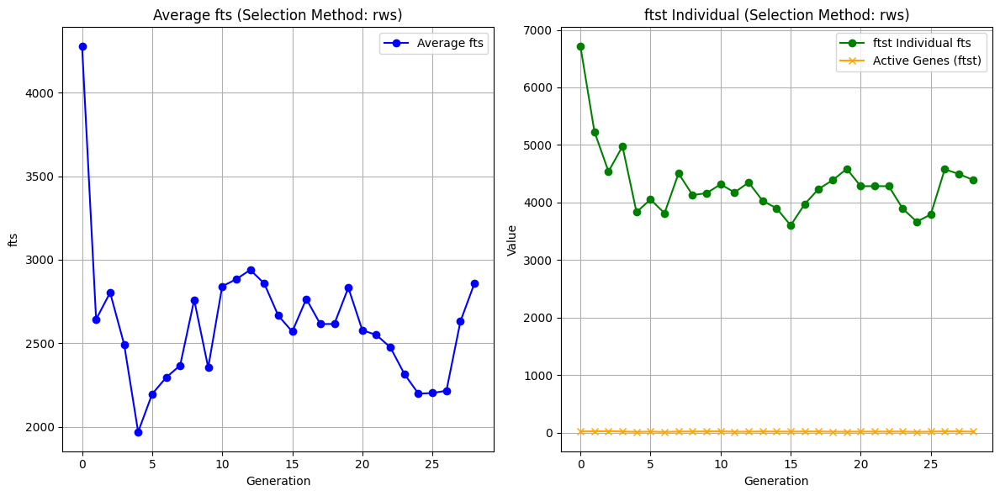

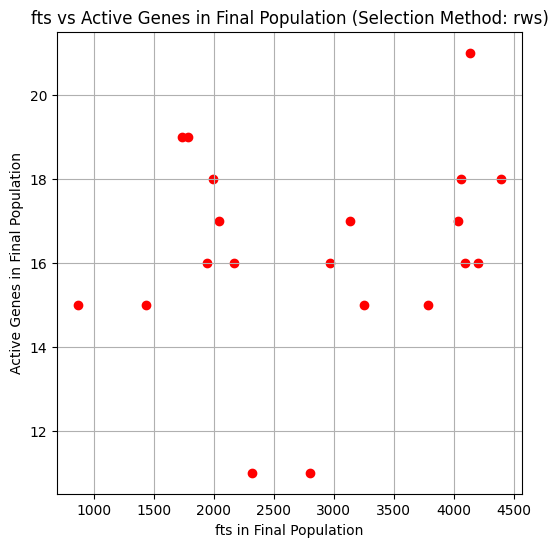

bst fts: 5229.00 in Generation 0
bst Solution Active Genes: 567


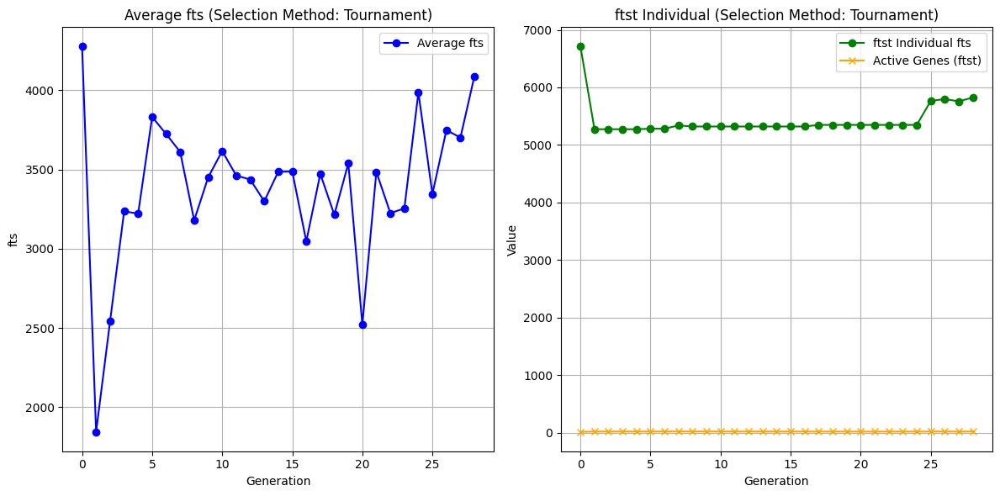

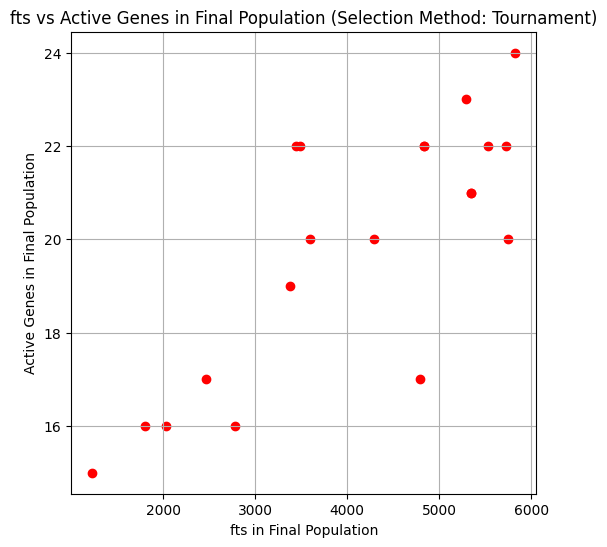

bst fts: 5824.00 in Generation 27
bst Solution Active Genes: 654
Best Overall Solution (Roulette): Fitness = 5229, Generation = 0
Best Overall Solution (Tournament): Fitness = 5824, Generation = 27

--- Mutation Rate: 0.2 ---


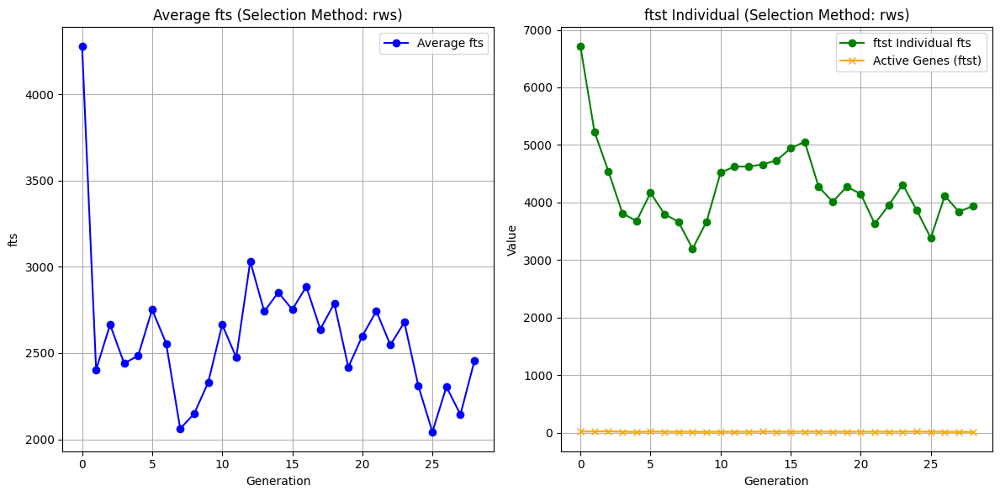

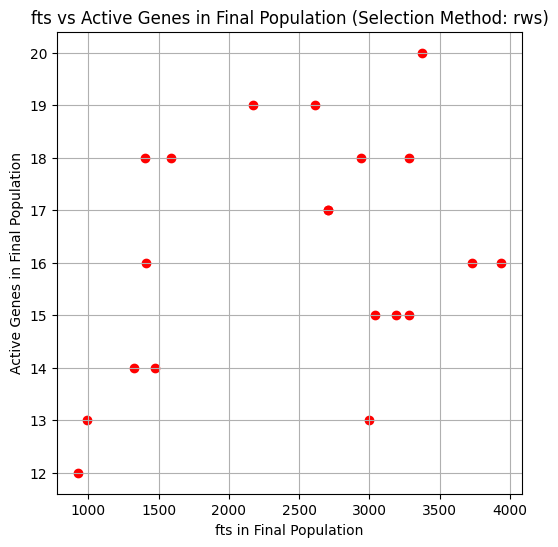

bst fts: 5229.00 in Generation 0
bst Solution Active Genes: 560


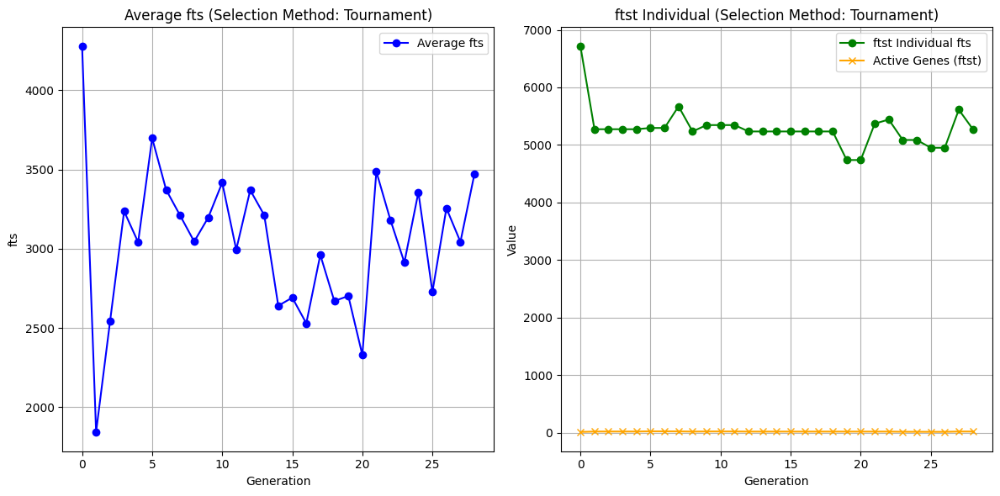

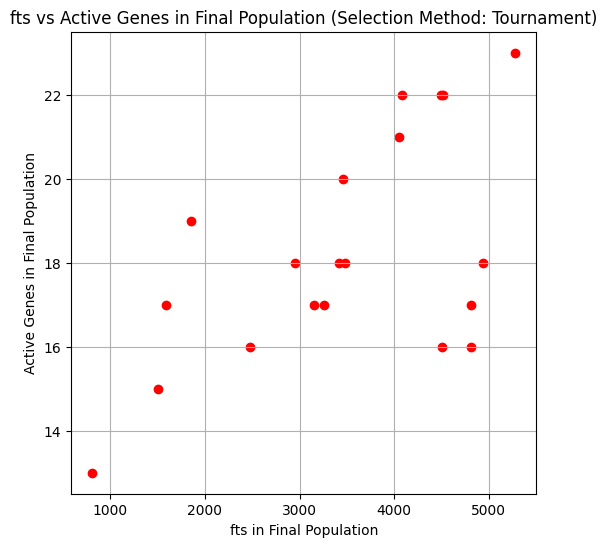

bst fts: 5671.00 in Generation 6
bst Solution Active Genes: 641
Best Overall Solution (Roulette): Fitness = 5229, Generation = 0
Best Overall Solution (Tournament): Fitness = 5671, Generation = 6
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00     5776       14    6331      12
1  0.05     5229        0    5767      26
2  0.10     5229        0    6181      24
3  0.15     5229        0    5824      27
4  0.20     5229        0    5671       6

--- Mutation Rate: 0.0 ---


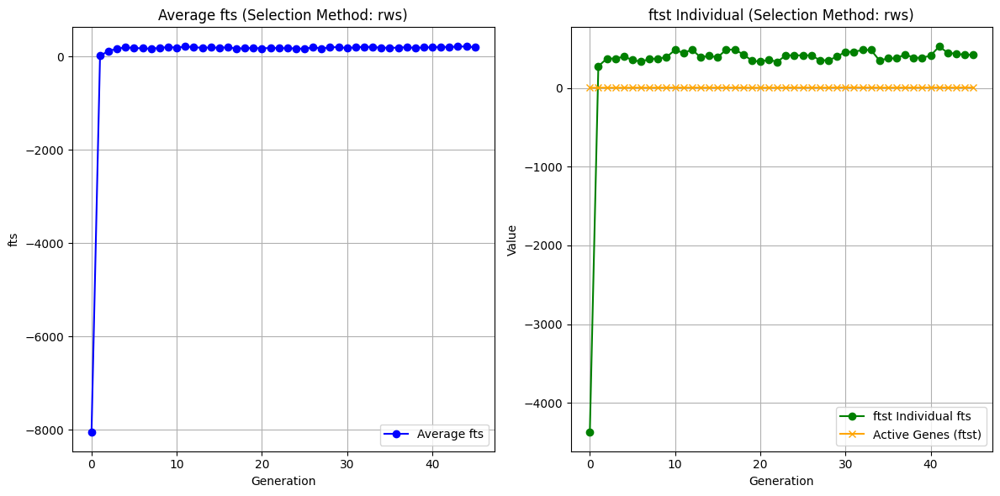

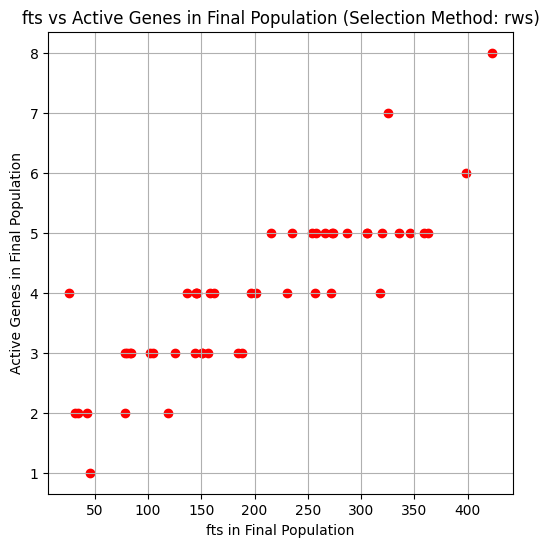

bst fts: 529.00 in Generation 40
bst Solution Active Genes: 298


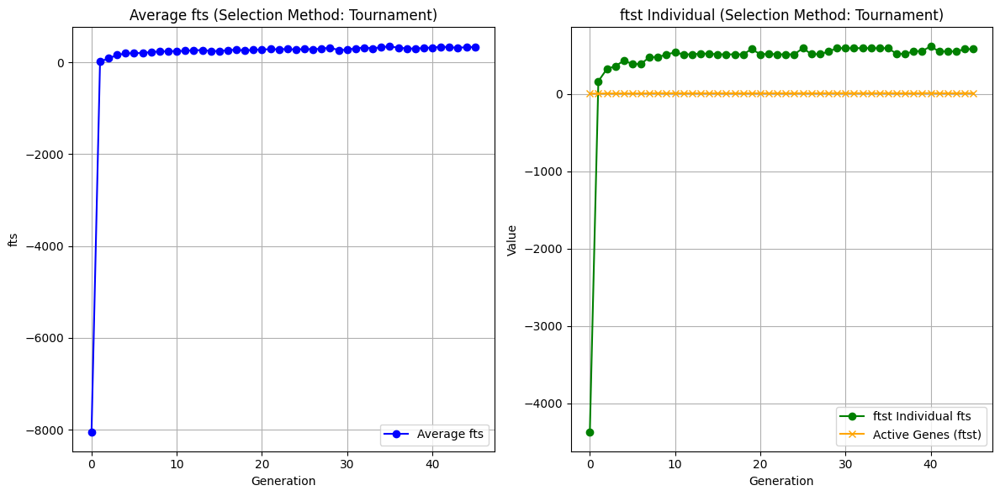

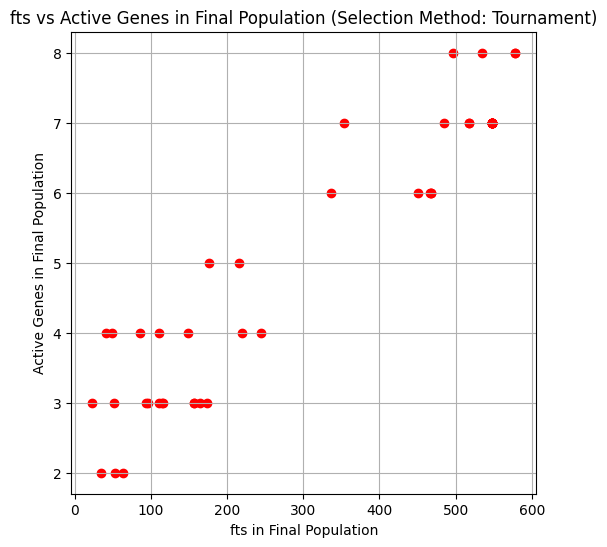

bst fts: 612.00 in Generation 39
bst Solution Active Genes: 320
Best Overall Solution (Roulette): Fitness = 529, Generation = 40
Best Overall Solution (Tournament): Fitness = 612, Generation = 39

--- Mutation Rate: 0.05 ---


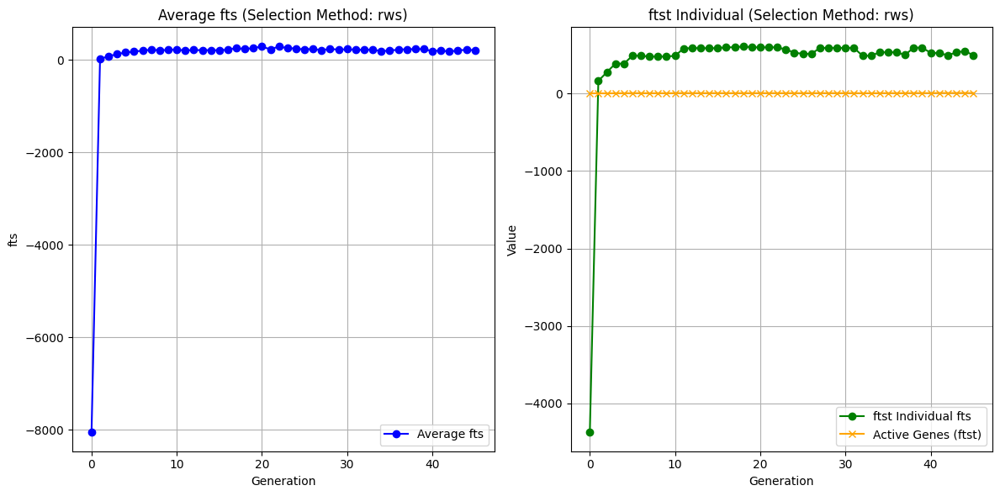

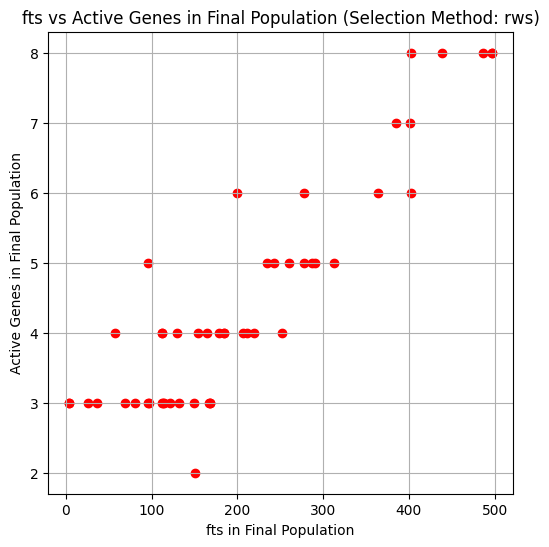

bst fts: 610.00 in Generation 17
bst Solution Active Genes: 318


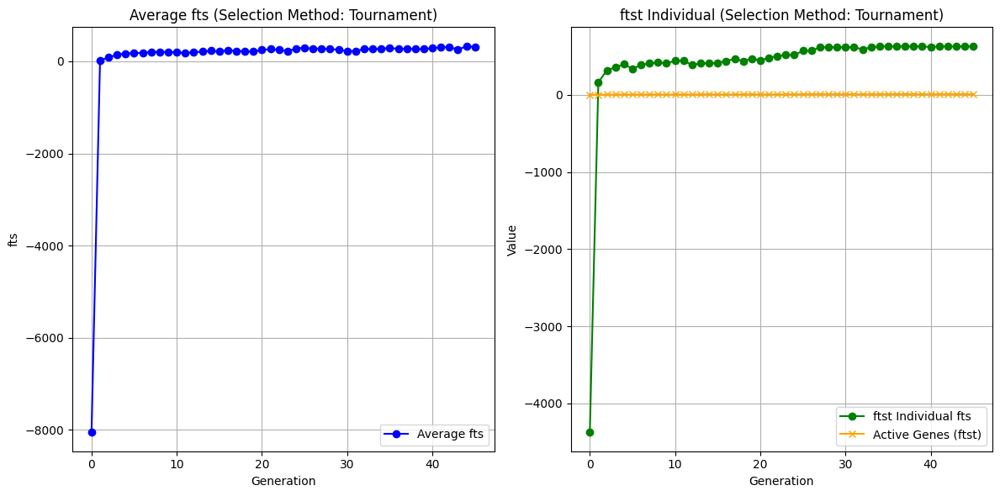

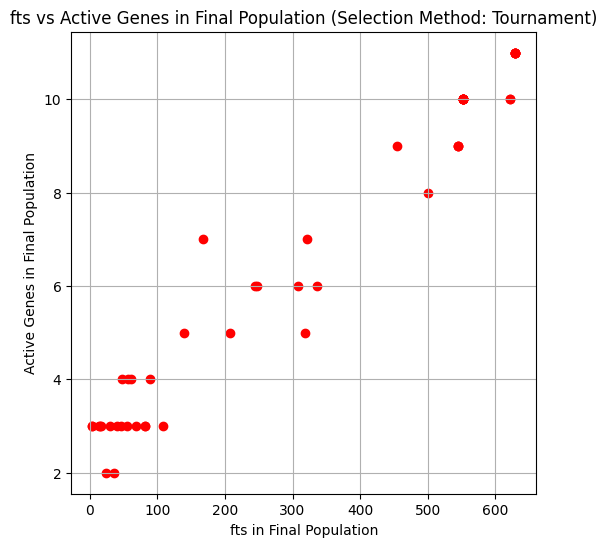

bst fts: 629.00 in Generation 33
bst Solution Active Genes: 399
Best Overall Solution (Roulette): Fitness = 610, Generation = 17
Best Overall Solution (Tournament): Fitness = 629, Generation = 33

--- Mutation Rate: 0.1 ---


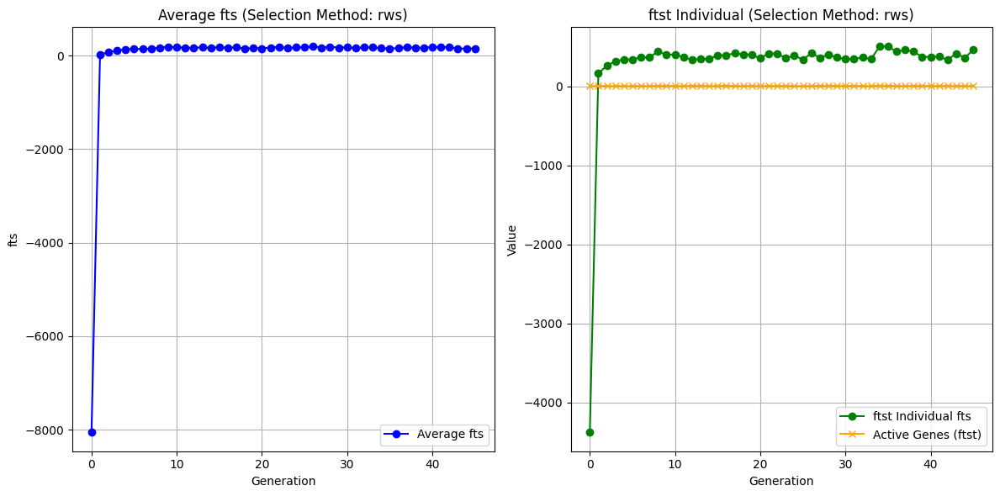

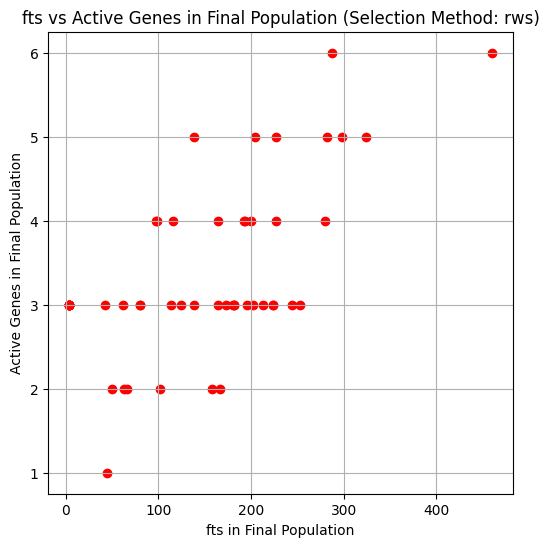

bst fts: 503.00 in Generation 33
bst Solution Active Genes: 255


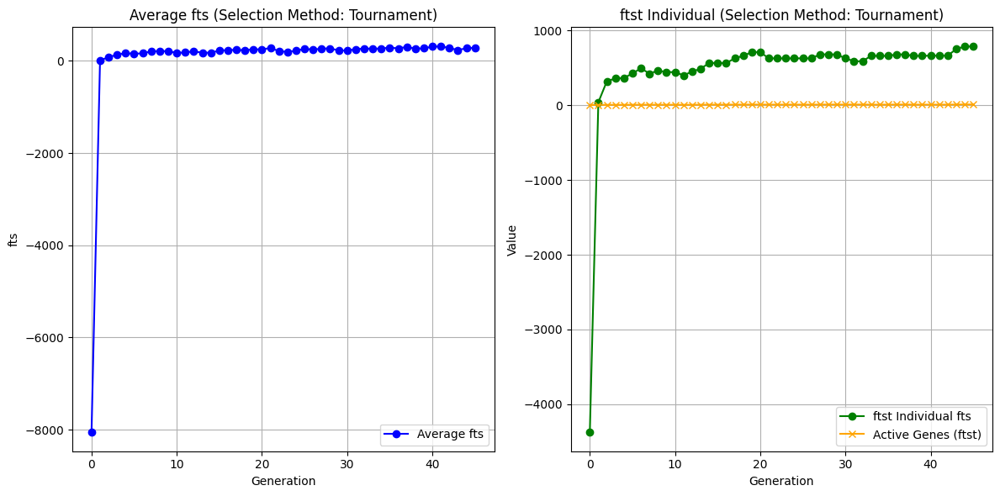

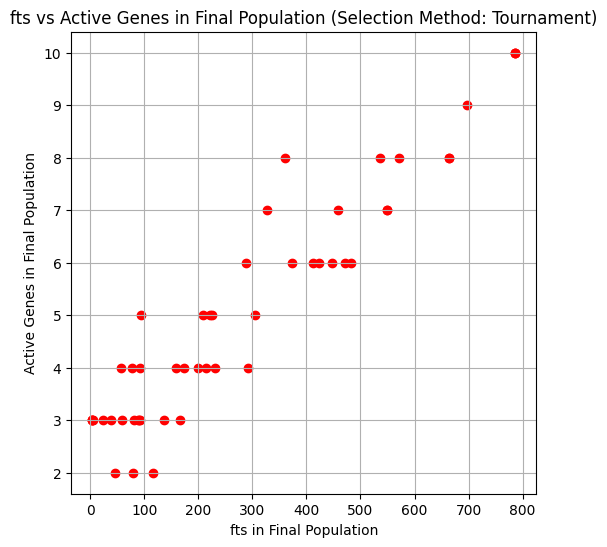

bst fts: 786.00 in Generation 43
bst Solution Active Genes: 342
Best Overall Solution (Roulette): Fitness = 503, Generation = 33
Best Overall Solution (Tournament): Fitness = 786, Generation = 43

--- Mutation Rate: 0.15000000000000002 ---


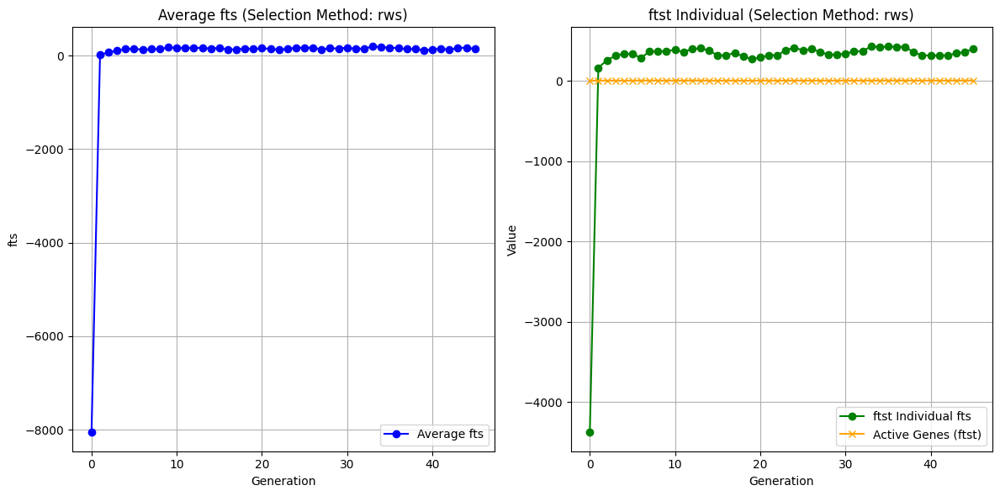

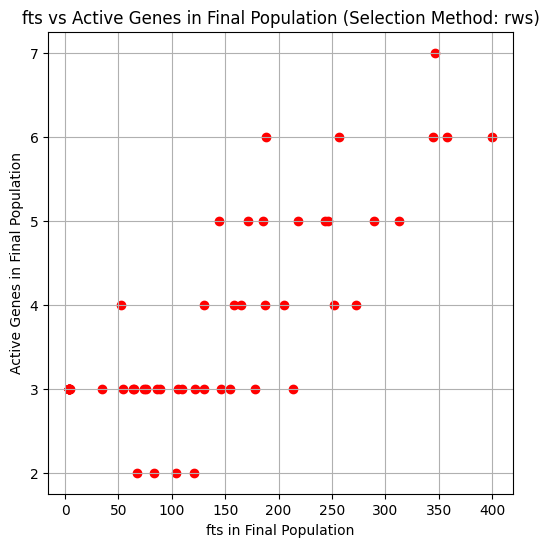

bst fts: 430.00 in Generation 32
bst Solution Active Genes: 234


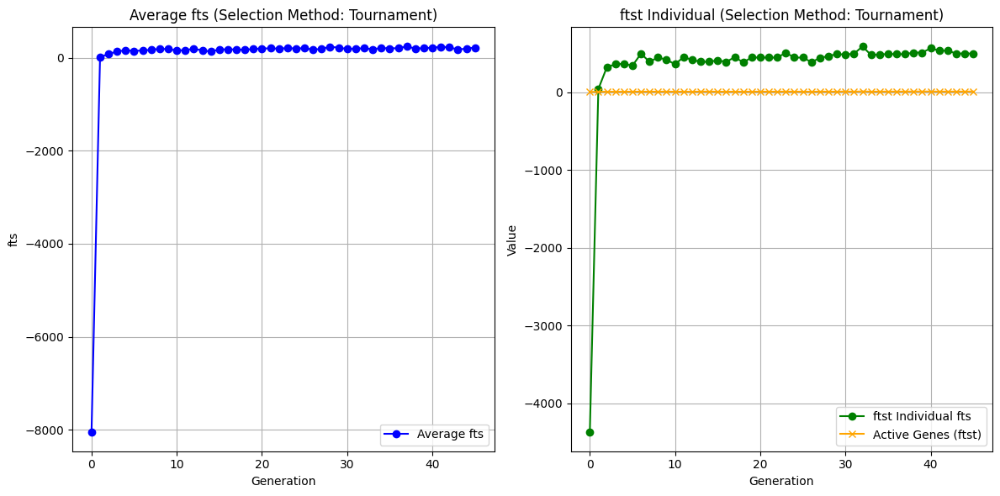

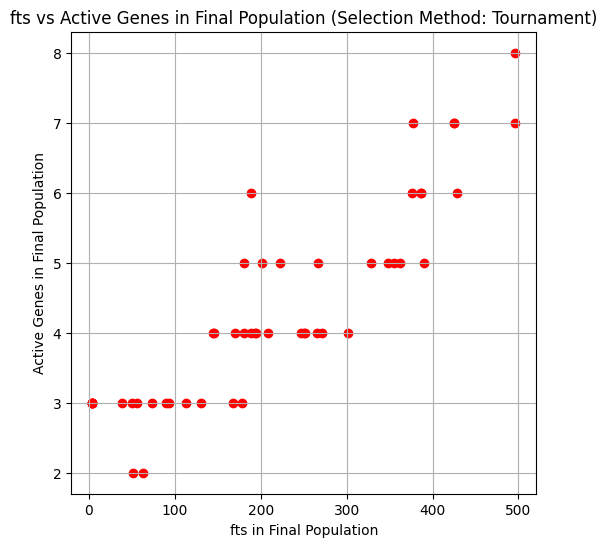

bst fts: 587.00 in Generation 31
bst Solution Active Genes: 289
Best Overall Solution (Roulette): Fitness = 430, Generation = 32
Best Overall Solution (Tournament): Fitness = 587, Generation = 31

--- Mutation Rate: 0.2 ---


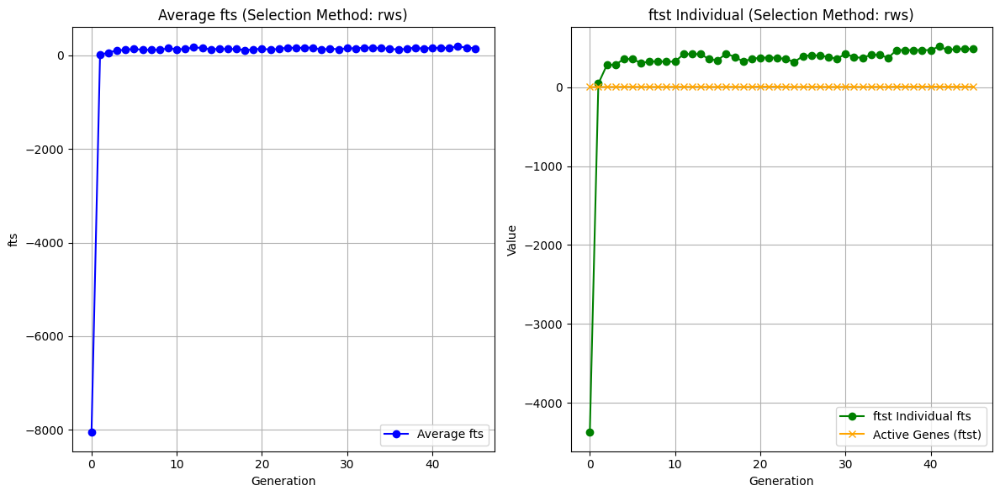

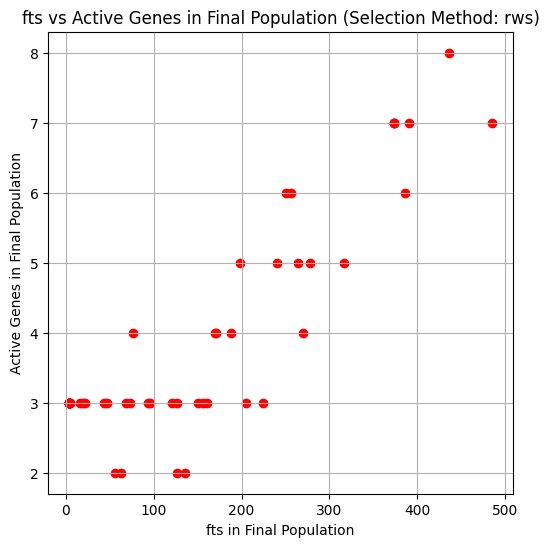

bst fts: 517.00 in Generation 40
bst Solution Active Genes: 277


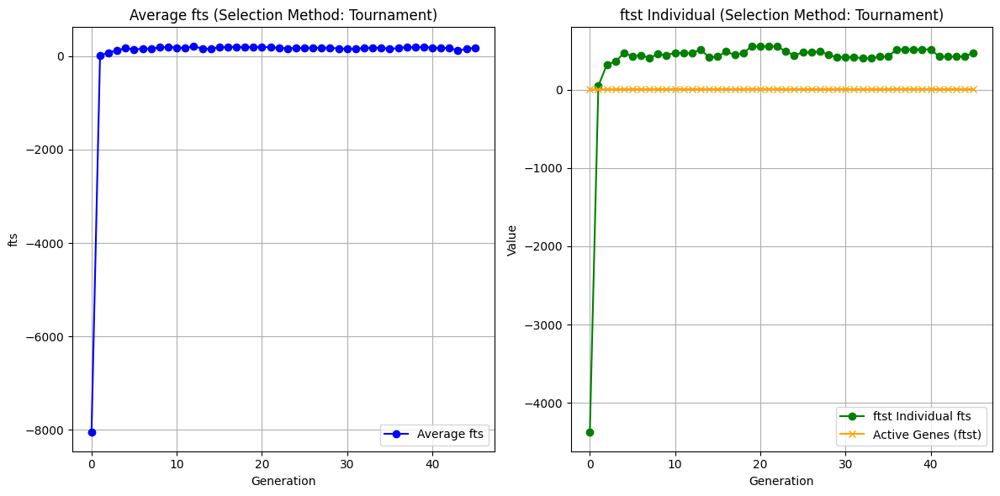

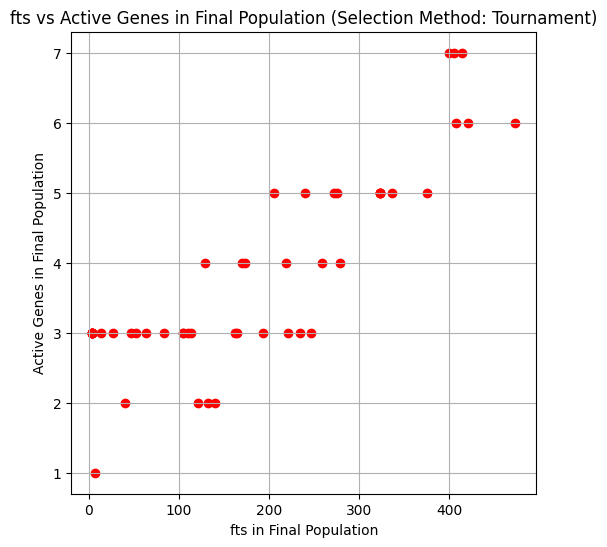

bst fts: 551.00 in Generation 18
bst Solution Active Genes: 291
Best Overall Solution (Roulette): Fitness = 517, Generation = 40
Best Overall Solution (Tournament): Fitness = 551, Generation = 18
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00      529       40     612      39
1  0.05      610       17     629      33
2  0.10      503       33     786      43
3  0.15      430       32     587      31
4  0.20      517       40     551      18


In [37]:
config = "config_1.txt"
cmpr(config)
config = "config_2.txt"
cmpr(config)

**Stop criteria**

In [38]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, gen, stp

In [39]:
def fit(cr,s,wgt):
    twgt = 0
    tval = 0
    for i, gn in enumerate(cr):
        if gn == 1:
            twgt += s[i][0]
            tval += s[i][1]
    if twgt <= wgt:
        return tval
    else:
        return 0

In [40]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]

In [41]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=3):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [42]:
def co(parent1,parent2, cort = 0.1):
    r = np.random.rand()
    if r <= cort:
        child1 = parent1
        child2 = parent2
    else:
        cp = np.random.randint(1,len(parent1 -1))
        child1 = np.concatenate([parent1[:cp], parent2[cp:]])
        child2 = np.concatenate([parent1[cp:], parent2[:cp]])
    return child1,child2

In [43]:
def mut(cr, mrt):
    num = np.random.rand()
    for i in range(len(cr)):
        if num < mrt:
            if cr[i] == 1:
                cr[i] = 0
            else:
                cr[i] = 1
    return cr

In [44]:
def mystop(avgftg, generation, maxgen, noimplimit=10, minimpfit=1e-6, threshold=0.1):
    if generation >= maxgen:
        return True
    if generation > noimplimit:
        ravgft = avgftg[-noimplimit:]
        improvement = ravgft[-1] - ravgft[0]
        if abs(improvement) < minimpfit:
            return True
    if len(avgftg) > 1:
        diversity = np.std(avgftg[-5:])
        if diversity < threshold:
            return True
    return False

def sc(config, criteria='ts',mrt=0.1):
    p, wgt, s, generation, stop = getpop(config)
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, 0
    mrt = 0.1
    for gen in range(stop):
        fts = [fit(i, s, wgt) for i in p]
        avgftg.append(np.mean(fts))
        bstid = np.argmax(fts)
        ftsol = p[bstid]
        f = fts[bstid]
        ftst.append(f)
        actg.append(sum(ftsol))
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)
            else:
                p1, p2 = ts(p, fts)
            child1, child2 = co(p1, p2)
            child1 = mut(child1, mrt)
            child2 = mut(child2, mrt)
            newpop.append(child1)
            newpop.append(child2)
        p = np.array(newpop)
        if f > bstft:
            bstft, bstsol, bstgen = f, ftsol, gen
        if mystop(avgftg, gen, stop):
            print(f"Stopping at {gen}")
            break
    pfit = list(map(lambda i: fit(i, s, wgt), p))
    pactive = list(map(sum, p))
    return avgftg, ftst, actg, bstsol, bstft, bstgen, pfit, pactive

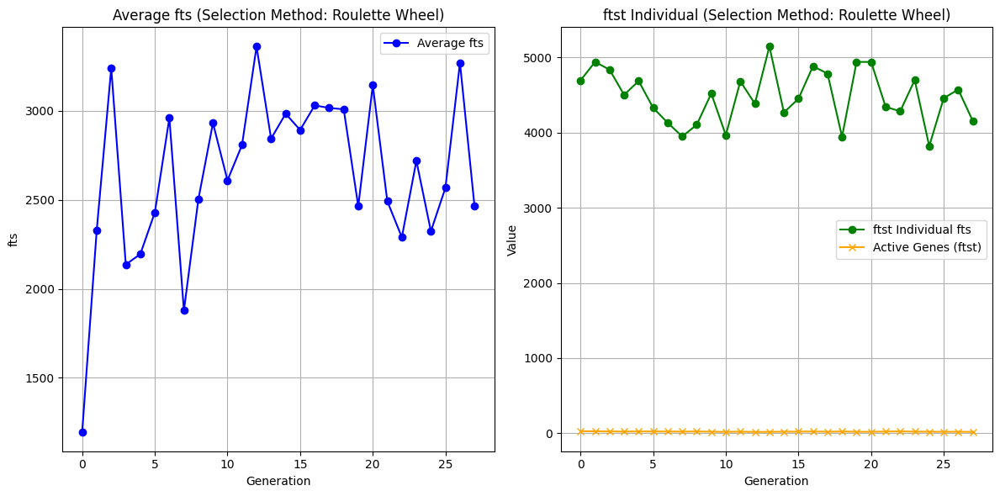

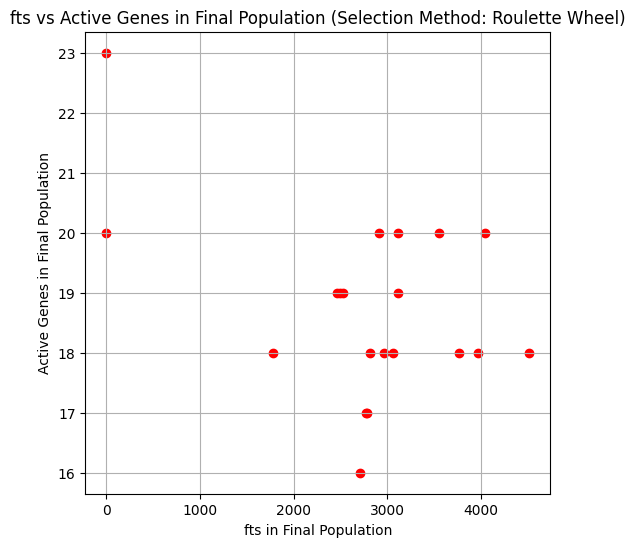

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


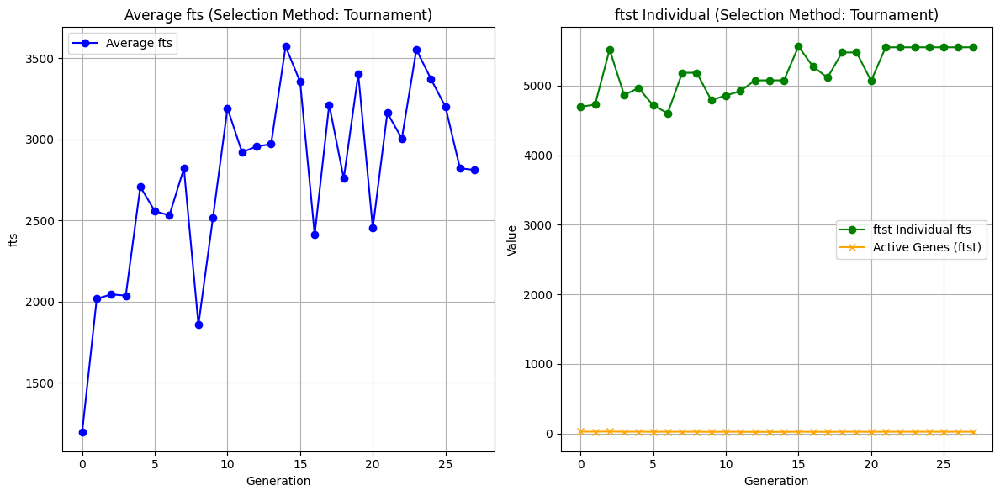

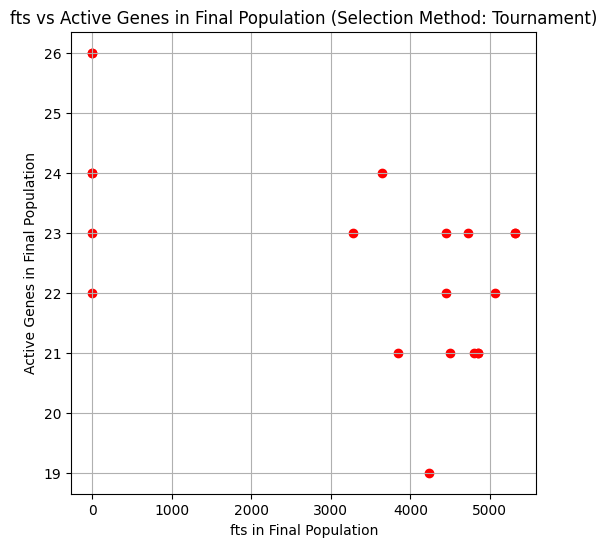

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637


In [45]:
config = "config_1.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

Stopping at 1


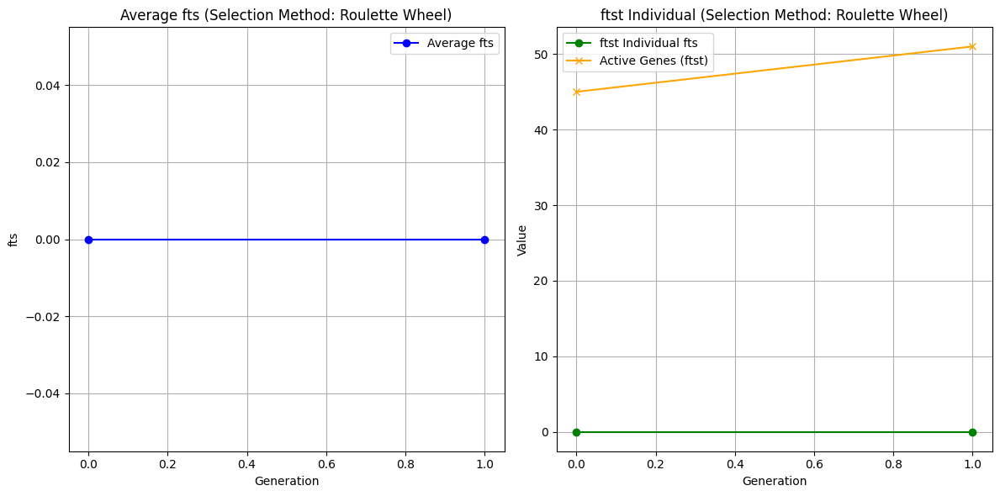

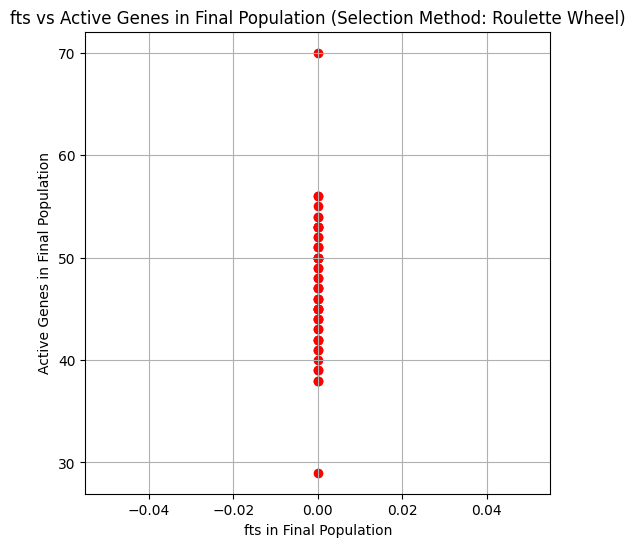

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 96
Stopping at 1


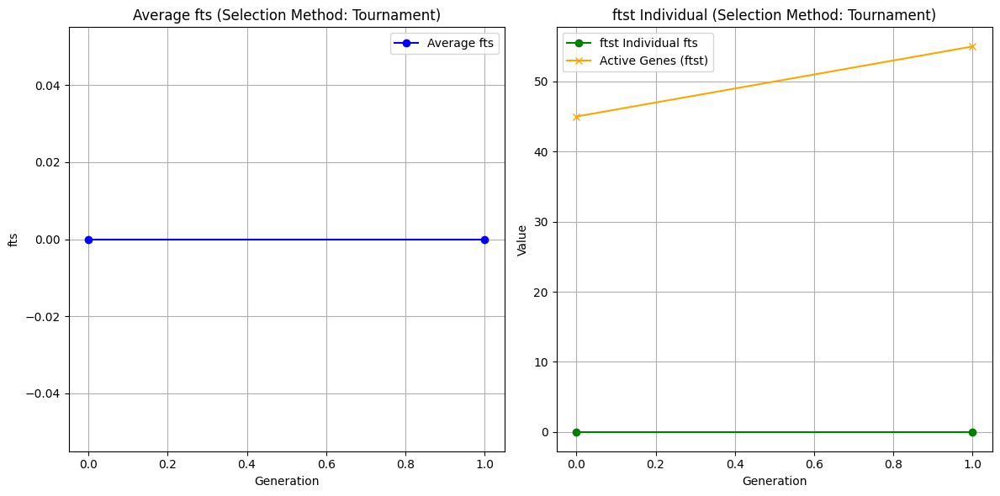

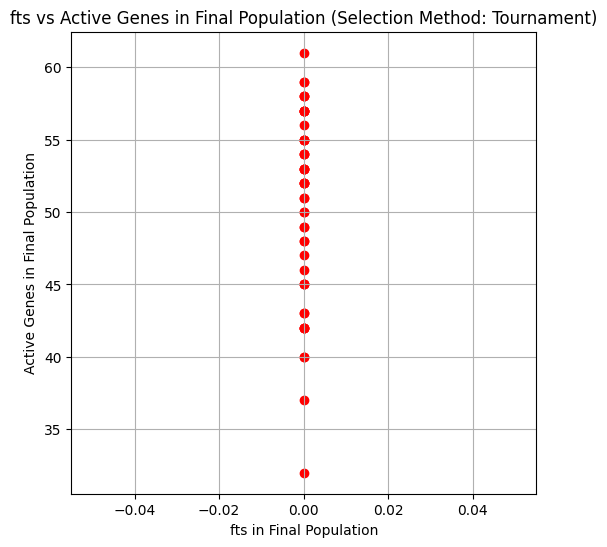

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 100


In [46]:
config = "config_2.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

In [47]:
def viz(rdata, tdata, mrt):
    genr = range(len(rdata[0]))
    tgen = range(len(tdata[0]))
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(genr, rdata[0], label="Avg Fitness", color='blue', marker='o')
    plt.plot(genr, rdata[1], label="Fittest Fitness", color='blue', marker='x')
    plt.plot(genr, rdata[2], label="Active Genes", color='blue', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Roulette Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(tgen, tdata[0], label="Avg Fitness", color='red', marker='o')
    plt.plot(tgen, tdata[1], label="Fittest Fitness", color='red', marker='x')
    plt.plot(tgen, tdata[2], label="Active Genes", color='red', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Tournament Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def cmpr(config):
    rlts = []
    for mrt in np.arange(0, 0.25, 0.05):
        print(f"\n--- Mutation Rate: {mrt} ---")
        rdata = sc(config, criteria='rws', mrt=mrt)
        tdata = sc(config, criteria='ts', mrt=mrt)
        rlts.append({
            'mrt':mrt,
            'rws fit': rdata[4],
            'rws gen': rdata[5],
            'ts fit': tdata[4],
            'ts gen': tdata[5]
        })
        res(rdata[0], rdata[1], rdata[2], len(rdata[0]), rdata[4], rdata[5], 'rws', rdata[6], rdata[7])
        res(tdata[0], tdata[1], tdata[2], len(tdata[0]), tdata[4], tdata[5], 'Tournament', tdata[6], tdata[7])
        print(f"Best Overall Solution (Roulette): Fitness = {rdata[4]}, Generation = {rdata[5]}")
        print(f"Best Overall Solution (Tournament): Fitness = {tdata[4]}, Generation = {tdata[5]}")
    results = pd.DataFrame(rlts)
    print("Results:")
    print(results)


--- Mutation Rate: 0.0 ---


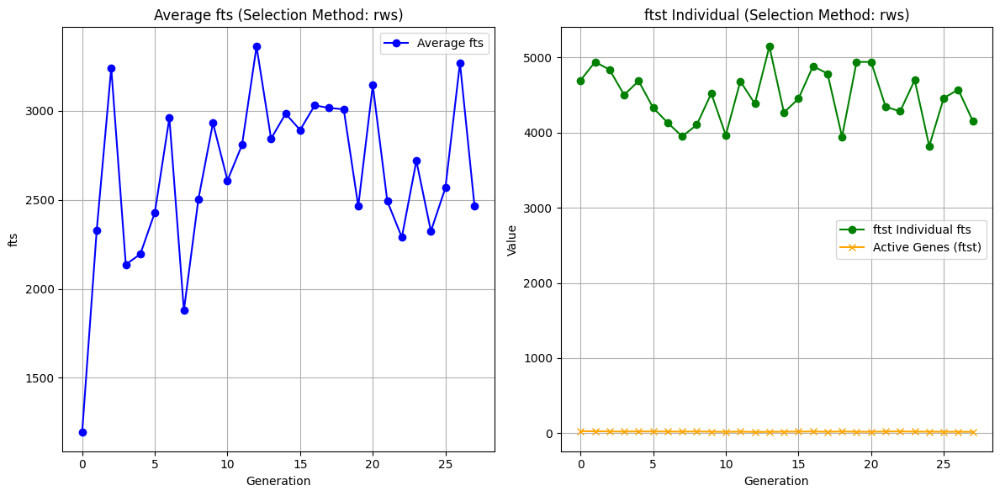

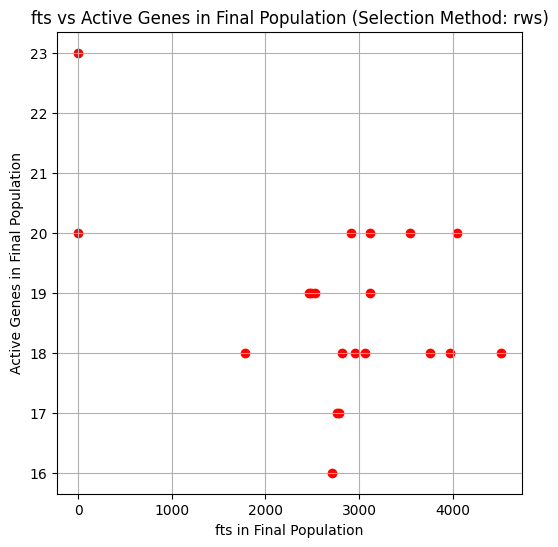

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


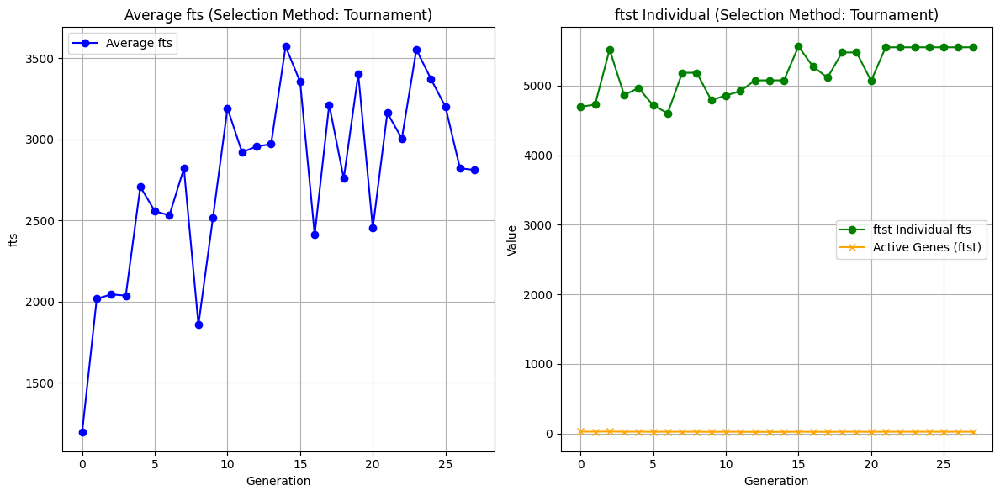

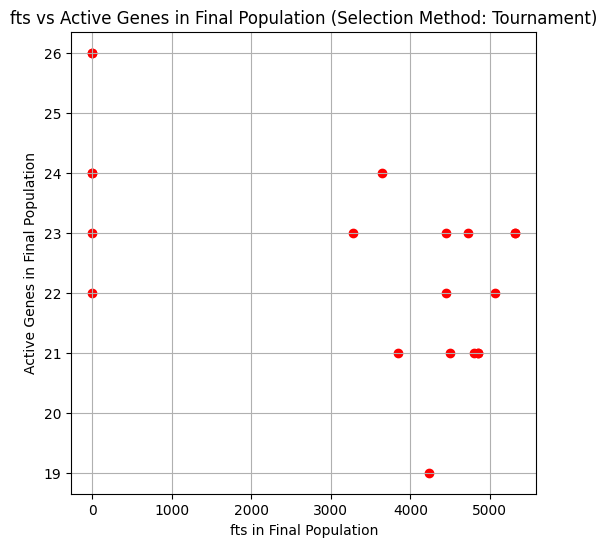

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637
Best Overall Solution (Roulette): Fitness = 5148, Generation = 13
Best Overall Solution (Tournament): Fitness = 5563, Generation = 15

--- Mutation Rate: 0.05 ---


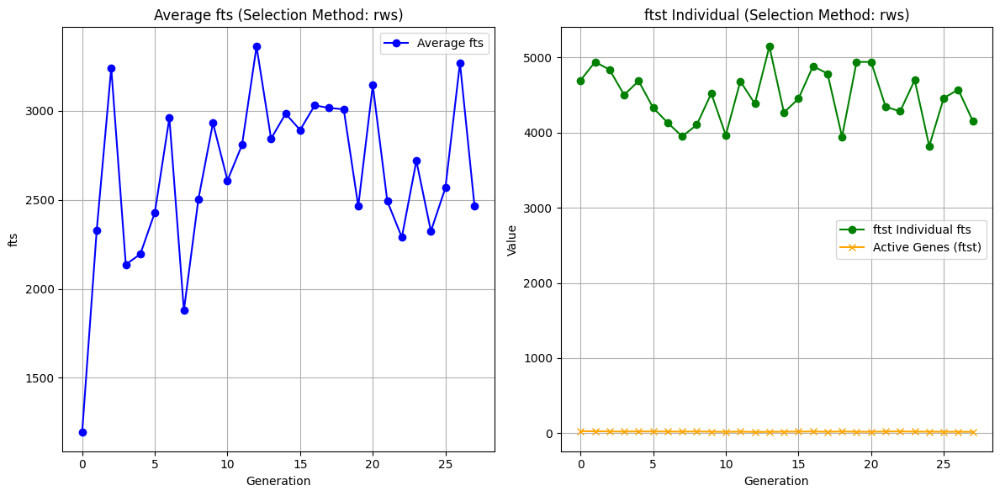

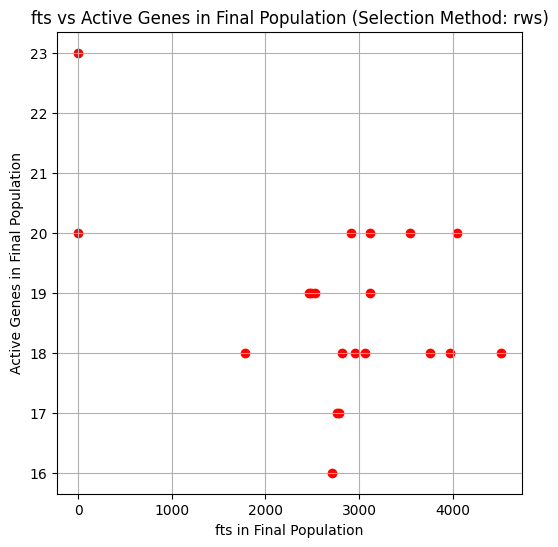

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


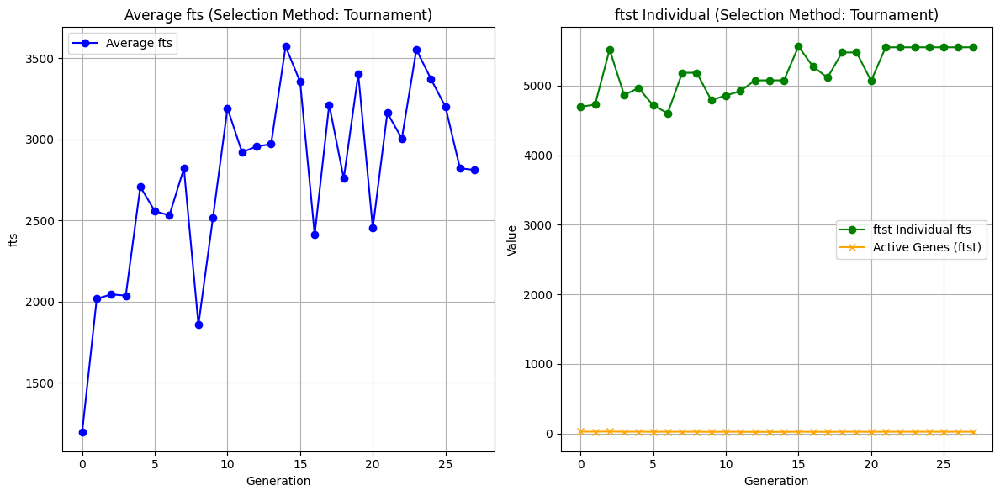

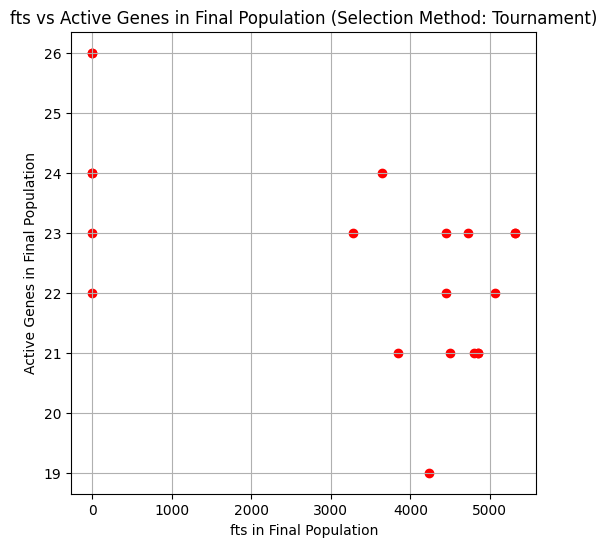

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637
Best Overall Solution (Roulette): Fitness = 5148, Generation = 13
Best Overall Solution (Tournament): Fitness = 5563, Generation = 15

--- Mutation Rate: 0.1 ---


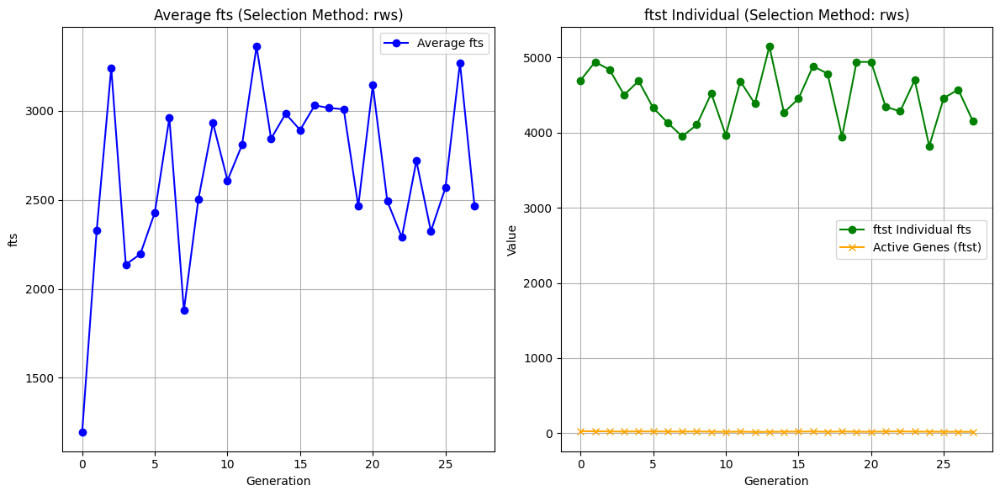

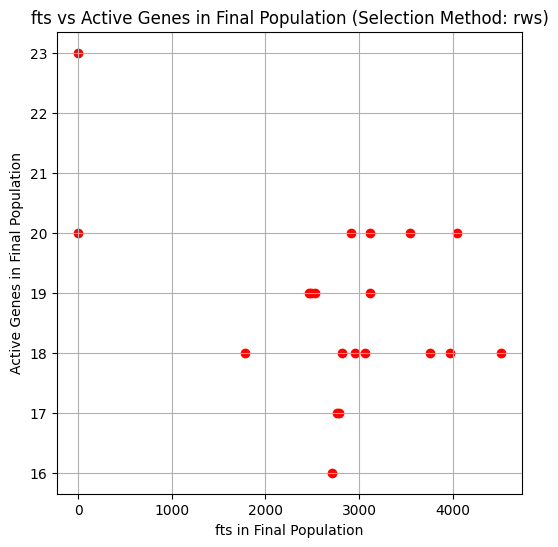

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


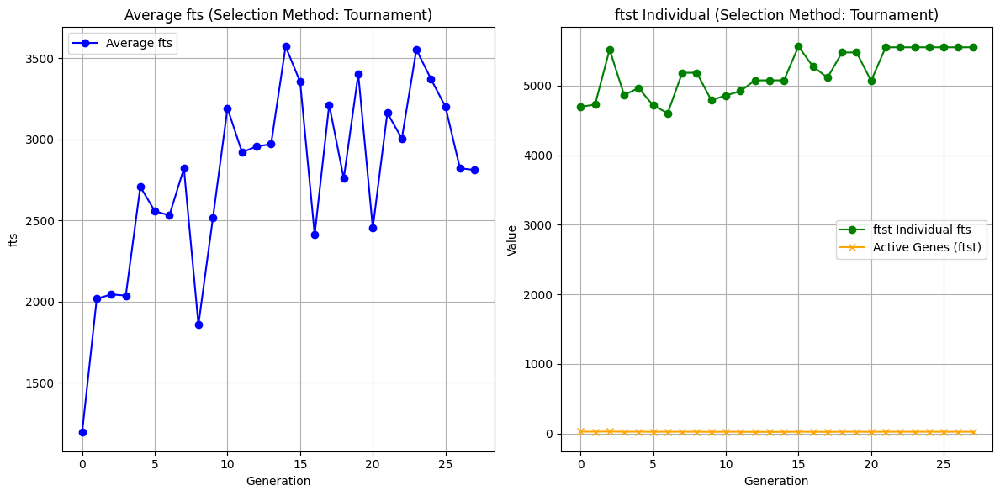

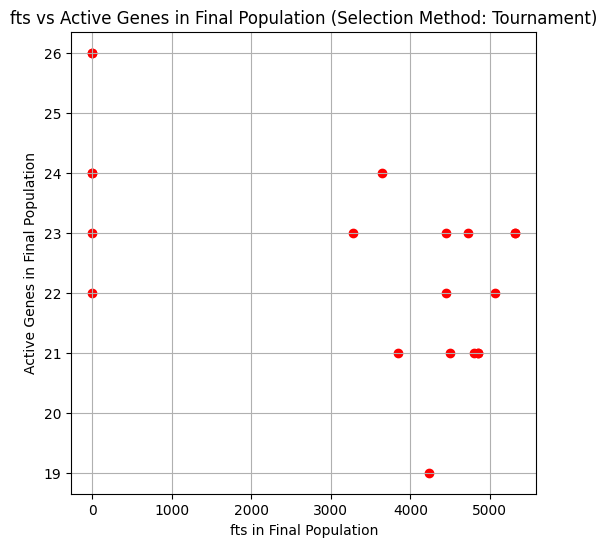

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637
Best Overall Solution (Roulette): Fitness = 5148, Generation = 13
Best Overall Solution (Tournament): Fitness = 5563, Generation = 15

--- Mutation Rate: 0.15000000000000002 ---


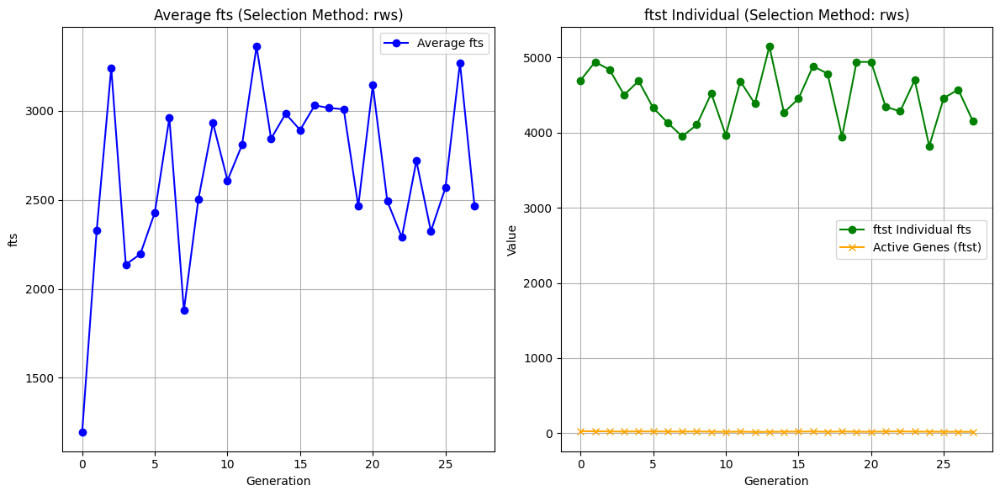

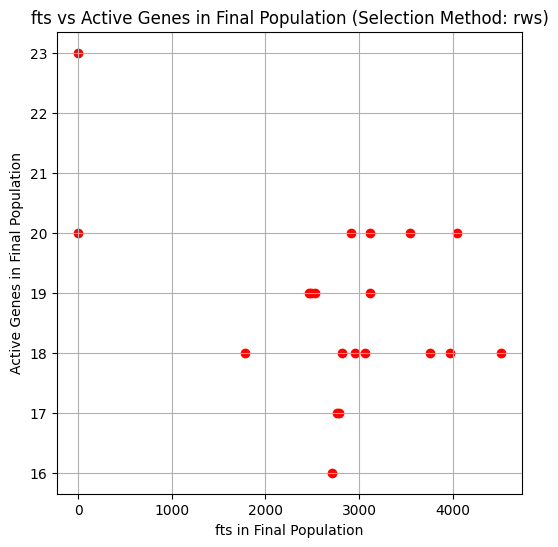

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


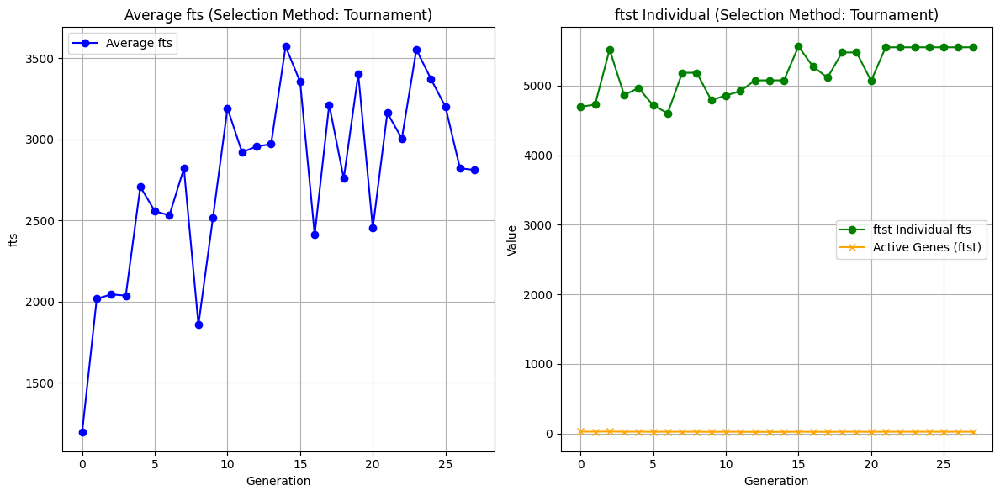

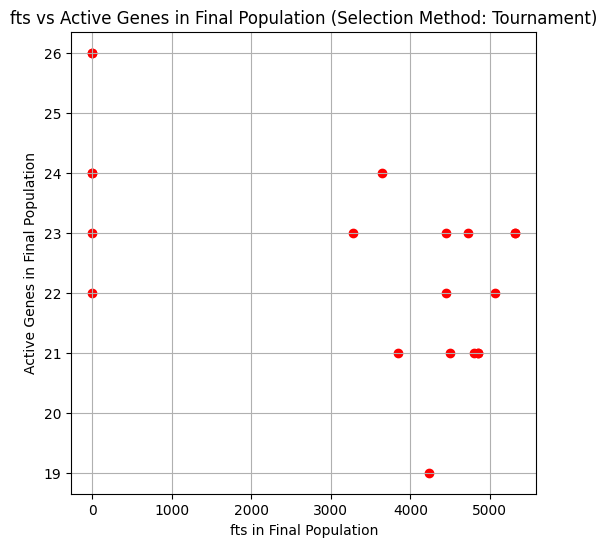

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637
Best Overall Solution (Roulette): Fitness = 5148, Generation = 13
Best Overall Solution (Tournament): Fitness = 5563, Generation = 15

--- Mutation Rate: 0.2 ---


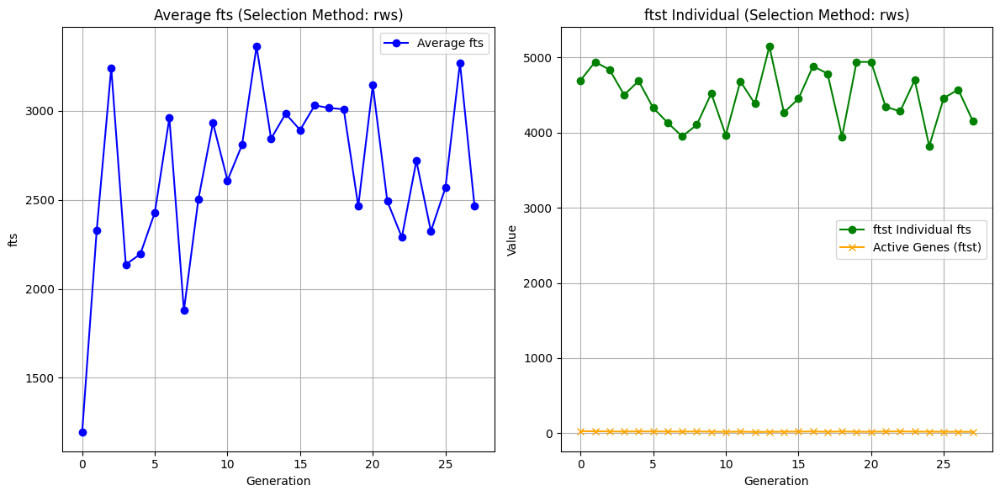

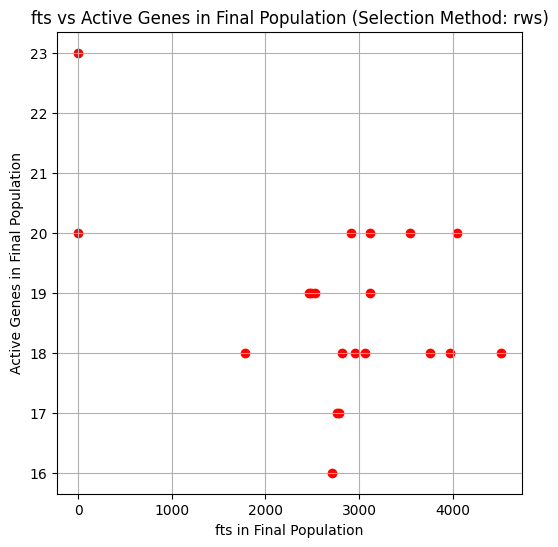

bst fts: 5148.00 in Generation 13
bst Solution Active Genes: 562


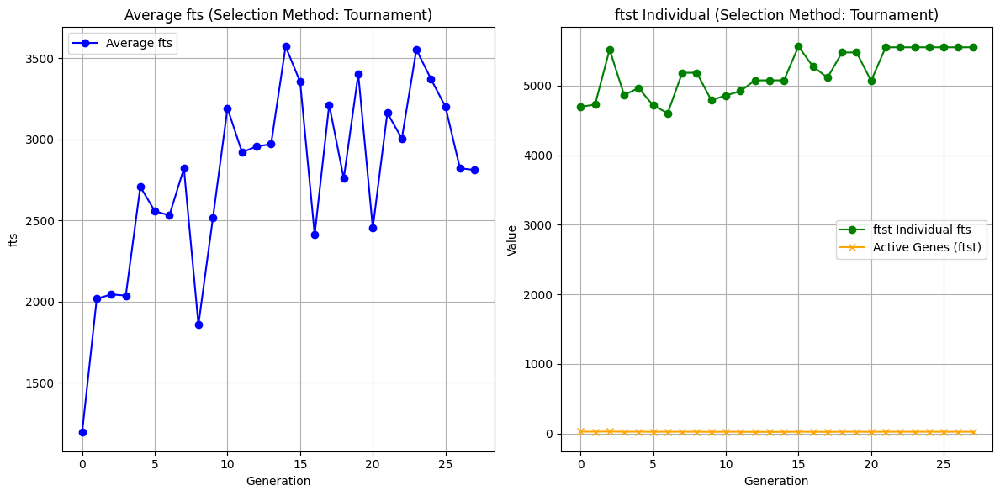

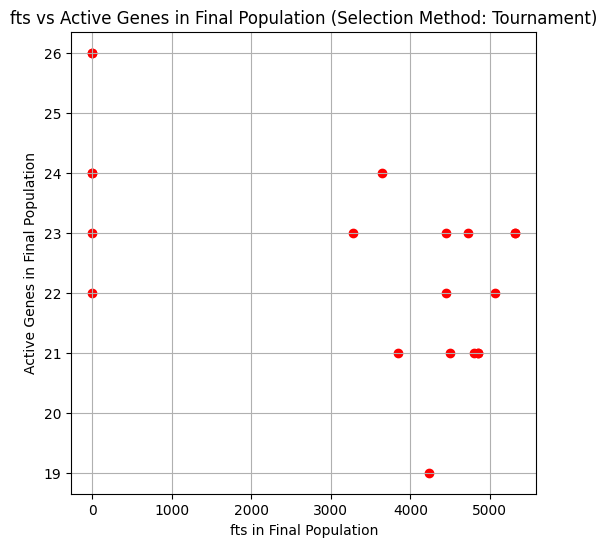

bst fts: 5563.00 in Generation 15
bst Solution Active Genes: 637
Best Overall Solution (Roulette): Fitness = 5148, Generation = 13
Best Overall Solution (Tournament): Fitness = 5563, Generation = 15
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00     5148       13    5563      15
1  0.05     5148       13    5563      15
2  0.10     5148       13    5563      15
3  0.15     5148       13    5563      15
4  0.20     5148       13    5563      15

--- Mutation Rate: 0.0 ---
Stopping at 1
Stopping at 1


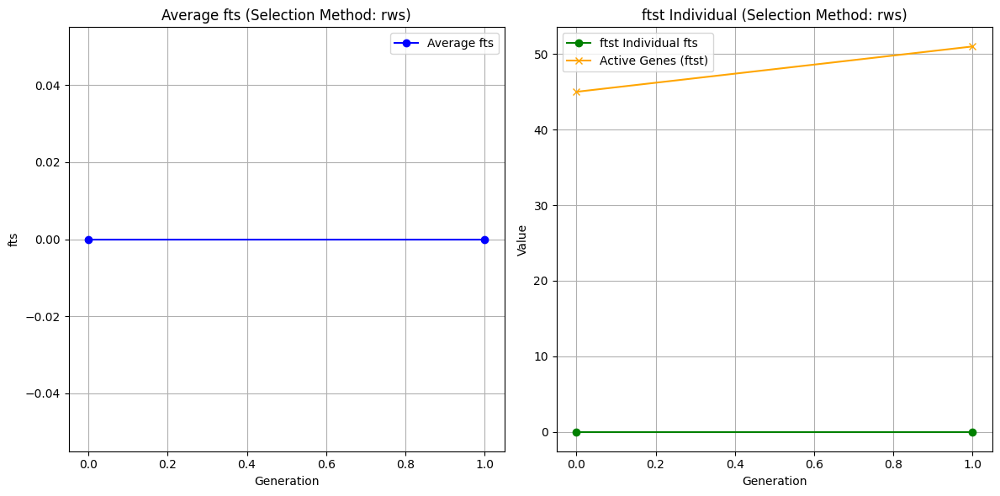

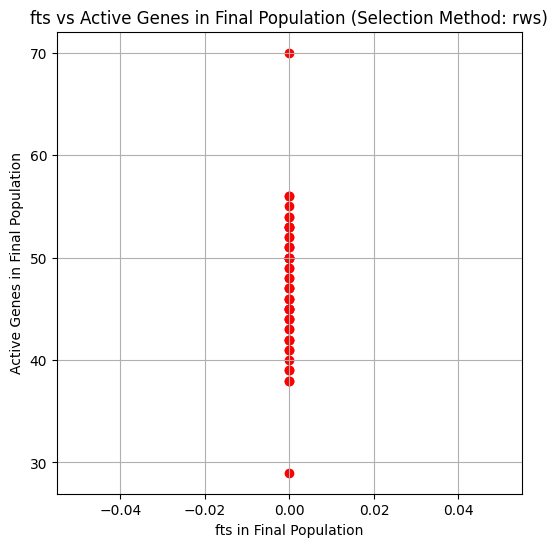

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 96


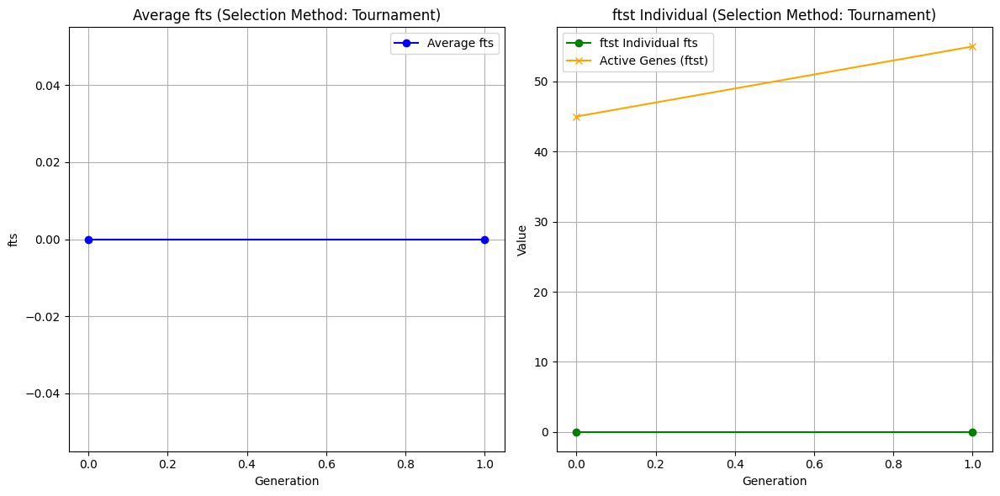

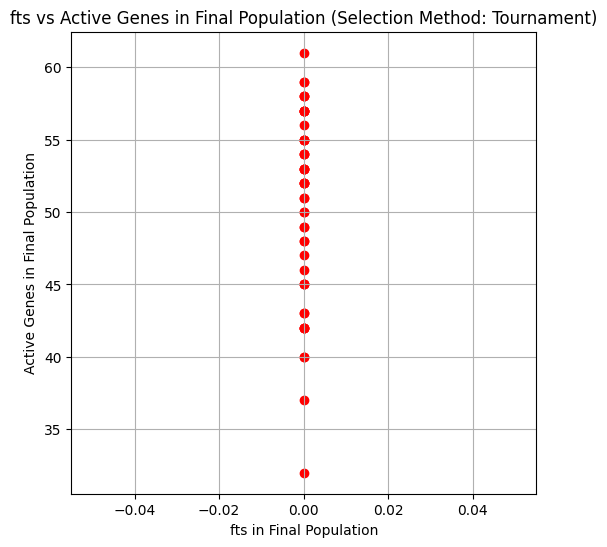

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 100
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.05 ---
Stopping at 1
Stopping at 1


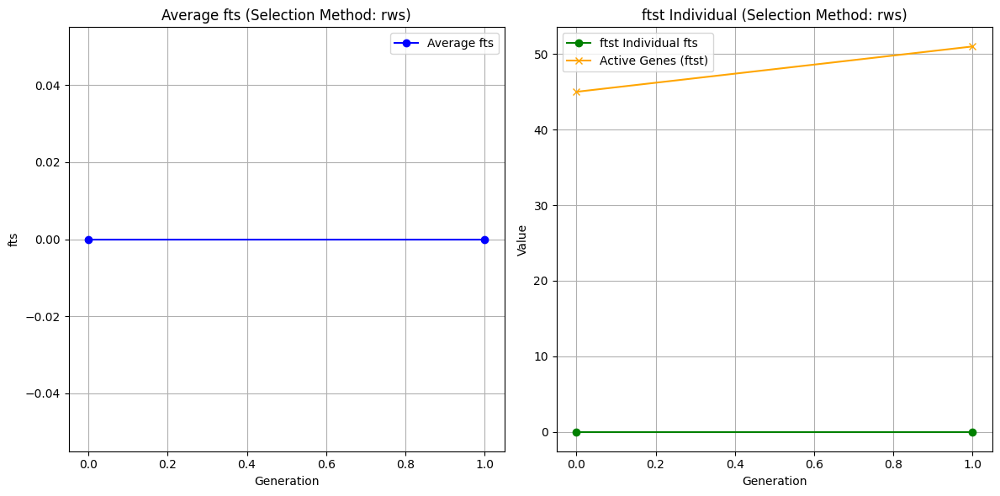

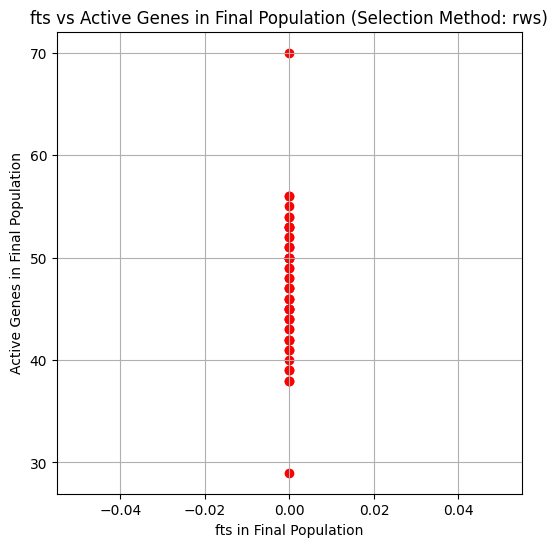

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 96


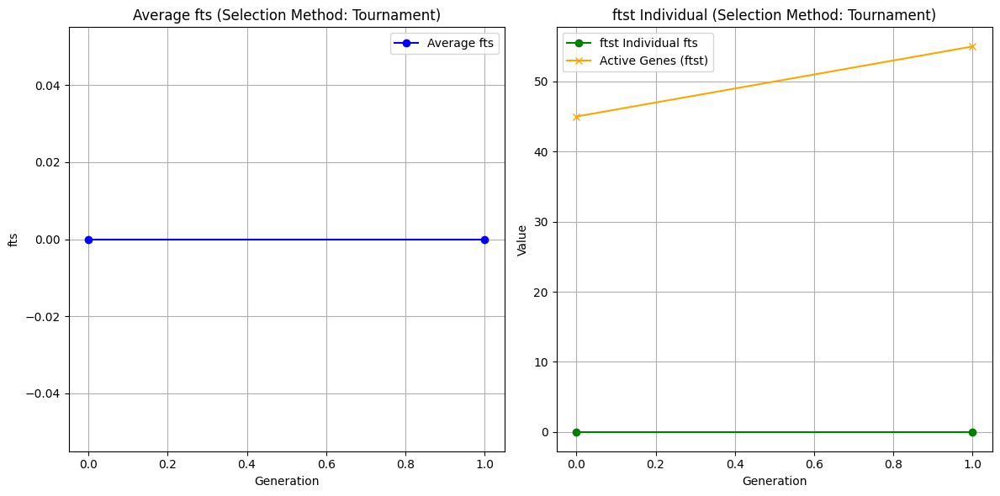

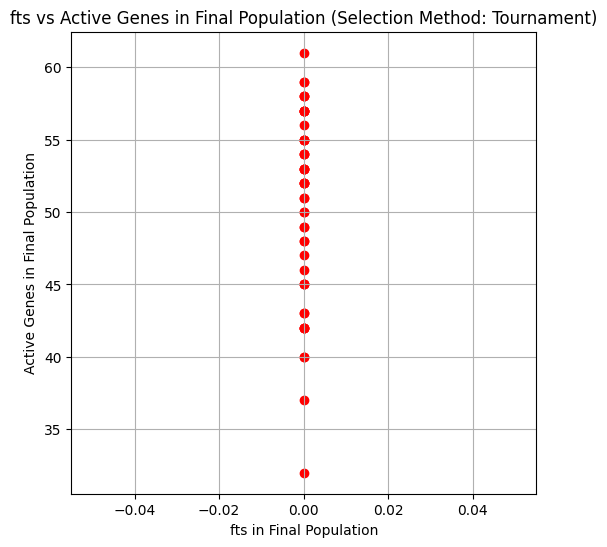

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 100
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.1 ---
Stopping at 1
Stopping at 1


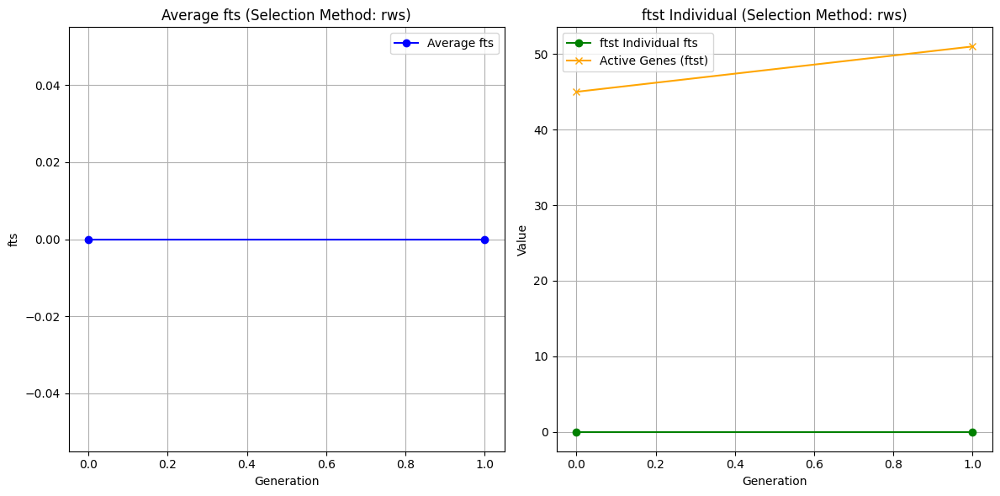

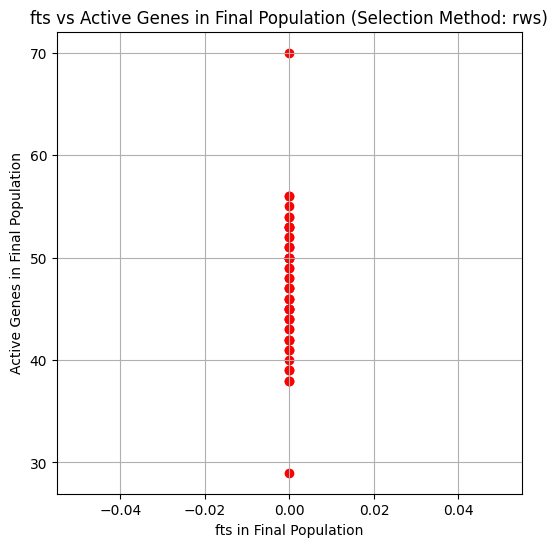

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 96


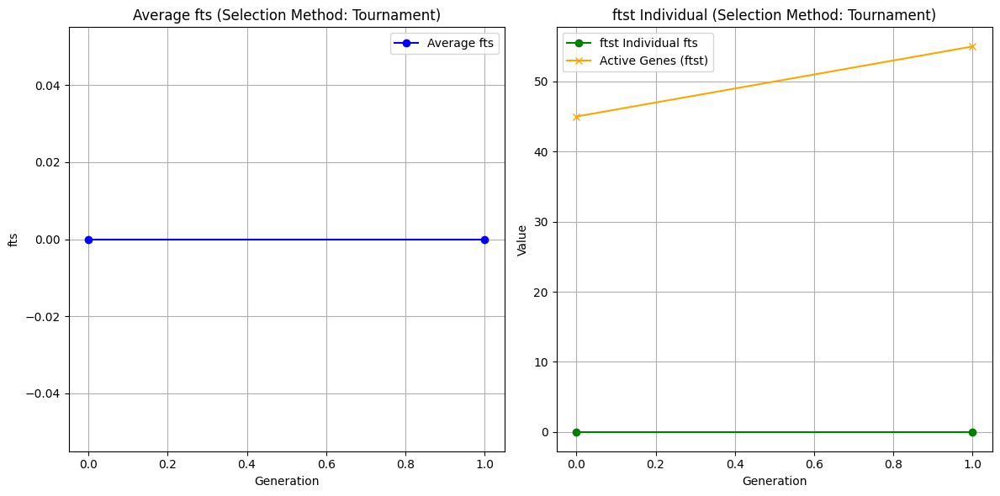

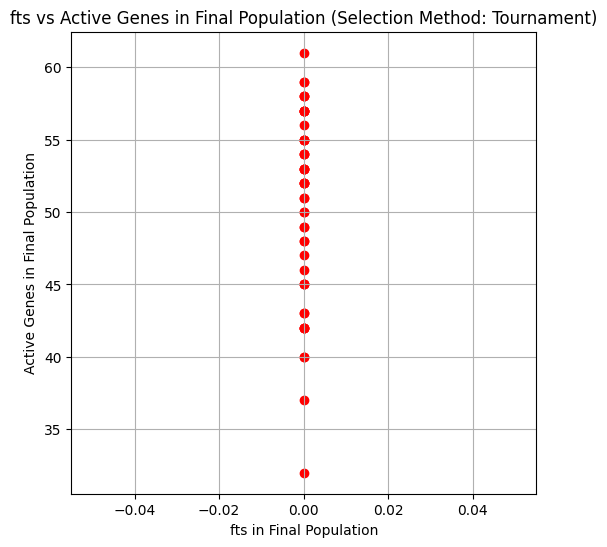

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 100
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.15000000000000002 ---
Stopping at 1
Stopping at 1


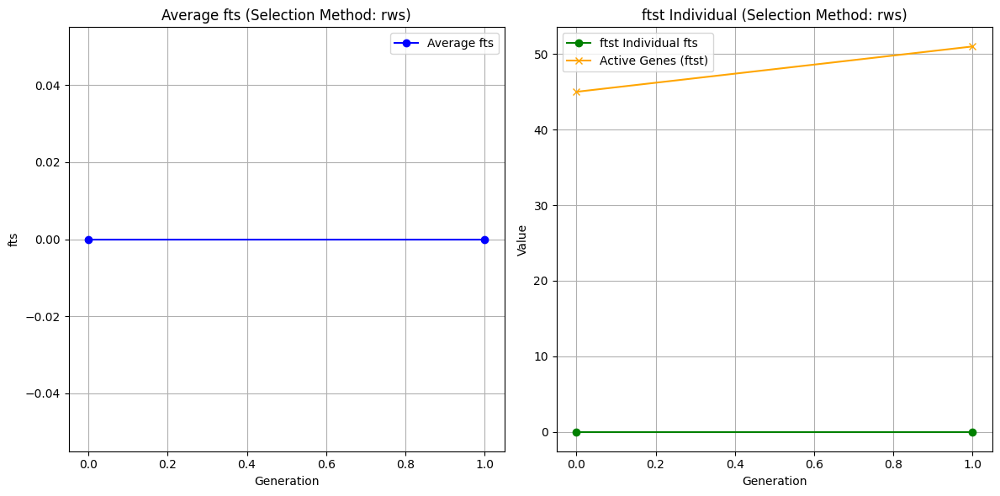

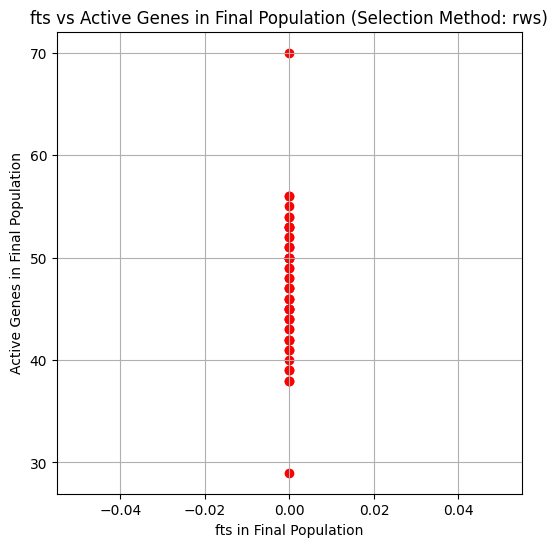

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 96


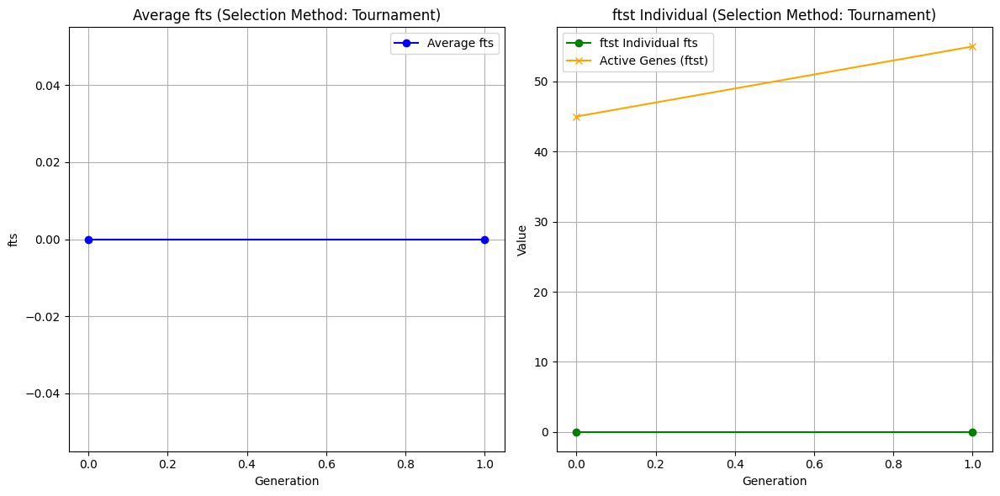

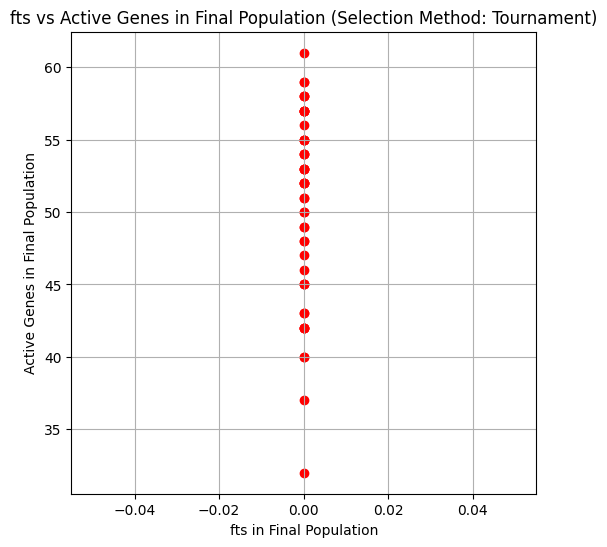

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 100
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0

--- Mutation Rate: 0.2 ---
Stopping at 1
Stopping at 1


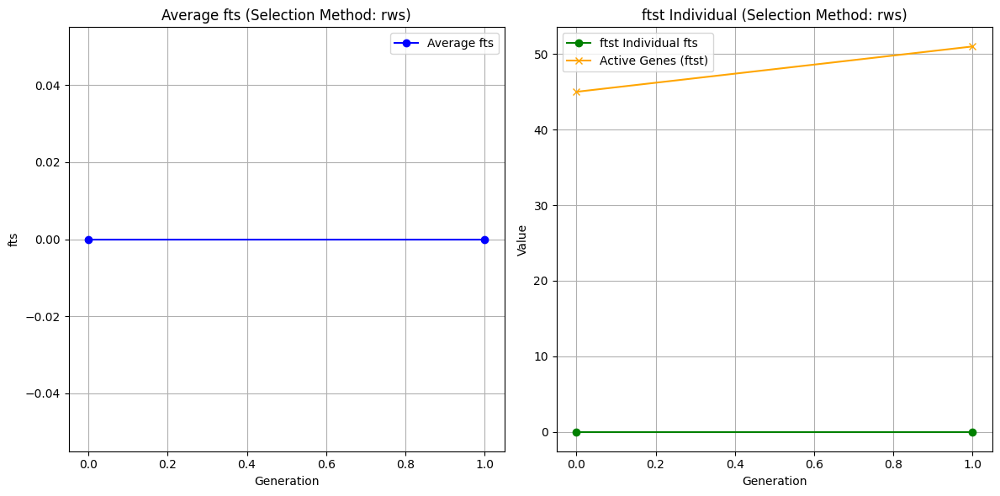

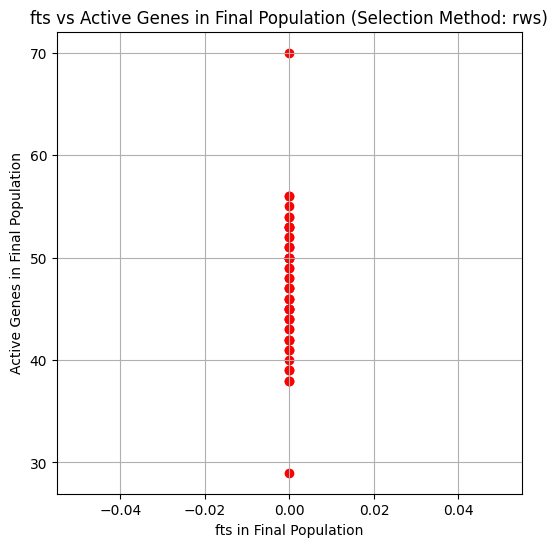

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 96


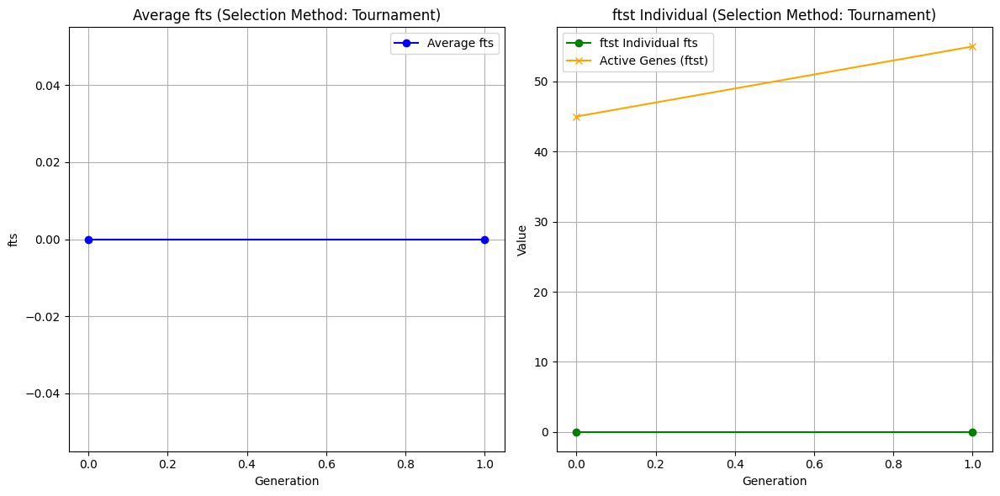

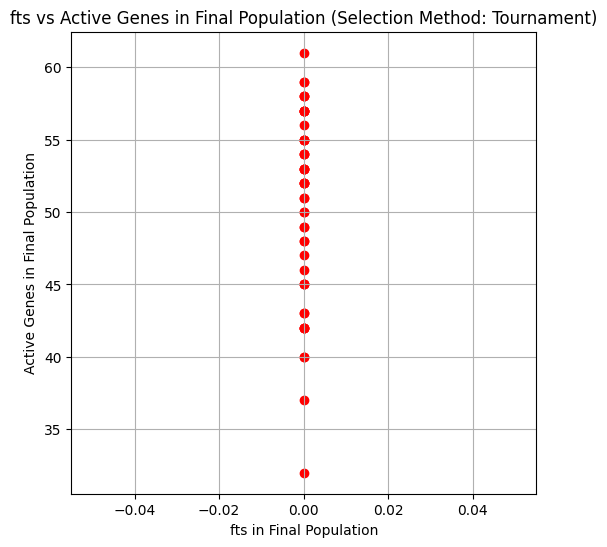

bst fts: 0.00 in Generation 0
bst Solution Active Genes: 100
Best Overall Solution (Roulette): Fitness = 0, Generation = 0
Best Overall Solution (Tournament): Fitness = 0, Generation = 0
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00        0        0       0       0
1  0.05        0        0       0       0
2  0.10        0        0       0       0
3  0.15        0        0       0       0
4  0.20        0        0       0       0


In [48]:
config = "config_1.txt"
cmpr(config)
config = "config_2.txt"
cmpr(config)

**Stop function with Own Fitness**

In [49]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, gen, stp

In [50]:
def rpmyfit(individual, s, wgt):
    twgt = sum([s[i][0] for i in range(len(individual)) if individual[i] == 1])
    if twgt > wgt:
        rem = [(s[i][0]/s[i][1], i) for i in range(len(s))]
        rem.sort()
        for i, j in rem:
            if individual[j] == 1:
                individual[j] = 0
                twgt -= s[j][0]
                if twgt <= wgt:
                    break
    return individual

def myfit(individual, s, wgt, pfact=0.5):
    tval = 0
    twgt = 0
    for i, gene in enumerate(individual):
        if gene == 1:
            tval += s[i][1]
            twgt += s[i][0]
    if twgt <= wgt:
        ftscore = tval
    else:
        penalty = pfact * (twgt - wgt)
        ftscore = tval - penalty
    return ftscore

In [51]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]

In [52]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=3):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [53]:
def co(parent1,parent2, cort = 0.1):
    r = np.random.rand()
    if r <= cort:
        child1 = parent1
        child2 = parent2
    else:
        cp = np.random.randint(1,len(parent1 -1))
        child1 = np.concatenate([parent1[:cp], parent2[cp:]])
        child2 = np.concatenate([parent1[cp:], parent2[:cp]])
    return child1,child2

In [54]:
def mut(cr, mrt):
    num = np.random.rand()
    for i in range(len(cr)):
        if num < mrt:
            if cr[i] == 1:
                cr[i] = 0
            else:
                cr[i] = 1
    return cr

In [55]:
def mystop(avgftg, generation, maxgen, noimplimit=10, minimpfit=1e-6, threshold=0.1):
    if generation >= maxgen:
        return True
    if generation > noimplimit:
        ravgft = avgftg[-noimplimit:]
        improvement = ravgft[-1] - ravgft[0]
        if abs(improvement) < minimpfit:
            return True
    if len(avgftg) > 1:
        diversity = np.std(avgftg[-5:])
        if diversity < threshold:
            return True
    return False

def sc(config, criteria='ts', mrt=0.1):
    p, wgt, s, generation, stop = getpop(config)
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, 0
    for gen in range(stop):
        fts = [myfit(i, s, wgt) for i in p]
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)
            else:
                p1, p2 = ts(p, fts)
            p1 = rpmyfit(p1, s, wgt)
            p2 = rpmyfit(p2, s, wgt)
            newpop.append(p1)
            newpop.append(p2)
        p = np.array(newpop)
        if gen == 0:
            avgftg.append(np.mean(fts))
            bstid = np.argmax(fts)
            ftsol = p[bstid]
            f = fts[bstid]
            twgt = sum([s[i][0] * gene for i, gene in enumerate(ftsol)])
            if twgt <= wgt:
                ftst.append(f)
                actg.append(sum(ftsol))
        nfts = [myfit(i, s, wgt) for i in p]
        avgftg.append(np.mean(nfts))
        bstid = np.argmax(nfts)
        ftsol = p[bstid]
        f = nfts[bstid]
        ftst.append(f)
        actg.append(sum(ftsol))
        if f > bstft:
            bstft, bstsol, bstgen = f, ftsol, gen
        if mystop(avgftg, gen, stop):
            print(f"Stopping at {gen}")
            break
    pfit = list(map(lambda i: myfit(i, s, wgt), p))
    pactive = list(map(sum, p))
    return avgftg, ftst, actg, bstsol, bstft, bstgen, pfit, pactive

Stopping at 17


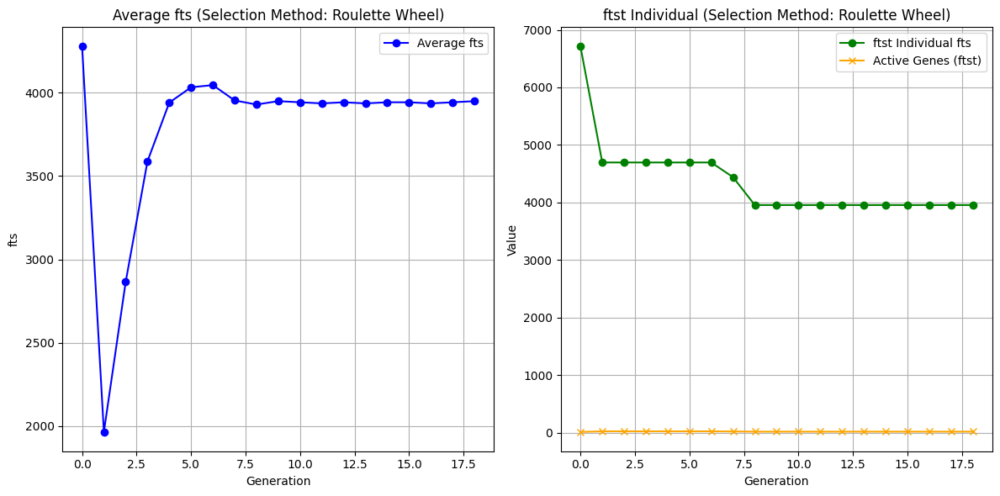

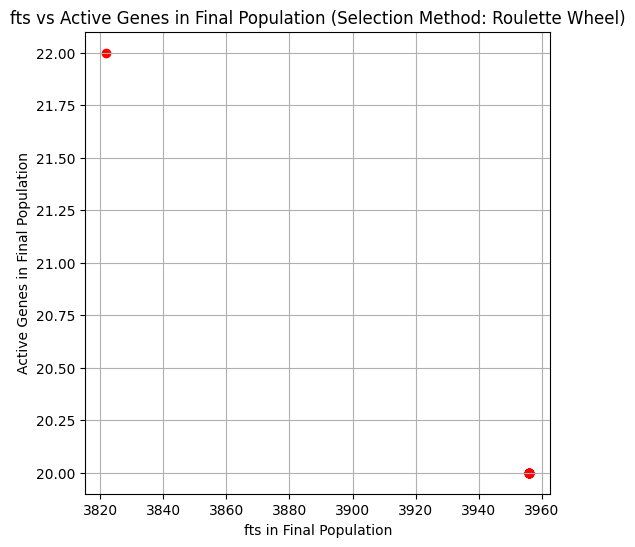

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 408
Stopping at 9


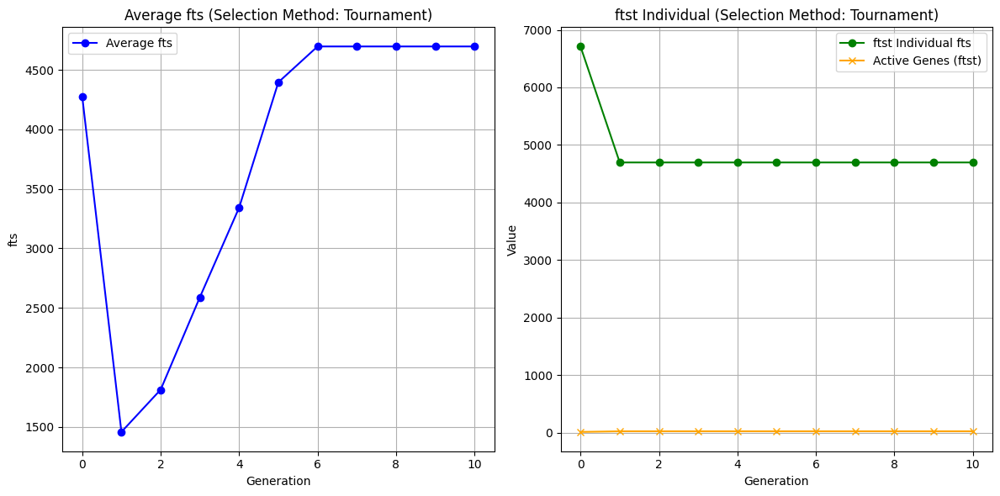

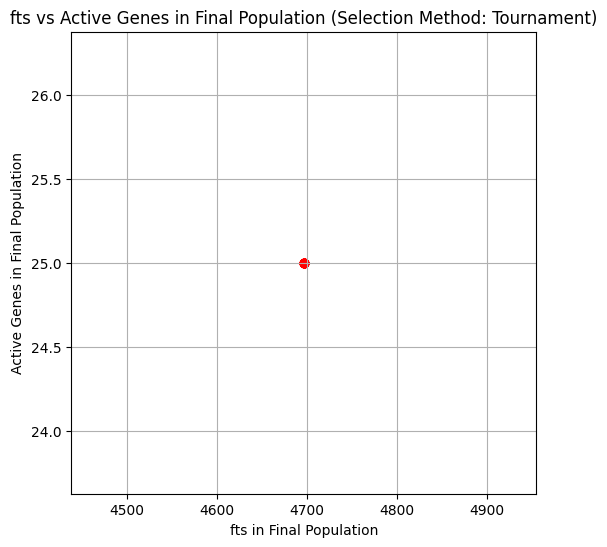

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 264


In [56]:
config = "config_1.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

Stopping at 14


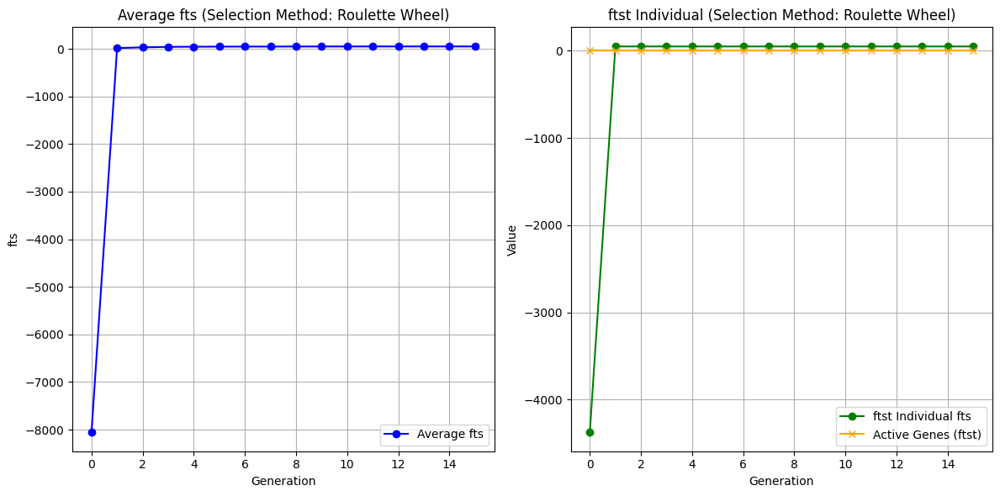

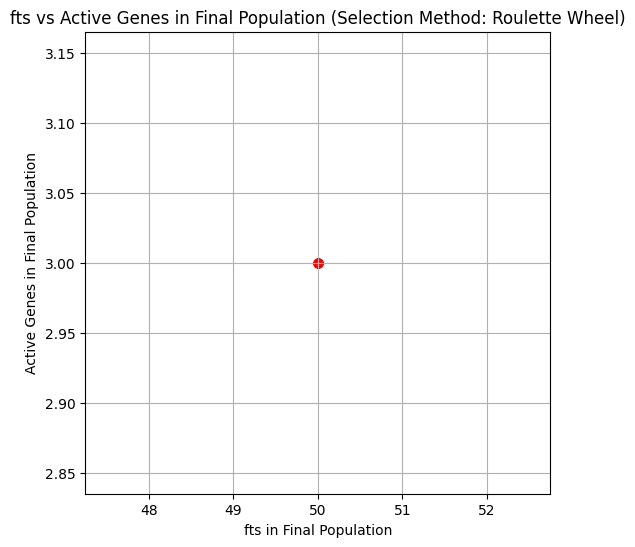

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 50
Stopping at 8


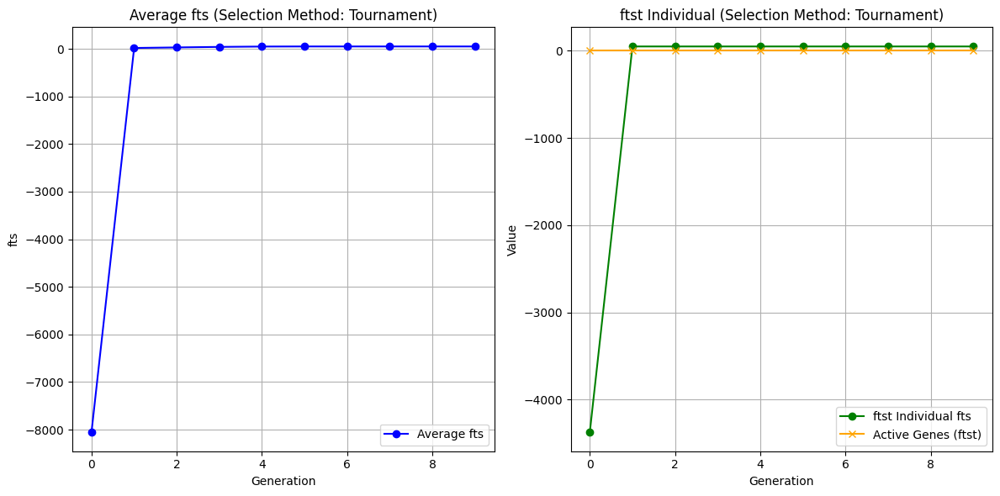

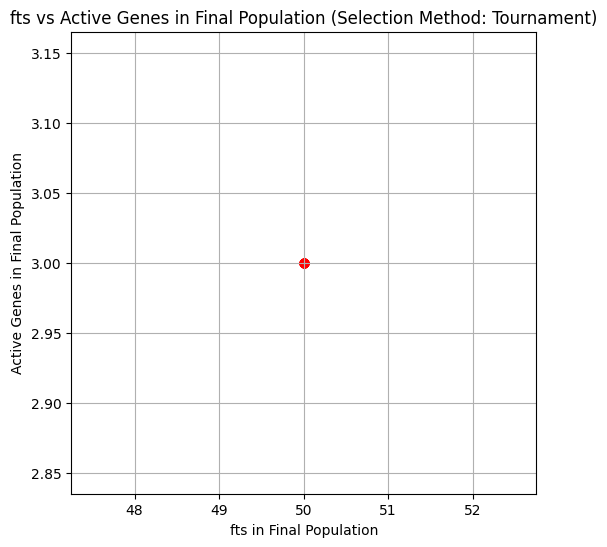

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 30


In [57]:
config = "config_2.txt"
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='rws')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Roulette Wheel", pfit, pactive)
avgft, ftst, actg, bstsol, bstft, bstgen, pfit, pactive = sc(config, criteria='ts')
res(avgft, ftst, actg, len(avgft), bstft, bstgen, "Tournament", pfit, pactive)

In [58]:
def viz(rdata, tdata, mrt):
    genr = range(len(rdata[0]))
    tgen = range(len(tdata[0]))
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(genr, rdata[0], label="Avg Fitness", color='blue', marker='o')
    plt.plot(genr, rdata[1], label="Fittest Fitness", color='blue', marker='x')
    plt.plot(genr, rdata[2], label="Active Genes", color='blue', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Roulette Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(tgen, tdata[0], label="Avg Fitness", color='red', marker='o')
    plt.plot(tgen, tdata[1], label="Fittest Fitness", color='red', marker='x')
    plt.plot(tgen, tdata[2], label="Active Genes", color='red', linestyle='dashed')
    plt.xlabel("Generation")
    plt.ylabel("Value")
    plt.title(f"Tournament Selection (mrate={mrate})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

def cmpr(config):
    rlts = []
    for mrt in np.arange(0, 0.25, 0.05):
        print(f"\n--- Mutation Rate: {mrt} ---")
        rdata = sc(config, criteria='rws', mrt=mrt)
        tdata = sc(config, criteria='ts', mrt=mrt)
        rlts.append({
            'mrt':mrt,
            'rws fit': rdata[4],
            'rws gen': rdata[5],
            'ts fit': tdata[4],
            'ts gen': tdata[5]
        })
        res(rdata[0], rdata[1], rdata[2], len(rdata[0]), rdata[4], rdata[5], 'rws', rdata[6], rdata[7])
        res(tdata[0], tdata[1], tdata[2], len(tdata[0]), tdata[4], tdata[5], 'Tournament', tdata[6], tdata[7])
        print(f"Best Overall Solution (Roulette): Fitness = {rdata[4]}, Generation = {rdata[5]}")
        print(f"Best Overall Solution (Tournament): Fitness = {tdata[4]}, Generation = {tdata[5]}")
    results = pd.DataFrame(rlts)
    print("Results:")
    print(results)




--- Mutation Rate: 0.0 ---
Stopping at 17
Stopping at 9


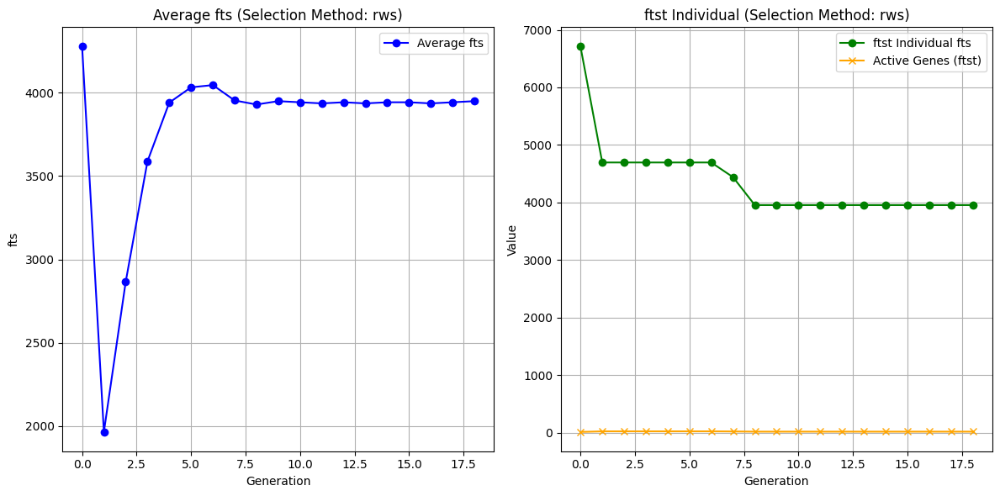

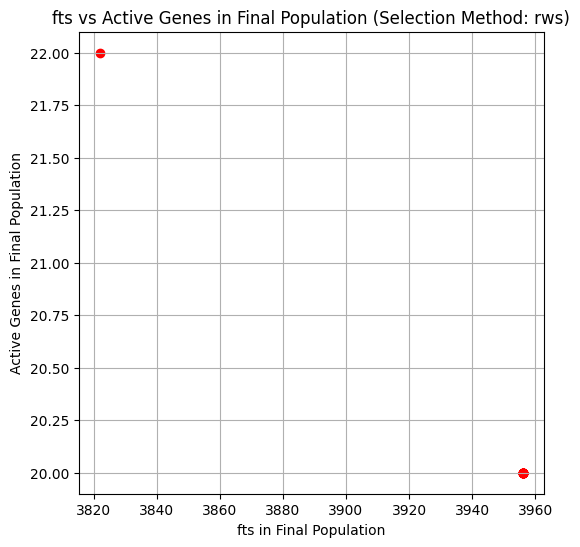

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 408


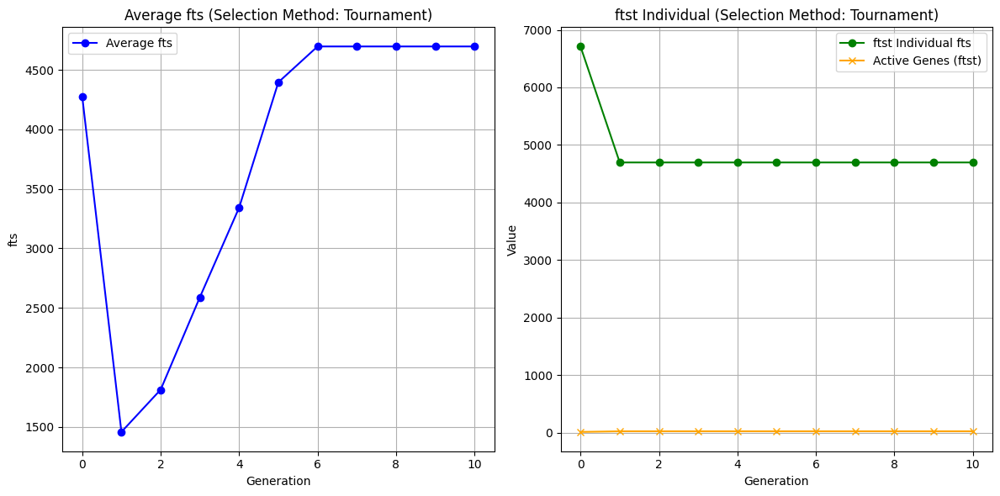

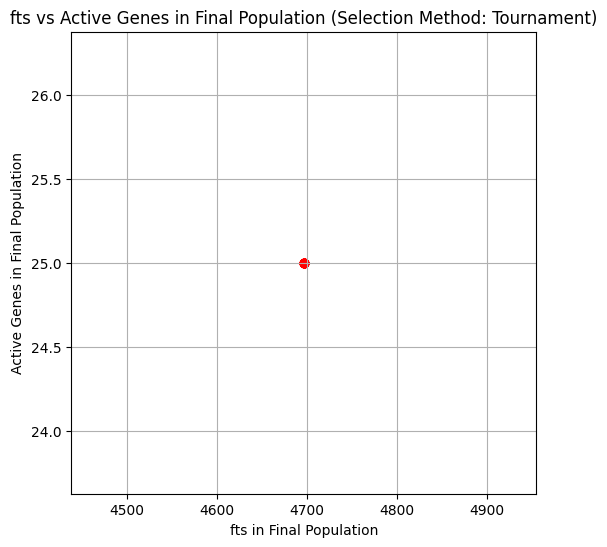

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 264
Best Overall Solution (Roulette): Fitness = 4696, Generation = 0
Best Overall Solution (Tournament): Fitness = 4696, Generation = 0

--- Mutation Rate: 0.05 ---
Stopping at 17
Stopping at 9


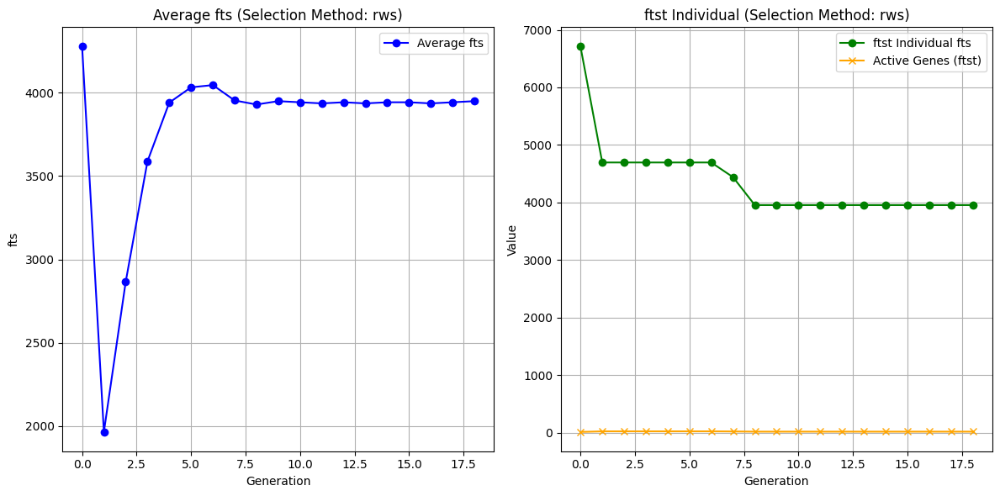

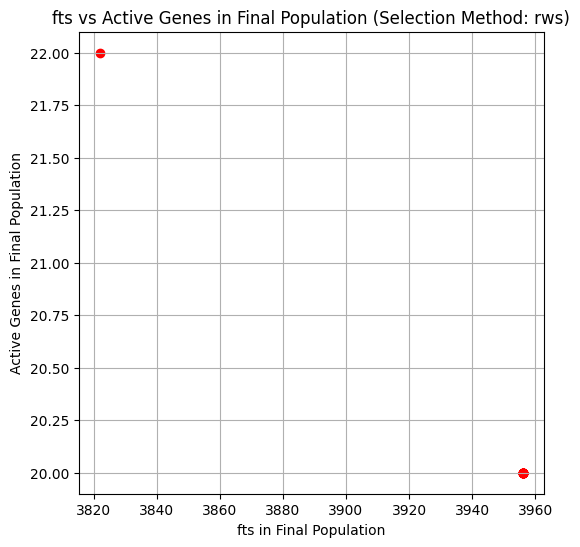

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 408


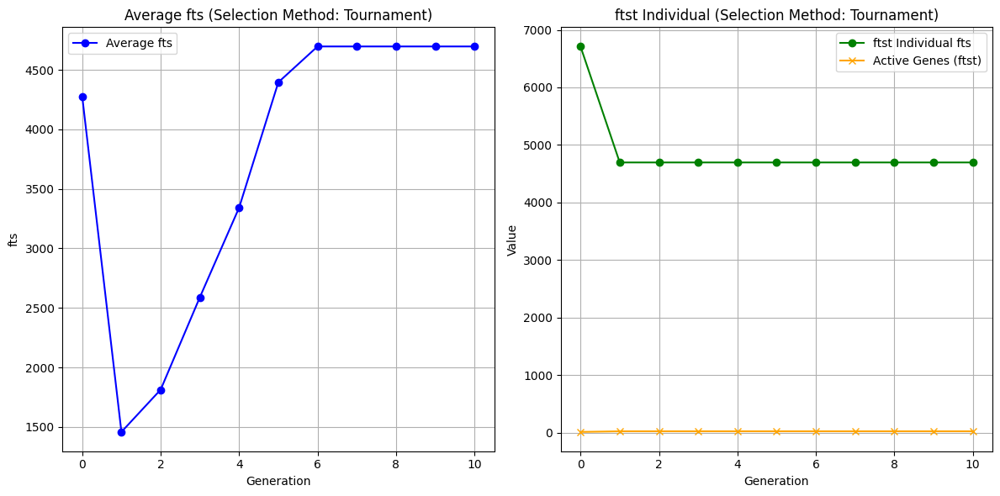

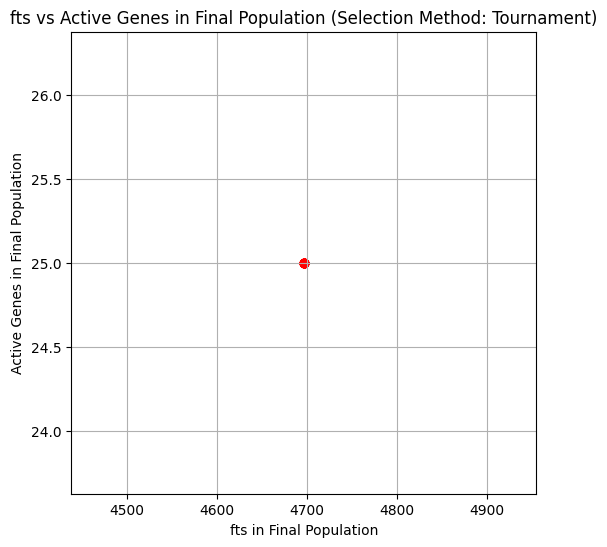

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 264
Best Overall Solution (Roulette): Fitness = 4696, Generation = 0
Best Overall Solution (Tournament): Fitness = 4696, Generation = 0

--- Mutation Rate: 0.1 ---
Stopping at 17
Stopping at 9


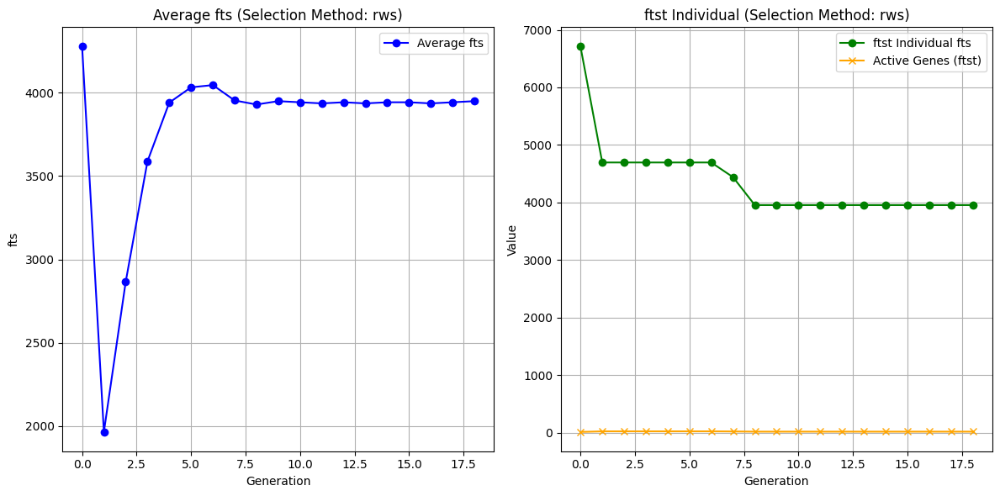

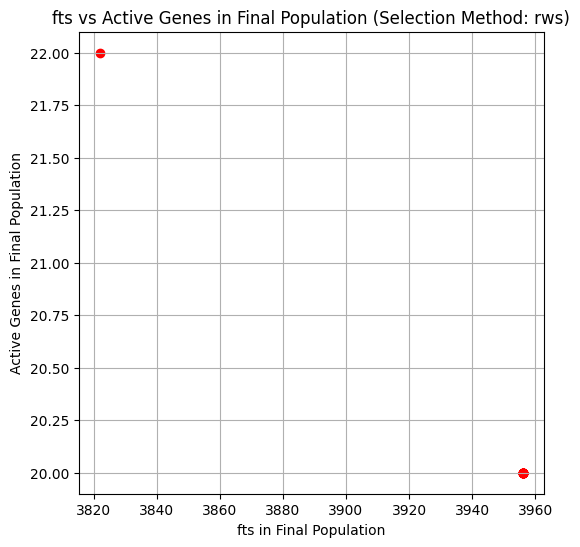

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 408


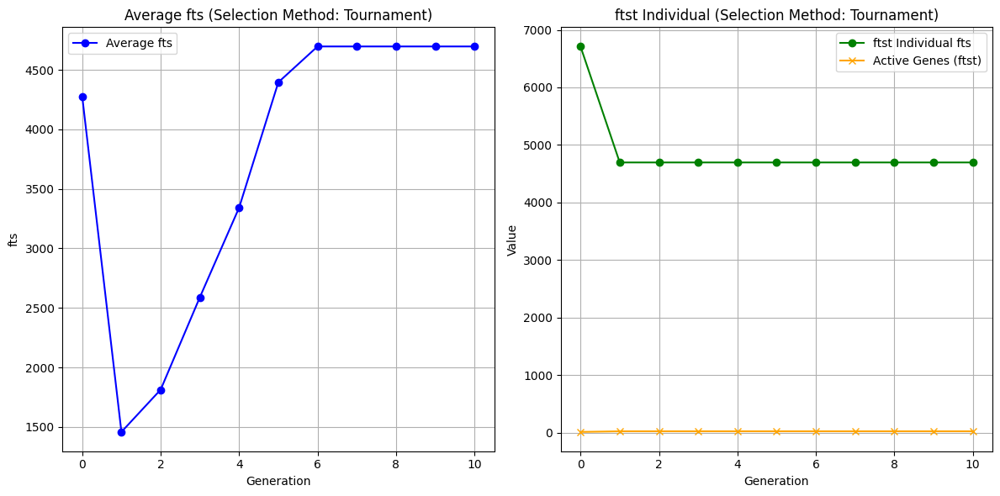

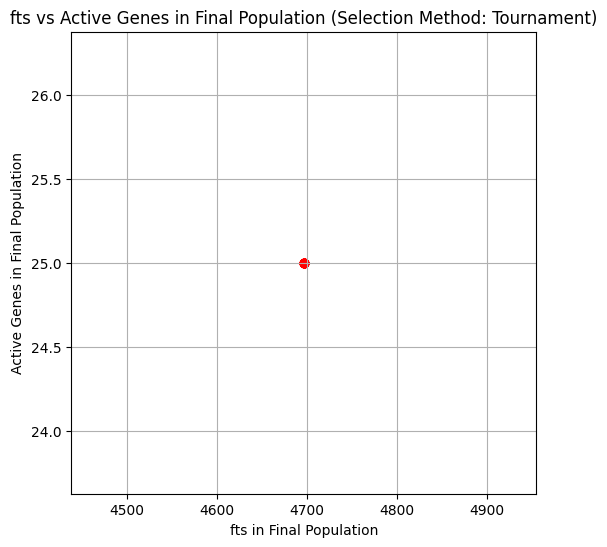

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 264
Best Overall Solution (Roulette): Fitness = 4696, Generation = 0
Best Overall Solution (Tournament): Fitness = 4696, Generation = 0

--- Mutation Rate: 0.15000000000000002 ---
Stopping at 17
Stopping at 9


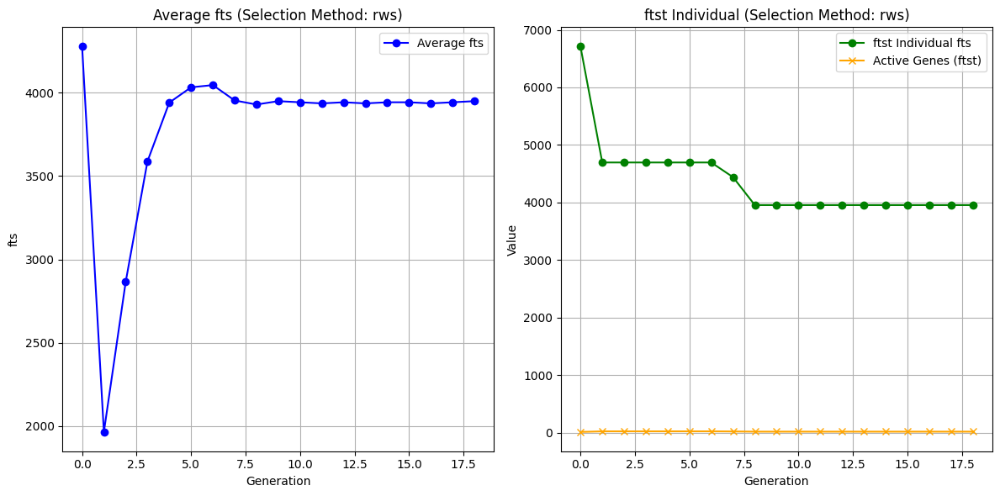

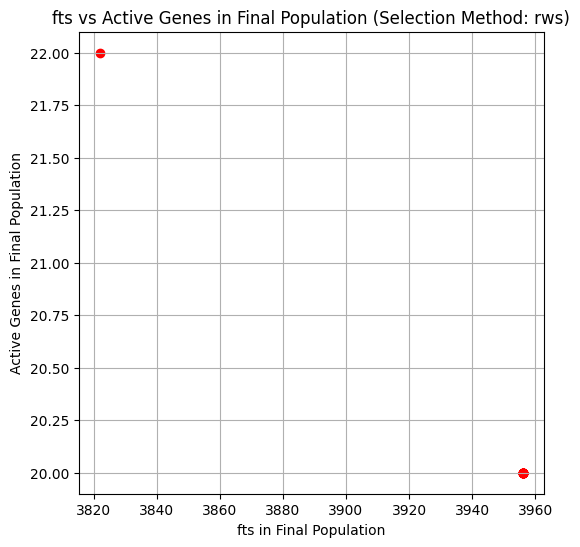

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 408


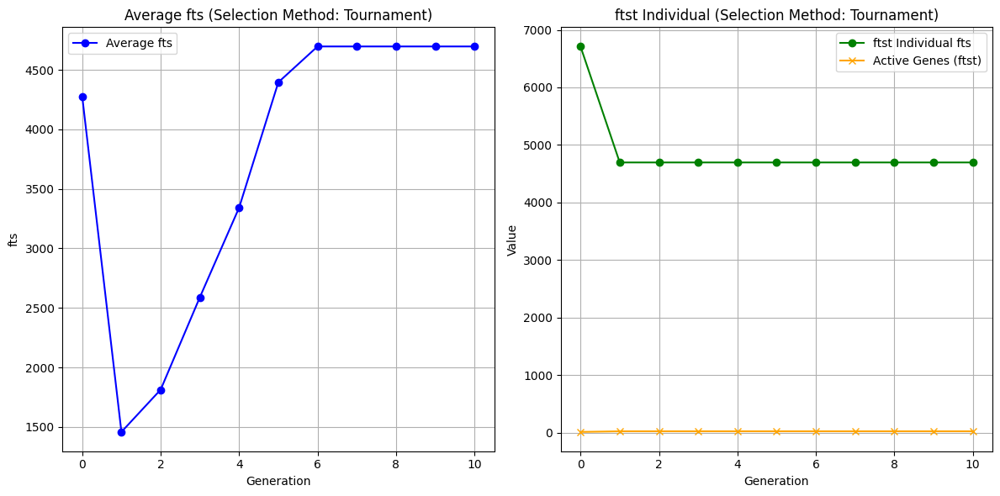

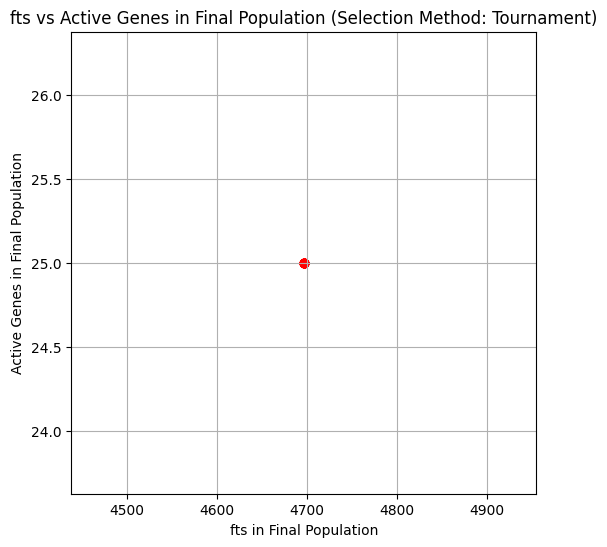

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 264
Best Overall Solution (Roulette): Fitness = 4696, Generation = 0
Best Overall Solution (Tournament): Fitness = 4696, Generation = 0

--- Mutation Rate: 0.2 ---
Stopping at 17
Stopping at 9


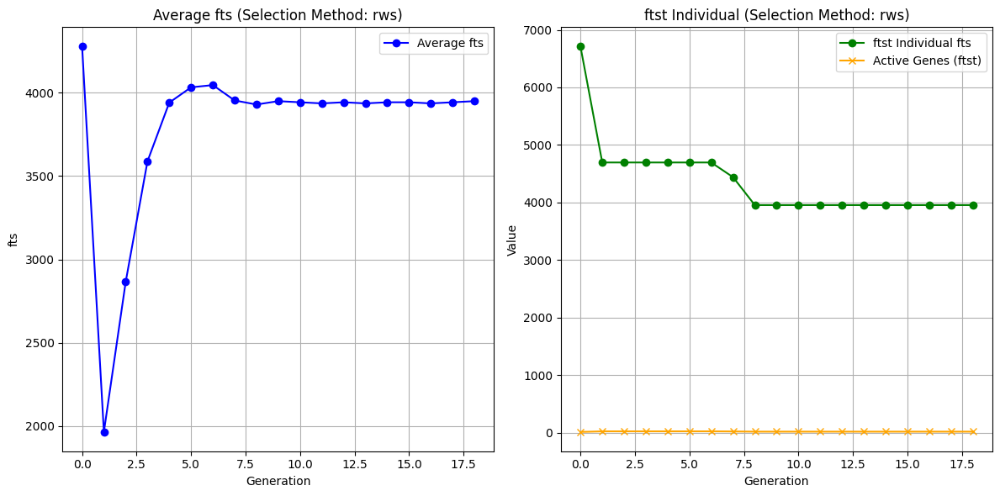

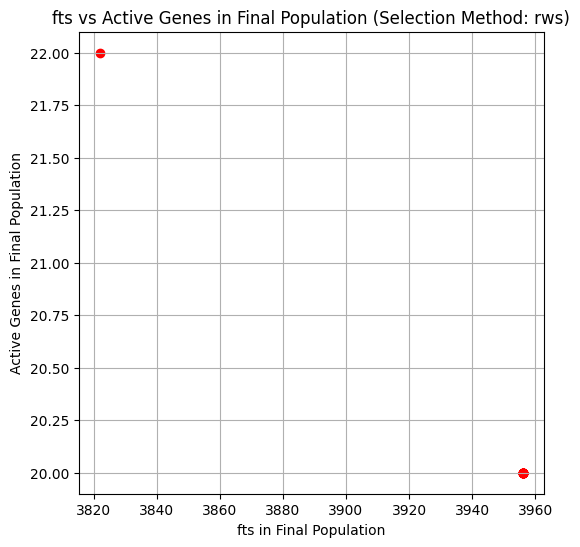

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 408


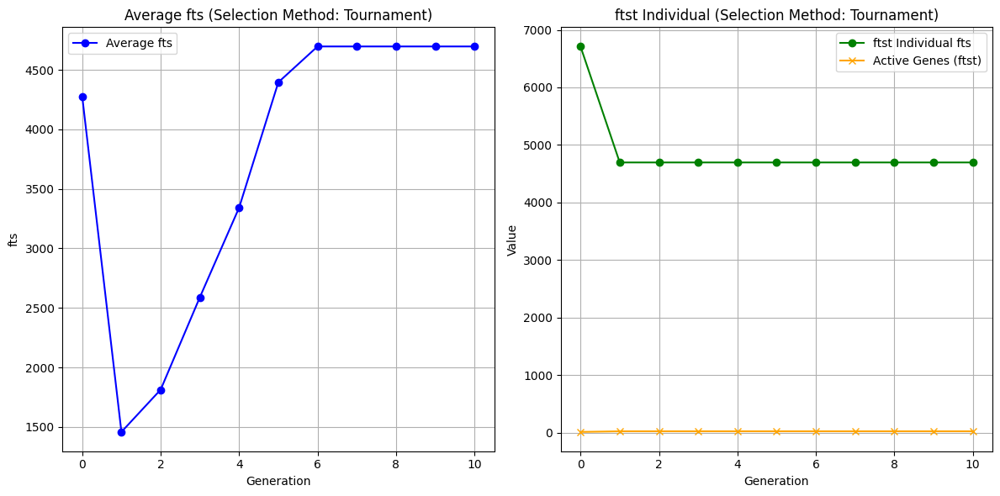

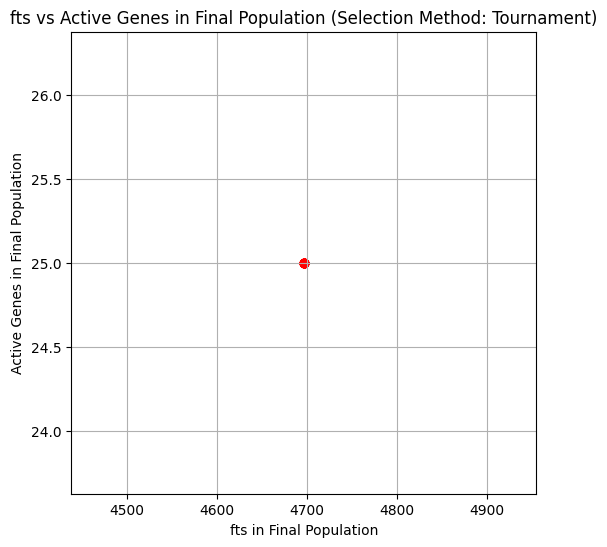

bst fts: 4696.00 in Generation 0
bst Solution Active Genes: 264
Best Overall Solution (Roulette): Fitness = 4696, Generation = 0
Best Overall Solution (Tournament): Fitness = 4696, Generation = 0
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00     4696        0    4696       0
1  0.05     4696        0    4696       0
2  0.10     4696        0    4696       0
3  0.15     4696        0    4696       0
4  0.20     4696        0    4696       0

--- Mutation Rate: 0.0 ---
Stopping at 14
Stopping at 8


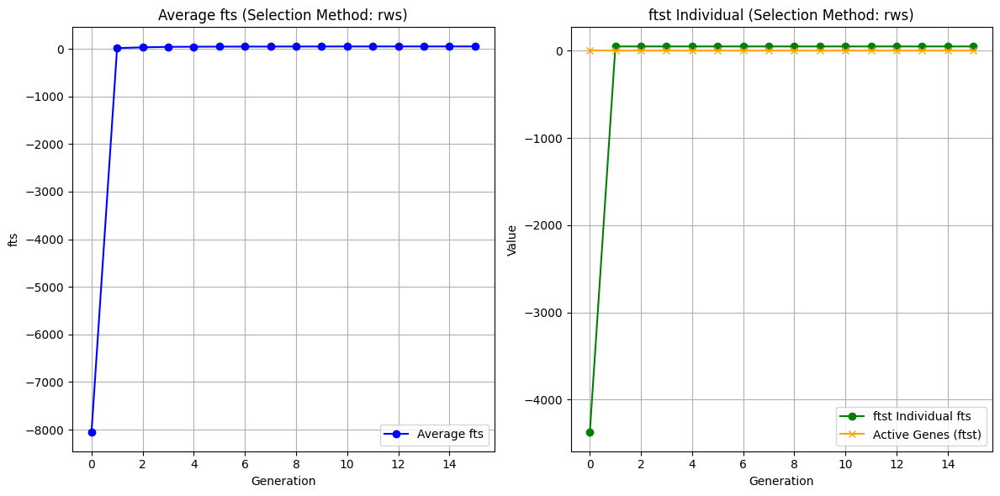

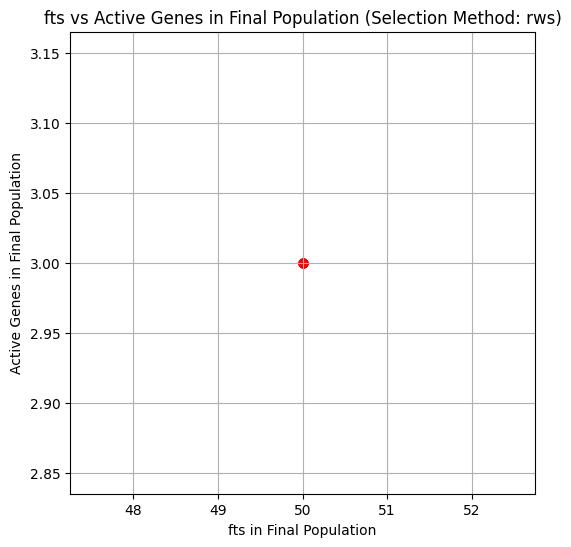

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 50


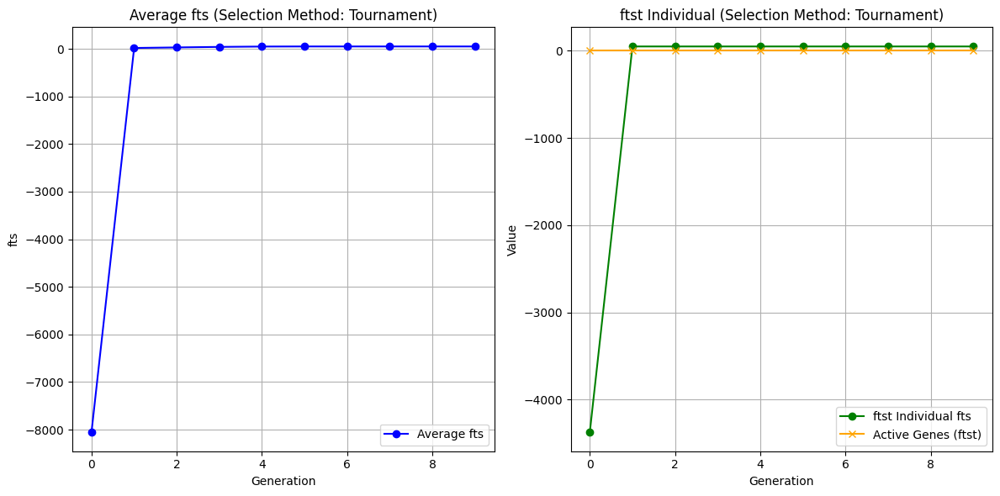

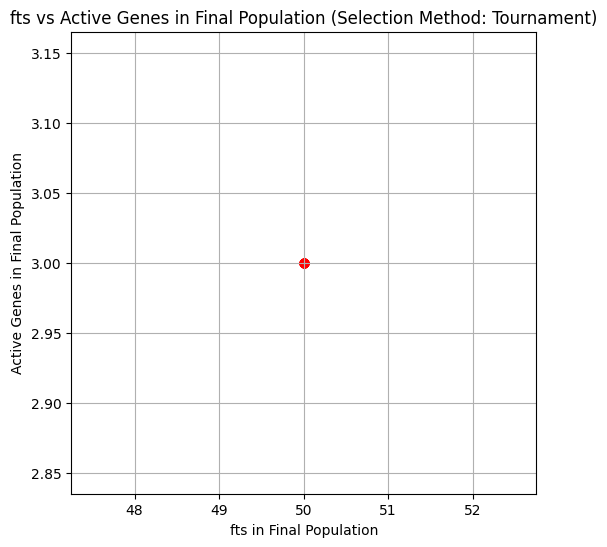

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 30
Best Overall Solution (Roulette): Fitness = 50, Generation = 0
Best Overall Solution (Tournament): Fitness = 50, Generation = 0

--- Mutation Rate: 0.05 ---
Stopping at 14
Stopping at 8


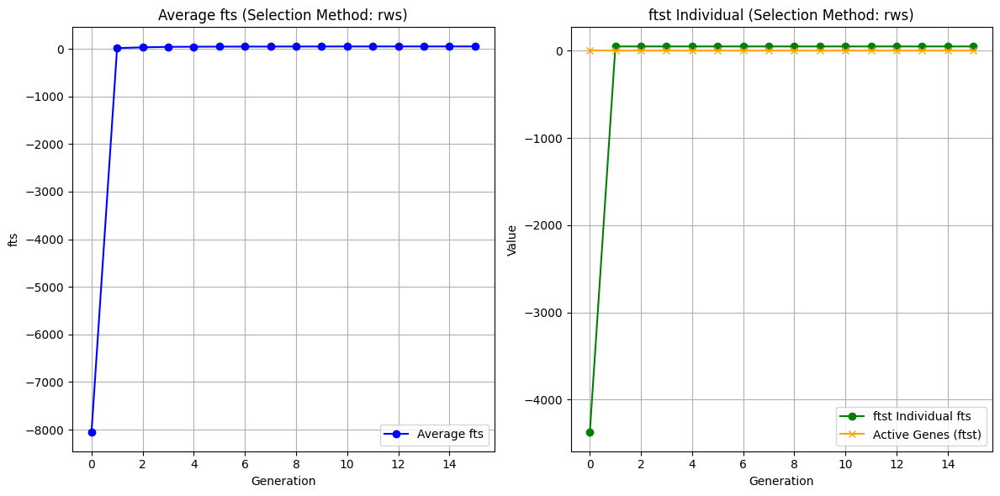

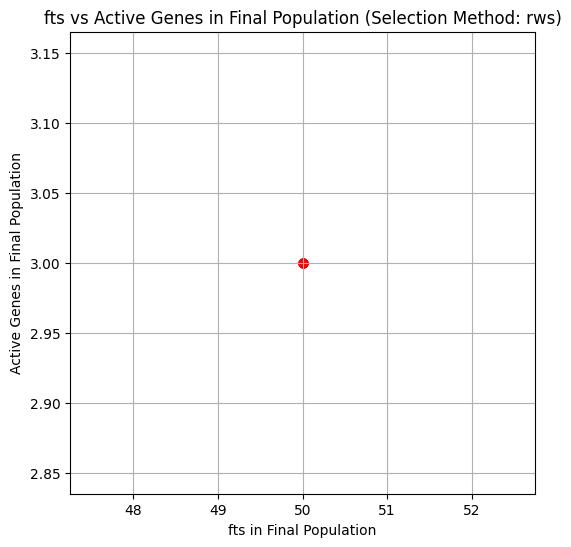

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 50


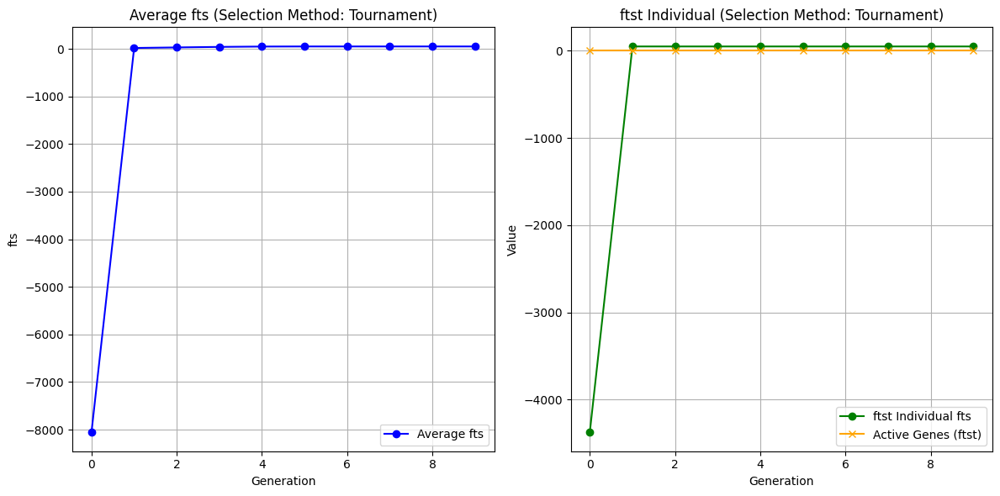

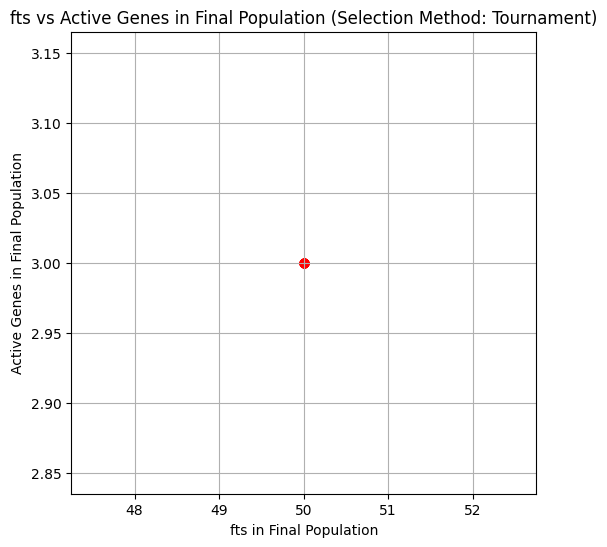

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 30
Best Overall Solution (Roulette): Fitness = 50, Generation = 0
Best Overall Solution (Tournament): Fitness = 50, Generation = 0

--- Mutation Rate: 0.1 ---
Stopping at 14
Stopping at 8


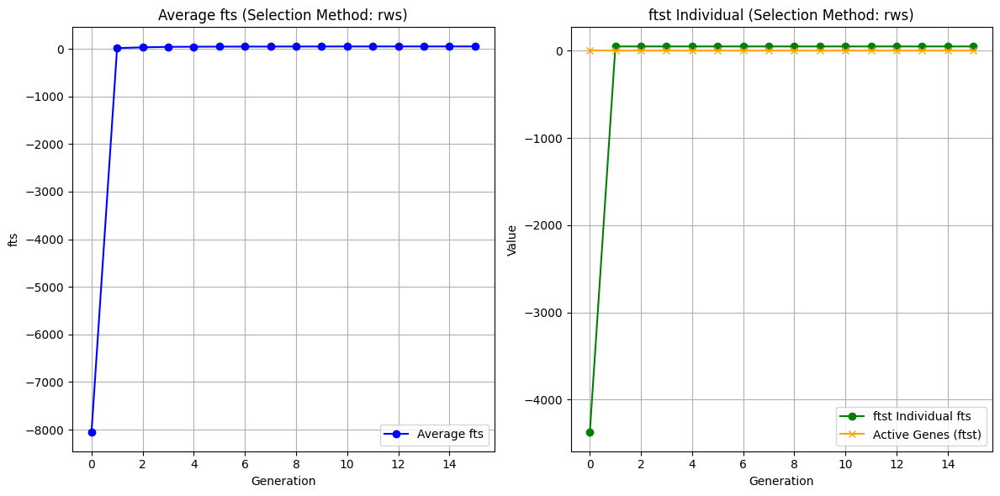

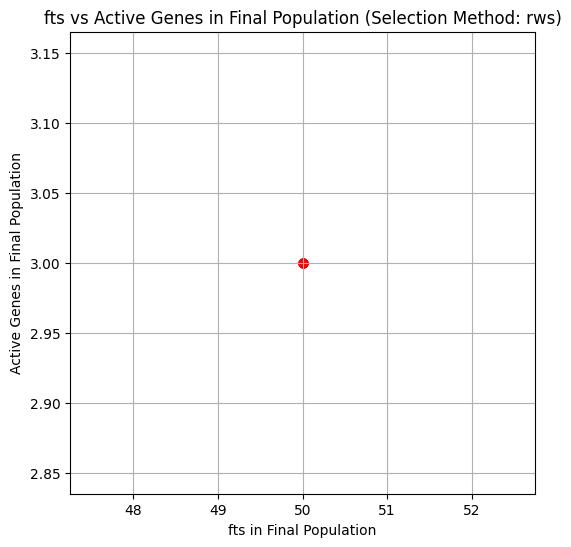

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 50


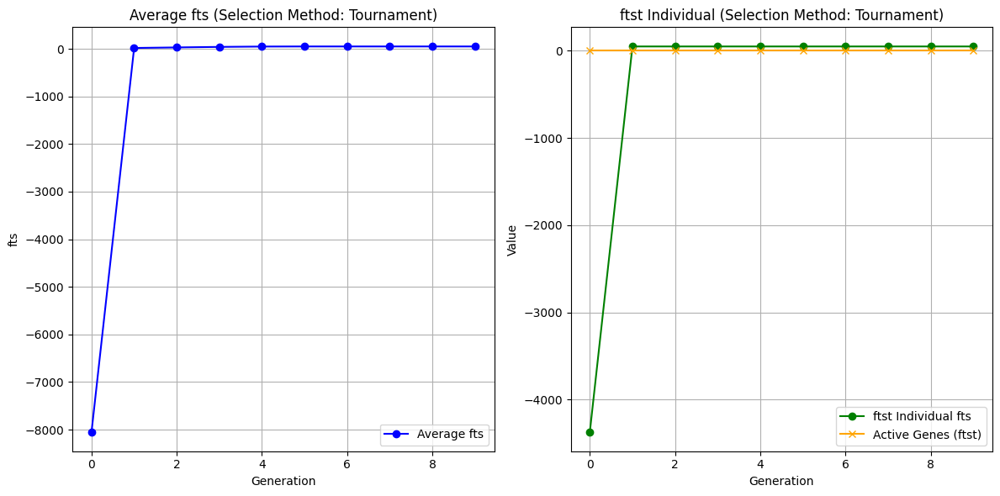

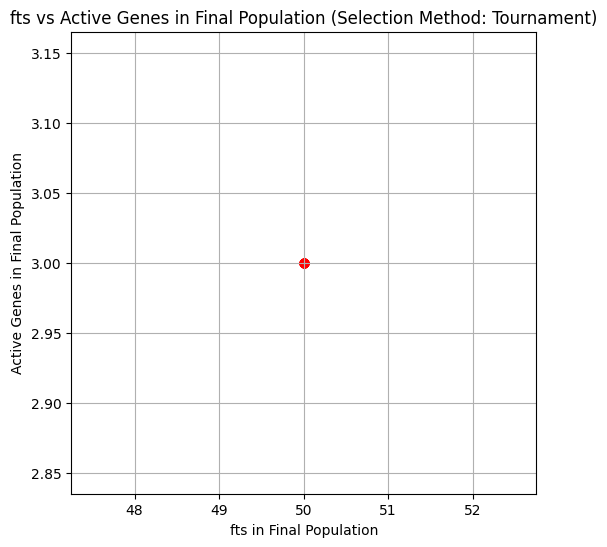

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 30
Best Overall Solution (Roulette): Fitness = 50, Generation = 0
Best Overall Solution (Tournament): Fitness = 50, Generation = 0

--- Mutation Rate: 0.15000000000000002 ---
Stopping at 14
Stopping at 8


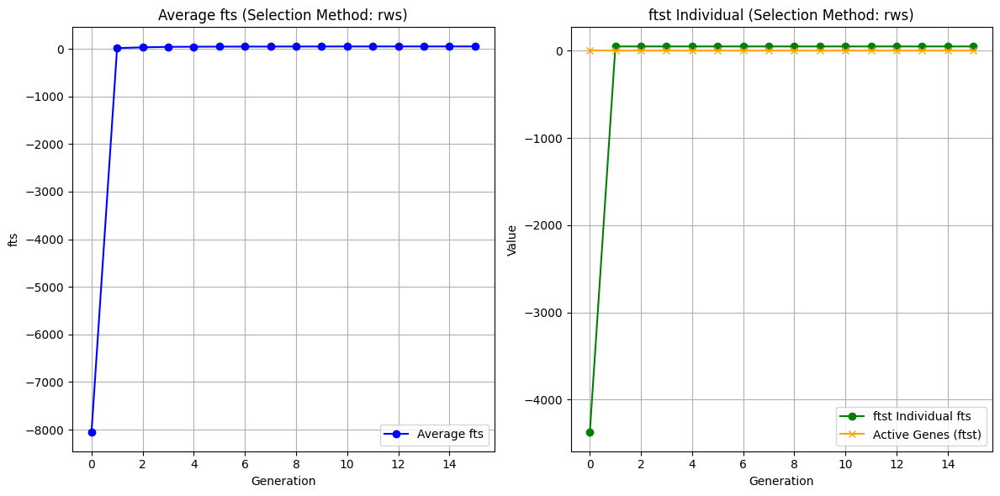

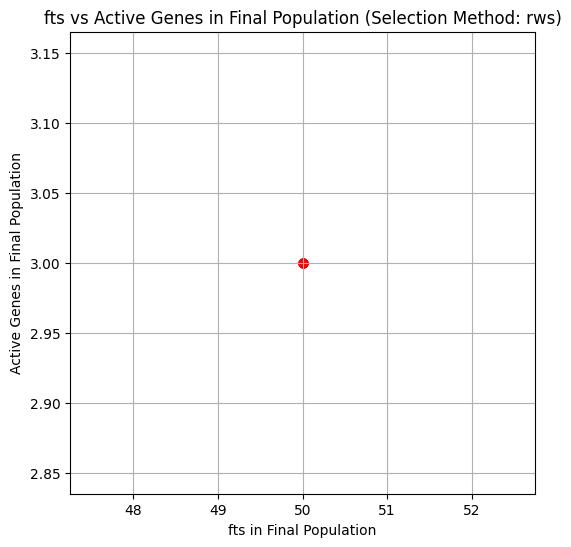

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 50


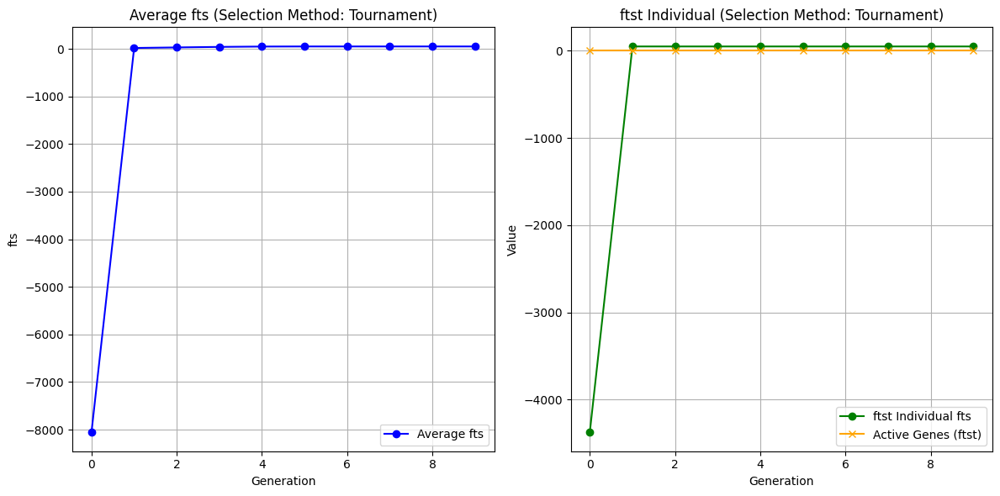

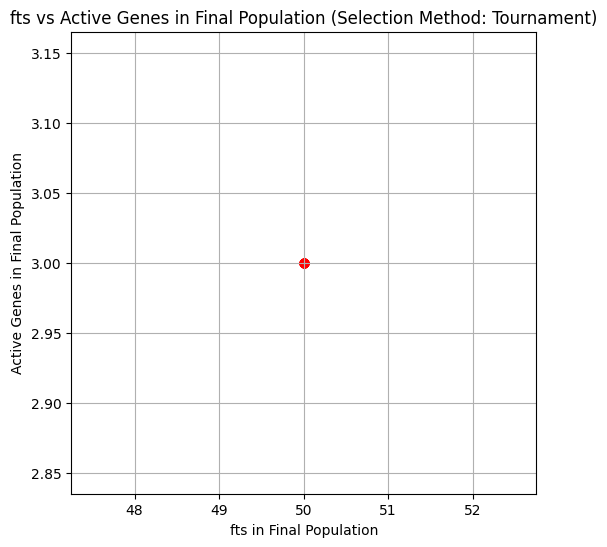

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 30
Best Overall Solution (Roulette): Fitness = 50, Generation = 0
Best Overall Solution (Tournament): Fitness = 50, Generation = 0

--- Mutation Rate: 0.2 ---
Stopping at 14
Stopping at 8


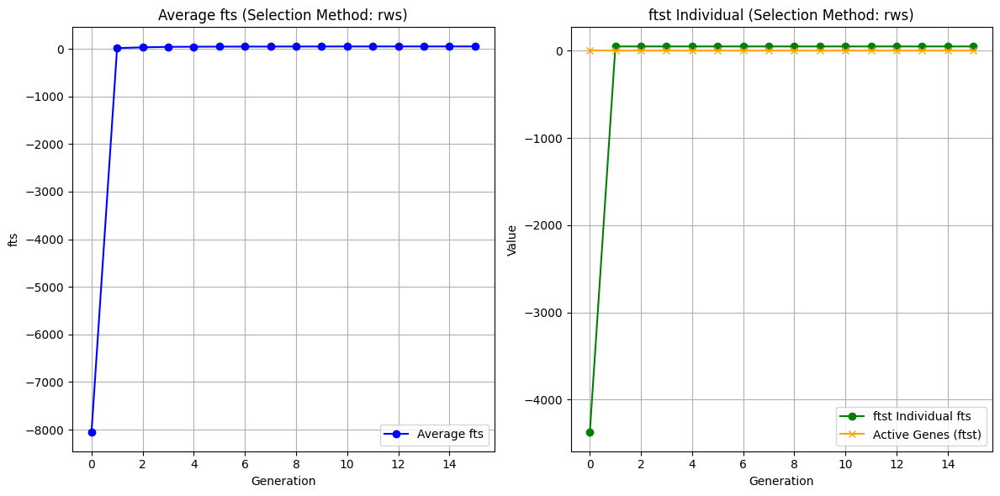

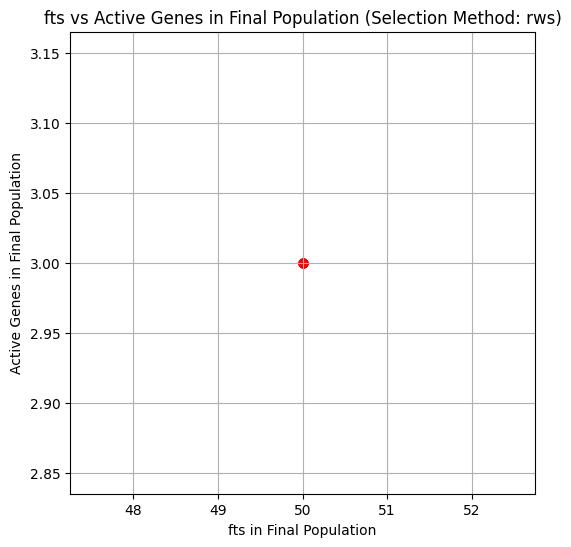

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 50


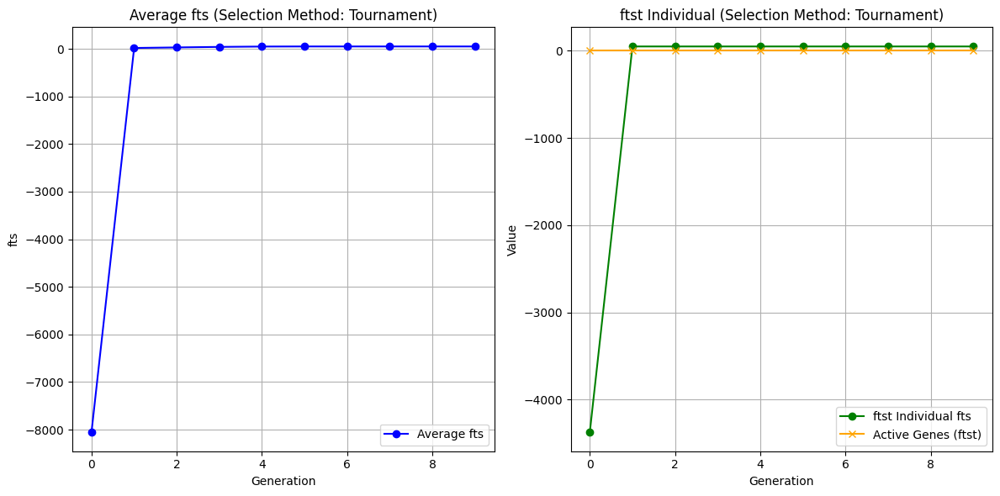

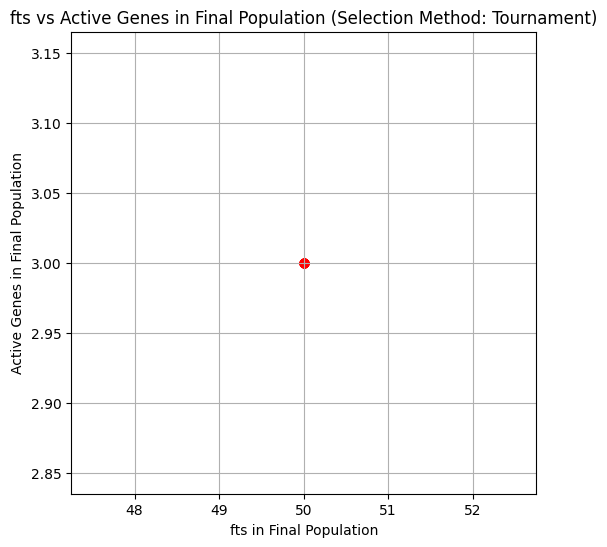

bst fts: 50.00 in Generation 0
bst Solution Active Genes: 30
Best Overall Solution (Roulette): Fitness = 50, Generation = 0
Best Overall Solution (Tournament): Fitness = 50, Generation = 0
Results:
    mrt  rws fit  rws gen  ts fit  ts gen
0  0.00       50        0      50       0
1  0.05       50        0      50       0
2  0.10       50        0      50       0
3  0.15       50        0      50       0
4  0.20       50        0      50       0


In [59]:
config = "config_1.txt"
cmpr(config)
config = "config_2.txt"
cmpr(config)

**Population trails**

In [60]:
def getpop(config, popss):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (popss, n))
    return p, wgt, s, gen, stp

In [61]:
def rpmyfit(individual, s, wgt):
    twgt = sum([s[i][0] for i in range(len(individual)) if individual[i] == 1])
    if twgt > wgt:
        rem = [(s[i][0]/s[i][1], i) for i in range(len(s))]
        rem.sort()
        for i, j in rem:
            if individual[j] == 1:
                individual[j] = 0
                twgt -= s[j][0]
                if twgt <= wgt:
                    break
    return individual

def myfit(individual, s, wgt, pfact=0.5):
    tval = 0
    twgt = 0
    for i, gene in enumerate(individual):
        if gene == 1:
            tval += s[i][1]
            twgt += s[i][0]
    if twgt <= wgt:
        ftscore = tval
    else:
        penalty = pfact * (twgt - wgt)
        ftscore = tval - penalty
    return ftscore

In [62]:
def rws(pp, ft):
    tft = sum(ft)
    pblty = []
    if tft == 0:
        s = np.random.choice(len(pp), size = 2)
    else:
        for f in ft:
            pblty.append(f/tft)
        s = np.random.choice(len(pp), size = 2, p = pblty)
    return pp[s[0]],pp[s[1]]

In [63]:
def sbst(pp,ft,size):
    players = np.random.choice(len(pp), size, replace = False)
    bstid = max(players, key = lambda id: ft[id])
    return pp[bstid]

def ts(pp, ft, size=3):  
    parent1 = sbst(pp,ft,size)
    parent2 = sbst(pp,ft,size)
    return parent1, parent2

In [64]:
def co(parent1,parent2, cort = 0.1):
    r = np.random.rand()
    if r <= cort:
        child1 = parent1
        child2 = parent2
    else:
        cp = np.random.randint(1,len(parent1 -1))
        child1 = np.concatenate([parent1[:cp], parent2[cp:]])
        child2 = np.concatenate([parent1[cp:], parent2[:cp]])
    return child1,child2

In [65]:
def mut(cr, mrt):
    num = np.random.rand()
    for i in range(len(cr)):
        if num < mrt:
            if cr[i] == 1:
                cr[i] = 0
            else:
                cr[i] = 1
    return cr

In [66]:
def mystop(avgftg, generation, maxgen, noimplimit=10, minimpfit=1e-6, threshold=0.1):
    if generation >= maxgen:
        return True
    if generation > noimplimit:
        ravgft = avgftg[-noimplimit:]
        improvement = ravgft[-1] - ravgft[0]
        if abs(improvement) < minimpfit:
            return True
    if len(avgftg) > 1:
        diversity = np.std(avgftg[-5:])
        if diversity < threshold:
            return True
    return False

def trails(config, psize, nruns=30, criteria='rws', c=0.9):
    finval, finwgts, finnoitm = [], [], []
    mrate = 0.1
    for run in range(nruns):
        seed = np.random.randint(1000)
        p, wgt, s, g, stop = getpop(config, psize)
        size = len(p)
        avgftg, ftst, actg = [], [], []
        bstft, bstsol, bstgen = -float('inf'), None, 0
        for gen in range(stop):
            fts = [myfit(i, s, wgt) for i in p]
            newpop = []
            for _ in range(size // 2):
                if criteria == 'rws':
                    p1, p2 = rws(p, fts)
                else:
                    p1, p2 = ts(p, fts)
                p1 = rpmyfit(p1, s, wgt)
                p2 = rpmyfit(p2, s, wgt)
                newpop.append(p1)
                newpop.append(p2)
            p = np.array(newpop)
            if gen == 0:
                avgftg.append(np.mean(fts))
                bstid = np.argmax(fts)
                ftsol = p[bstid]
                f = fts[bstid]
                twgt = sum([s[i][0] * gene for i, gene in enumerate(ftsol)])
                if twgt <= wgt:
                    ftst.append(f)
                    actg.append(sum(ftsol))

            nfts = [myfit(i, s, wgt) for i in p]
            avgftg.append(np.mean(nfts))
            bstid = np.argmax(nfts)
            ftsol = p[bstid]
            f = nfts[bstid]
            ftst.append(f)
            actg.append(sum(ftsol))

            if f > bstft:
                bstft, bstsol, bstgen = f, ftsol, gen

            if mystop(avgftg, gen, stop):
                break

        bfit = bstft
        bwgt = sum([s[i][0] for i, gene in enumerate(bstsol) if gene == 1])
        noitms = sum(bstsol)

        finval.append(bfit)
        finwgts.append(bwgt)
        finnoitm.append(noitms)

    meanval = np.mean(finval)
    stdval = np.std(finval)
    meanwgt = np.mean(finwgts)
    maxwgt = np.max(finwgts)
    meanitms = np.mean(finnoitm)

    print(f"Population Size: {psize}")
    print(f"Knapsack Value: {meanval:.2f} ± {stdval:.2f}")
    print(f"Max Knapsack Weight: {maxwgt:.2f}")
    print(f"Number of Included Items: {round(meanitms)}")

    return meanval, stdval, meanwgt, maxwgt, meanitms

In [68]:
def run(config, psizes, nruns=30, criteria='rws'):
    def runpop(popsz):
        meanval, stdval, meanwgt, maxwgt, meanitms = trails(config, psize=popsz, nruns=nruns, criteria=criteria)
        return (popsz, meanval, stdval, meanwgt, maxwgt, meanitms)

    results = list(map(runpop, psizes))
    return results

def resdisp(results):
    print("\nResults for Different Population Sizes:")
    print(f"{'Pop Size':<10} | {'Knapsack Value (Mean ± Std)':<30} | {'Max Weight':<12} | {'Mean Items':<12}")
    print("-" * 70)
    for result in results:
        popsz, meanval, stdval, meanwgt, maxwgt, meanitms = result
        print(f"{popsz:<10} | {meanval:.2f} ± {stdval:.2f}           | {maxwgt:.2f}      | {meanitms:.2f}")
psizes = [5, 50, 75, 100, 150, 300, 500]
config = "config_1.txt"
results = run(config, psizes)
resdisp(results)

config = "config_2.txt"
results = run(config, psizes)
resdisp(results)

Population Size: 5
Knapsack Value: 3956.00 ± 0.00
Max Knapsack Weight: 596.00
Number of Included Items: 20
Population Size: 50
Knapsack Value: 5944.00 ± 0.00
Max Knapsack Weight: 758.00
Number of Included Items: 25
Population Size: 75
Knapsack Value: 5944.00 ± 0.00
Max Knapsack Weight: 758.00
Number of Included Items: 25
Population Size: 100
Knapsack Value: 5944.00 ± 0.00
Max Knapsack Weight: 758.00
Number of Included Items: 25
Population Size: 150
Knapsack Value: 5944.00 ± 0.00
Max Knapsack Weight: 758.00
Number of Included Items: 25
Population Size: 300
Knapsack Value: 5944.00 ± 0.00
Max Knapsack Weight: 758.00
Number of Included Items: 25
Population Size: 500
Knapsack Value: 5944.00 ± 0.00
Max Knapsack Weight: 758.00
Number of Included Items: 25

Results for Different Population Sizes:
Pop Size   | Knapsack Value (Mean ± Std)    | Max Weight   | Mean Items  
----------------------------------------------------------------------
5          | 3956.00 ± 0.00           | 596.00      | 2

**Non- GA Algorithm**

In [76]:
def getpop(config):
    seed = 1777
    np.random.seed(seed)
    with open(config, 'r') as fl:
        lns = fl.readlines()
    pops, n, stp, wgt = map(int, [lns[i].strip() for i in range(4)])
    s = [tuple(map(int, ln.strip().split())) for ln in lns[4:]]
    gen = 0
    p = np.random.randint(2, size = (pops, n))
    return p, wgt, s, stp

In [77]:
import numpy as np
import time

def kpdp(s, wgt):
    val = [item[0] for item in s]
    weight = [item[1] for item in s]
    n = len(val)
    dp = [[0 for _ in range(wgt + 1)] for _ in range(n + 1)]
    
    for i in range(1, n + 1):
        for w in range(1, wgt + 1):
            if weight[i - 1] <= w:
                dp[i][w] = max(dp[i - 1][w], dp[i - 1][w - weight[i - 1]] + val[i - 1])
            else:
                dp[i][w] = dp[i - 1][w]
                
    return dp[n][wgt], dp

def getdp(dp, s, wgt):
    val = [item[0] for item in s]
    weight = [item[1] for item in s]
    n = len(val)
    w = wgt
    selected = []
    
    for i in range(n, 0, -1):
        if dp[i][w] != dp[i - 1][w]:  # Item i was included
            selected.append(i - 1)
            w -= weight[i - 1]
    
    return selected


In [78]:
def ga(s, wgt, p, stop, criteria='ts', mrt=0.1):
    size = len(p)
    avgftg, ftst, actg = [], [], []
    bstft, bstsol, bstgen = -float('inf'), None, 0
    for gen in range(stop):
        fts = [myfit(i, s, wgt) for i in p]
        newpop = []
        for _ in range(size // 2):
            if criteria == 'rws':
                p1, p2 = rws(p, fts)
            else:
                p1, p2 = ts(p, fts)
            p1 = rpmyfit(p1, s, wgt)
            p2 = rpmyfit(p2, s, wgt)
            newpop.append(p1)
            newpop.append(p2)
        p = np.array(newpop)
        if gen == 0:
            avgftg.append(np.mean(fts))
            bstid = np.argmax(fts)
            ftsol = p[bstid]
            f = fts[bstid]
            twgt = sum([s[i][0] * gene for i, gene in enumerate(ftsol)])
            if twgt <= wgt:
                ftst.append(f)
                actg.append(sum(ftsol))
        nfts = [myfit(i, s, wgt) for i in p]
        avgftg.append(np.mean(nfts))
        bstid = np.argmax(nfts)
        ftsol = p[bstid]
        f = nfts[bstid]
        ftst.append(f)
        actg.append(sum(ftsol))
        if f > bstft:
            bstft, bstsol, bstgen = f, ftsol, gen
        if mystop(avgftg, gen, stop):
            print(f"Stopping at {gen}")
            break
    pfit = list(map(lambda i: myfit(i, s, wgt), p))
    pactive = list(map(sum, p))
    return bstsol, bstft

**Empirical Comparision**

In [83]:
import numpy as np
import time

def ec(s, wgt, pop, stop):
    startdp = time.time()
    dpres, dpt = kpdp(s, wgt)
    selectdp = getdp(dpt, s, wgt)
    dptime = time.time() - startdp
    startga = time.time()
    gares, gaft = ga(s, wgt, pop, stop)
    gatime = time.time() - startga
    print("\nDynamic Programming:")
    print(f"Max Value: {dpres}")
    print(f"Selected Items: {selectdp}")
    print(f"Execution Time: {dptime:.4f} seconds")
    print("\nGenetic Algorithm:")
    print(f"Max Value: {gaft}")
    print(f"Selected Items: {np.where(gares == 1)[0].tolist()}")
    print(f"Execution Time: {gatime:.4f} seconds")
    print("\nComparison:")
    print(f"DP Result: {dpres}, GA Result: {gaft}")
    print(f"DP Time: {dptime:.4f} s, GA Time: {gatime:.4f} s")
    labels = ['Dynamic Programming', 'Genetic Algorithm']
    values = [dpres, gaft]
    times = [dptime, gatime]
    print(values)
    print(times)
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    ax[0].plot(labels, values, marker='o', color='blue', linestyle='None')
    ax[0].set_title('Maximum Value Comparison')
    ax[0].set_ylabel('Max Value')
    ax[0].grid(True)
    ax[1].plot(labels, times, marker='o', color='green', linestyle='None')
    ax[1].set_title('Execution Time Comparison')
    ax[1].set_ylabel('Time (seconds)')
    ax[1].grid(True)
    plt.tight_layout()
    plt.show()

Stopping at 9

Dynamic Programming:
Max Value: 934
Selected Items: [46, 45, 43, 40, 37, 36, 35, 33, 26, 23, 13, 9, 8, 7, 5, 2]
Execution Time: 0.0300 seconds

Genetic Algorithm:
Max Value: 4696
Selected Items: [0, 1, 4, 6, 7, 9, 10, 12, 15, 18, 22, 23, 24, 25, 26, 27, 31, 33, 34, 37, 39, 41, 46, 47, 49]
Execution Time: 0.0240 seconds

Comparison:
DP Result: 934, GA Result: 4696
DP Time: 0.0300 s, GA Time: 0.0240 s
[934, 4696]
[0.02998185157775879, 0.023985624313354492]


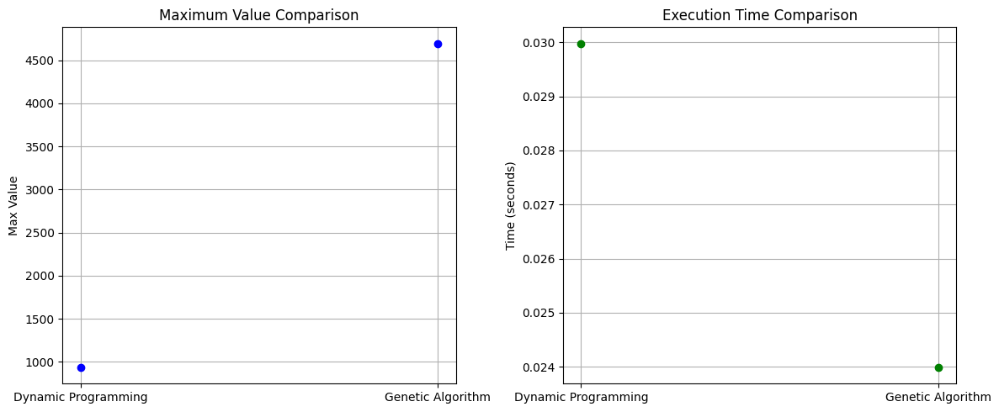

Stopping at 8

Dynamic Programming:
Max Value: 38013
Selected Items: [99, 94, 91, 90, 89, 88, 87, 85, 84, 83, 82, 81, 80, 79, 77, 76, 74, 73, 71, 68, 67, 66, 65, 64, 63, 62, 60, 59, 58, 57, 56, 54, 52, 51, 50, 49, 47, 46, 45, 43, 42, 39, 36, 33, 31, 29, 27, 26, 25, 23, 21, 20, 19, 16, 15, 14, 12, 9, 6, 4, 3, 2, 1, 0]
Execution Time: 0.1243 seconds

Genetic Algorithm:
Max Value: 50
Selected Items: [50, 84, 87]
Execution Time: 0.0380 seconds

Comparison:
DP Result: 38013, GA Result: 50
DP Time: 0.1243 s, GA Time: 0.0380 s
[38013, 50]
[0.1242985725402832, 0.03798031806945801]


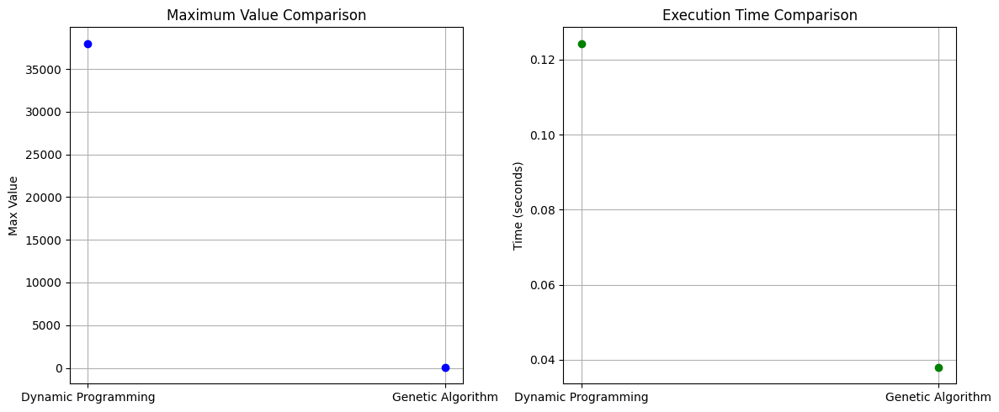

In [84]:
config = "config_1.txt"
pop, wgt, s, stop = getpop(config)
ec(s, wgt, pop, stop)
config = "config_2.txt"
pop, wgt, s, stop = getpop(config)
ec(s, wgt, pop, stop)